# Sparse and Non Negative Asymetric Auto Encoder without AMD
* Sparsity Regularizer : KL Divergence (KLdivSum), applied to the activation.
* Non-Negativity Regularizer : Non Negativity Constraint
* Number of epochs for training: 500 epochs
* Activation of the encoder: Sigmoid
* Encoder architecture: infoGAN
* Activation of the decoder: LeakyRELU (useless in case of Non-Negativity)
## Impact of the value of the sparsity parameters
* Sparsity objective: 0.01, 0.05, 0.1, 0.2
* Sparsity weight: 0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5



In [1]:
import numpy as np
import sys
import matplotlib.pyplot as plt
sys.path.append('../SourceCode')
import bastien_utils
from AsymAE_infoGAN.nonNegSparseAsymAEinfoGAN import Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint
import datetime
import morphoMaths
import keras
import pandas as pd
keras.__version__

Using TensorFlow backend.


'2.2.0'

In [2]:
FILE_PATH = "../"
x_test, _ = bastien_utils.load_data_fashionMNIST(FILE_PATH, train=False, test=True, subsetTest=False)
idx_small = np.arange(10)
idx_small[2] = 31
x_small = x_test[idx_small]
print('x_small shape:', x_small.shape)

x_small shape: (10, 28, 28, 1)


In [3]:
results = pd.read_csv("../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04results")
results

,Unnamed: 0,sparsity_objective,sparsity_weight,test_error,test_kl_loss,test_max_approx_error_toOriginal_dilatation,test_max_approx_error_toRec_dilatation,test_sparsity,training_error,training_kl_loss,training_max_approx_error_toOriginal_dilatation,training_max_approx_error_toRec_dilatation,training_sparsity
0,0,0.01,0.0001,0.010492,0.0,0.631906,0.665070,0.413679,0.010157,0.0,0.629737,0.663339,0.414041
1,1,0.05,0.0001,0.009552,0.0,0.824526,0.835347,0.375133,0.009218,0.0,0.822460,0.833569,0.375477
2,2,0.10,0.0001,0.008924,0.0,0.979231,1.001258,0.343127,0.008603,0.0,0.976616,0.999457,0.343485
3,3,0.20,0.0001,0.008334,0.0,1.325980,1.358910,0.288339,0.008041,0.0,1.323314,1.356597,0.288829
4,4,0.01,0.0005,0.013659,0.0,0.195934,0.194135,0.598011,0.013241,0.0,0.195104,0.193951,0.598106
5,5,0.05,0.0005,0.011073,0.0,0.280790,0.303753,0.517579,0.010628,0.0,0.279183,0.303122,0.517316
6,6,0.10,0.0005,0.009719,0.0,0.559068,0.566958,0.431443,0.009322,0.0,0.557427,0.566169,0.431534
7,7,0.20,0.0005,0.008571,0.0,1.122914,1.140125,0.314353,0.008254,0.0,1.120158,1.137938,0.314771
8,8,0.01,0.0010,0.015004,0.0,0.103008,0.102751,0.676505,0.014551,0.0,0.102299,0.102746,0.676431
9,9,0.05,0.0010,0.011473,0.0,0.202331,0.211262,0.565322,0.010965,0.0,0.201335,0.211077,0.564488


In [4]:
max_values = results.max(axis=0)
max_idx = results.idxmax()
min_values = results.min(axis=0)
min_idx = results.idxmin()
median_values = results.median()
std_values = results.std()
sparsity_objectives = results['sparsity_objective']
sparsity_weights = results['sparsity_weight']

In [5]:

print('***********************Maximum values**********************')
print(max_values[1:])
print('\n')
print('***********************Minimum values**********************')
print(min_values[1:])
print('\n')
print('***********************Median values**********************')
print(median_values[1:])


***********************Maximum values**********************
sparsity_objective                                 0.200000
sparsity_weight                                    0.500000
test_error                                         0.047130
test_kl_loss                                       0.000000
test_max_approx_error_toOriginal_dilatation        1.325980
test_max_approx_error_toRec_dilatation             1.358910
test_sparsity                                      0.836001
training_error                                     0.046200
training_kl_loss                                   0.000000
training_max_approx_error_toOriginal_dilatation    1.323314
training_max_approx_error_toRec_dilatation         1.356597
training_sparsity                                  0.837118
dtype: float64


***********************Minimum values**********************
sparsity_objective                                 0.010000
sparsity_weight                                    0.000100
test_error             

In [6]:
print('\033[1m'+'Lowest error: '+'\033[0m' , round(min_values['test_error'], 4), ', sparsity_objective=',sparsity_objectives[min_idx['test_error']], ', sparsity_weight=', sparsity_weights[min_idx['test_error']], '\n')
print('\033[1m'+'Highest error: '+'\033[0m', round(max_values['test_error'], 4), ', sparsity_objective=',sparsity_objectives[max_idx['test_error']], ', sparsity_weight=', sparsity_weights[max_idx['test_error']], '\n')
print('\033[1m'+'Least sparse: '+'\033[0m' , round(min_values['test_sparsity'], 4), ', sparsity_objective=',sparsity_objectives[min_idx['test_sparsity']], ', sparsity_weight=', sparsity_weights[min_idx['test_sparsity']], '\n')
print('\033[1m'+'Most sparse: '+'\033[0m', round(max_values['test_sparsity'], 4), ', sparsity_objective=',sparsity_objectives[max_idx['test_sparsity']], ', sparsity_weight=', sparsity_weights[max_idx['test_sparsity']], '\n')
print('\033[1m'+'Lowest Max-approximation error to dilatation of the originals: '+'\033[0m' , round(min_values['test_max_approx_error_toOriginal_dilatation'], 4), ', sparsity_objective=',sparsity_objectives[min_idx['test_max_approx_error_toOriginal_dilatation']], ', sparsity_weight=', sparsity_weights[min_idx['test_max_approx_error_toOriginal_dilatation']], '\n')
print('\033[1m'+'Highest  Max-approximation error to dilatation of the originals: '+'\033[0m', round(max_values['test_max_approx_error_toOriginal_dilatation'], 4), ', sparsity_objective=',sparsity_objectives[max_idx['test_max_approx_error_toOriginal_dilatation']], ', sparsity_weight=', sparsity_weights[max_idx['test_max_approx_error_toOriginal_dilatation']], '\n')
print('\033[1m'+'Lowest KL-loss: '+'\033[0m' , round(min_values['test_kl_loss'], 4), ', sparsity_objective=',sparsity_objectives[min_idx['test_kl_loss']], ', sparsity_weight=', sparsity_weights[min_idx['test_kl_loss']], '\n')
print('\033[1m'+'Highest KL-loss: '+'\033[0m', round(max_values['test_kl_loss'], 4), ', sparsity_objective=',sparsity_objectives[max_idx['test_kl_loss']], ', sparsity_weight=', sparsity_weights[max_idx['test_kl_loss']], '\n')
print('\033[1m'+'Lowest max-approximation error to dilatation of the reconstruction: '+'\033[0m' , round(min_values['test_max_approx_error_toRec_dilatation'], 5), ', sparsity_objective=',sparsity_objectives[min_idx['test_max_approx_error_toRec_dilatation']], ', sparsity_weight=', sparsity_weights[min_idx['test_max_approx_error_toRec_dilatation']], '\n')
print('\033[1m'+'Highest max-approximation error to dilatation of the reconstruction: '+'\033[0m', round(max_values['test_max_approx_error_toRec_dilatation'], 4), ', sparsity_objective=',sparsity_objectives[max_idx['test_max_approx_error_toRec_dilatation']], ', sparsity_weight=', sparsity_weights[max_idx['test_max_approx_error_toRec_dilatation']], '\n')


Lowest error:  0.0083 , sparsity_objective= 0.2 , sparsity_weight= 0.0001 

Highest error:  0.0471 , sparsity_objective= 0.01 , sparsity_weight= 0.5 

Least sparse:  0.2229 , sparsity_objective= 0.2 , sparsity_weight= 0.5 

Most sparse:  0.836 , sparsity_objective= 0.01 , sparsity_weight= 0.05 

Lowest Max-approximation error to dilatation of the originals:  0.0297 , sparsity_objective= 0.01 , sparsity_weight= 0.01 

Highest  Max-approximation error to dilatation of the originals:  1.326 , sparsity_objective= 0.2 , sparsity_weight= 0.0001 

Lowest KL-loss:  0.0 , sparsity_objective= 0.01 , sparsity_weight= 0.0001 

Highest KL-loss:  0.0 , sparsity_objective= 0.01 , sparsity_weight= 0.0001 

Lowest max-approximation error to dilatation of the reconstruction:  0.01194 , sparsity_objective= 0.01 , sparsity_weight= 0.05 

Highest max-approximation error to dilatation of the reconstruction:  1.3589 , sparsity_objective= 0.2 , sparsity_weight= 0.0001 



Nb:
* Lowest error reached with weakest sparsity constraints.
* Highest error reached with strongest sparsity constraints.
* The lowest sparsity measuer is not significant, as if all coefficients are very close to zero but are similar, then the sparsity measure from Hoyer 2004 is close to 0.
* Highest max-approximation error to dilatation of the originals and of the reconstruction reached with the weakest sparsity constraint.

In [4]:
sparsity_objectives = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_sparsityObjectives_dim100.npy')
sparsity_weights = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_sparsityWeights_dim100.npy')
test_mse = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_test_errors_dim100.npy')
train_mse = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_training_errors_dim100.npy')
test_kl_loss = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_test_kl_loss_dim100.npy')
train_kl_loss = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_training_kl_loss_dim100.npy')
test_max_approx_to_Original = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_test_max_approx_error_toOriginal_dilation_dim100.npy')
train_max_approx_to_Original = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_training_max_approx_error_toOriginal_dilatation_dim100.npy')
test_max_approx_to_Rec = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_test_max_approx_error_toRec_dilation_dim100.npy')
train_max_approx_to_Rec = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_training_max_approx_error_toRec_dilatation_dim100.npy')
test_sparsity = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_test_sparsity_dim100.npy')
train_sparsity = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_training_sparsity_dim100.npy')

In [9]:
svm_best_parameter_C = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_svm_best_param_C_dim100.npy')
svm_best_score = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_svm_score_dim100.npy')
svm_std = np.load('../Results/AsymAE_infoGAN/Sparse_NonNeg/KLdivSum_NonNegConstraint/TestOutputs/18_09_04_svm_std_dim100.npy')

Text(0.5,1,'Best linear svm classification score')

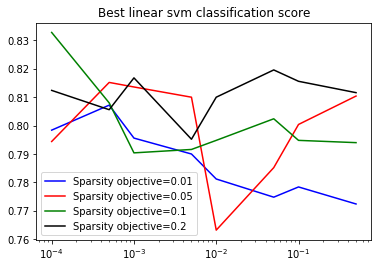

In [10]:
plt.plot(sparsity_weights, svm_best_score[:,0], 'b')
plt.plot(sparsity_weights, svm_best_score[:,1], 'r')
plt.plot(sparsity_weights, svm_best_score[:,2], 'g')
plt.plot(sparsity_weights, svm_best_score[:,3], 'k')
plt.xscale('log')
plt.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
plt.title('Best linear svm classification score')


In [74]:
flat_spr = test_sparsity.flatten()
idx_spr = np.argsort(flat_spr)
sort_spr = flat_spr[idx_spr]
sort_max_approx = test_max_approx_to_Original.flatten()[idx_spr]

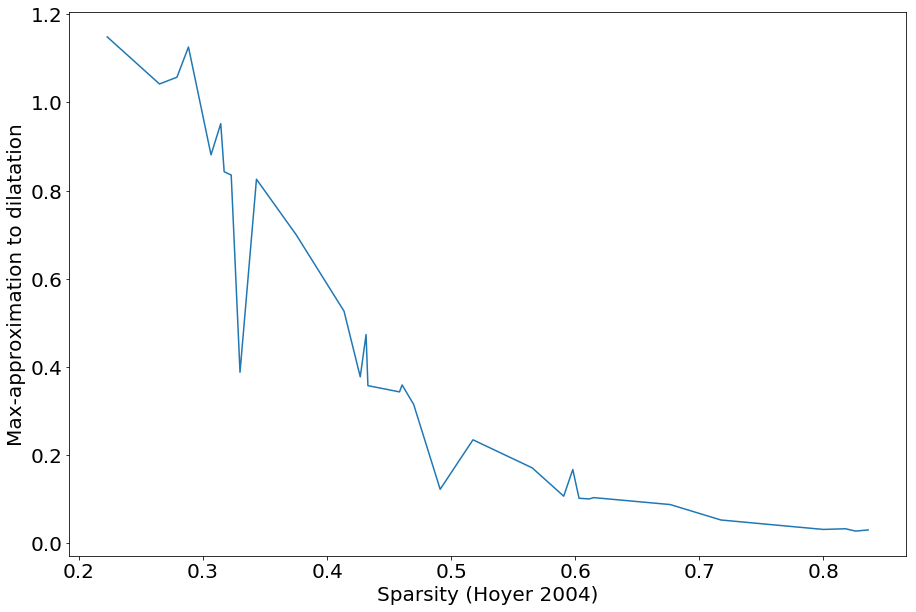

In [82]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 20
plt.figure(figsize=(15,10))
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.plot(sort_spr, sort_max_approx)
plt.xlabel('Sparsity (Hoyer 2004)')
plt.ylabel('Max-approximation to dilatation')
plt.show()

In [4]:
flat_mse = test_mse.flatten()
idx_mse = np.argsort(flat_mse)
sort_mse = flat_mse[idx_mse]
sort_max_approx = test_max_approx_to_Original.flatten()[idx_mse]

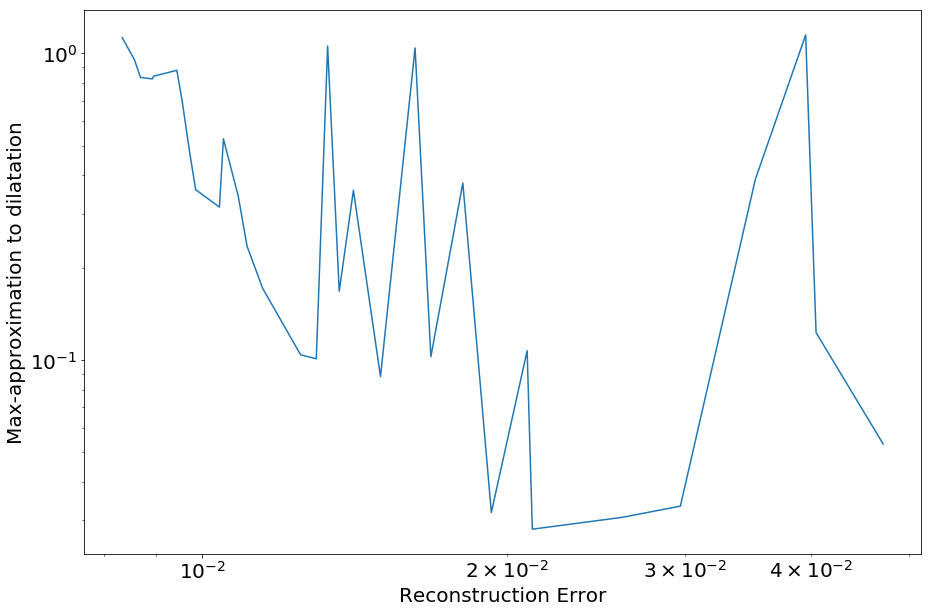

In [7]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 20
plt.figure(figsize=(15,10))
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.plot(sort_mse, sort_max_approx)
plt.xlabel('Reconstruction Error')
plt.ylabel('Max-approximation to dilatation')
plt.xscale('log')
plt.yscale('log')
plt.show()

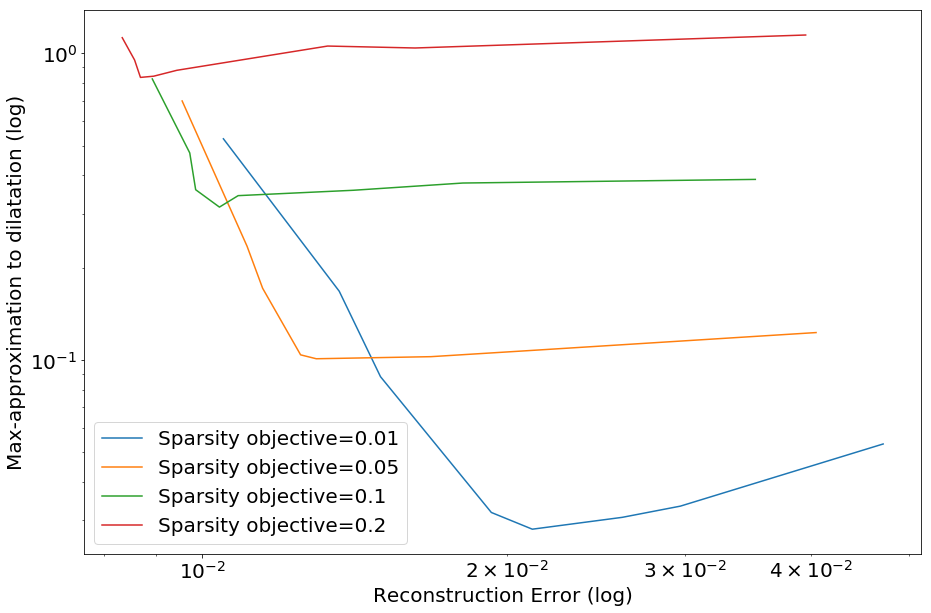

In [14]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 20
plt.figure(figsize=(15,10))
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.plot(test_mse[:,0], test_max_approx_to_Original[:,0])
plt.plot(test_mse[:,1], test_max_approx_to_Original[:,1])
plt.plot(test_mse[:,2], test_max_approx_to_Original[:,2])
plt.plot(test_mse[:,3], test_max_approx_to_Original[:,3])
plt.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
plt.xlabel('Reconstruction Error (log)')
plt.ylabel('Max-approximation to dilatation (log)')
plt.xscale('log')
plt.yscale('log')
plt.show()

In [8]:
test_mse.shape

(8, 4)

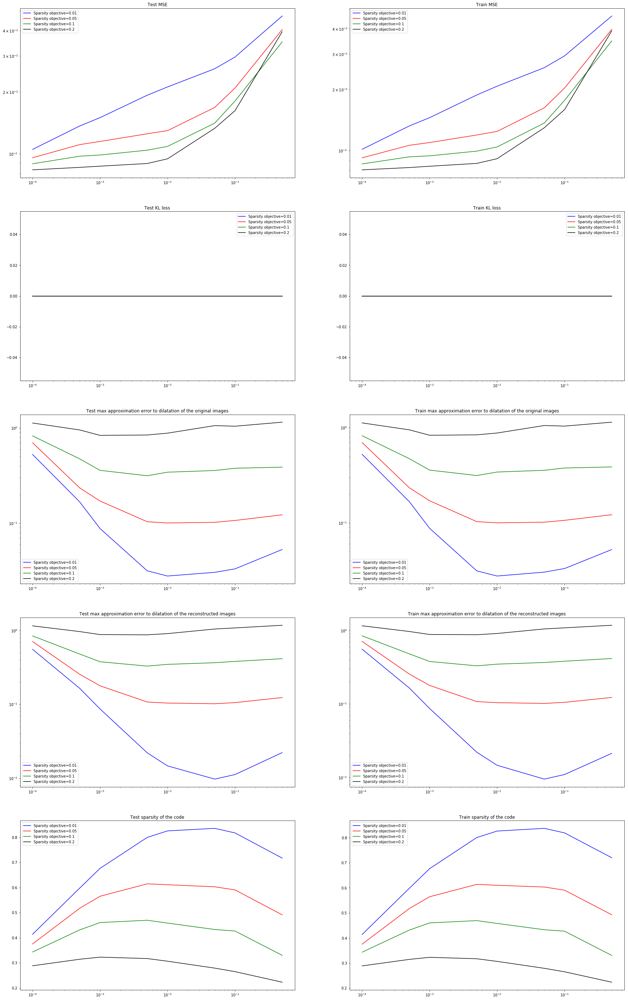

In [10]:
plt.figure(figsize=(30,50))

ax = plt.subplot(5, 2, 1)
ax.plot(sparsity_weights, test_mse[:,0], 'b')
ax.plot(sparsity_weights, test_mse[:,1], 'r')
ax.plot(sparsity_weights, test_mse[:,2], 'g')
ax.plot(sparsity_weights, test_mse[:,3], 'k')
ax.set_yscale('log')
ax.set_xscale('log')
ax.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
ax.set_title('Test MSE')

ax = plt.subplot(5, 2, 2)
ax.plot(sparsity_weights, train_mse[:,0], 'b')
ax.plot(sparsity_weights, train_mse[:,1], 'r')
ax.plot(sparsity_weights, train_mse[:,2], 'g')
ax.plot(sparsity_weights, train_mse[:,3], 'k')
ax.set_yscale('log')
ax.set_xscale('log')
ax.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
ax.set_title('Train MSE')

ax = plt.subplot(5, 2, 3)
ax.plot(sparsity_weights, test_kl_loss[:,0]/sparsity_weights, 'b')
ax.plot(sparsity_weights, test_kl_loss[:,1]/sparsity_weights, 'r')
ax.plot(sparsity_weights, test_kl_loss[:,2]/sparsity_weights, 'g')
ax.plot(sparsity_weights, test_kl_loss[:,3]/sparsity_weights, 'k')
ax.set_xscale('log')
ax.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
ax.set_title('Test KL loss')


ax = plt.subplot(5, 2, 4)
ax.plot(sparsity_weights, train_kl_loss[:,0]/sparsity_weights, 'b')
ax.plot(sparsity_weights, train_kl_loss[:,1]/sparsity_weights, 'r')
ax.plot(sparsity_weights, train_kl_loss[:,2]/sparsity_weights, 'g')
ax.plot(sparsity_weights, train_kl_loss[:,3]/sparsity_weights, 'k')
ax.set_xscale('log')
ax.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
ax.set_title('Train KL loss')

ax = plt.subplot(5, 2, 5)
ax.plot(sparsity_weights, test_max_approx_to_Original[:,0], 'b')
ax.plot(sparsity_weights, test_max_approx_to_Original[:,1], 'r')
ax.plot(sparsity_weights, test_max_approx_to_Original[:,2], 'g')
ax.plot(sparsity_weights, test_max_approx_to_Original[:,3], 'k')
ax.set_yscale('log')
ax.set_xscale('log')
ax.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
ax.set_title('Test max approximation error to dilatation of the original images')


ax = plt.subplot(5, 2, 6)
ax.plot(sparsity_weights, train_max_approx_to_Original[:,0], 'b')
ax.plot(sparsity_weights, train_max_approx_to_Original[:,1], 'r')
ax.plot(sparsity_weights, train_max_approx_to_Original[:,2], 'g')
ax.plot(sparsity_weights, train_max_approx_to_Original[:,3], 'k')
ax.set_yscale('log')
ax.set_xscale('log')
ax.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
ax.set_title('Train max approximation error to dilatation of the original images')


ax = plt.subplot(5, 2, 7)
ax.plot(sparsity_weights, test_max_approx_to_Rec[:,0], 'b')
ax.plot(sparsity_weights, test_max_approx_to_Rec[:,1], 'r')
ax.plot(sparsity_weights, test_max_approx_to_Rec[:,2], 'g')
ax.plot(sparsity_weights, test_max_approx_to_Rec[:,3], 'k')
ax.set_yscale('log')
ax.set_xscale('log')
ax.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
ax.set_title('Test max approximation error to dilatation of the reconstructed images')

ax = plt.subplot(5, 2, 8)
ax.plot(sparsity_weights, train_max_approx_to_Rec[:,0], 'b')
ax.plot(sparsity_weights, train_max_approx_to_Rec[:,1], 'r')
ax.plot(sparsity_weights, train_max_approx_to_Rec[:,2], 'g')
ax.plot(sparsity_weights, train_max_approx_to_Rec[:,3], 'k')
ax.set_yscale('log')
ax.set_xscale('log')
ax.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
ax.set_title('Train max approximation error to dilatation of the reconstructed images')


ax = plt.subplot(5, 2, 9)
ax.plot(sparsity_weights, test_sparsity[:,0], 'b')
ax.plot(sparsity_weights, test_sparsity[:,1], 'r')
ax.plot(sparsity_weights, test_sparsity[:,2], 'g')
ax.plot(sparsity_weights, test_sparsity[:,3], 'k')
ax.set_xscale('log')
ax.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
ax.set_title('Test sparsity of the code')


ax = plt.subplot(5, 2, 10)
ax.plot(sparsity_weights, train_sparsity[:,0], 'b')
ax.plot(sparsity_weights, train_sparsity[:,1], 'r')
ax.plot(sparsity_weights, train_sparsity[:,2], 'g')
ax.plot(sparsity_weights, train_sparsity[:,3], 'k')
ax.set_xscale('log')
ax.legend(['Sparsity objective=0.01', 'Sparsity objective=0.05', 'Sparsity objective=0.1', 'Sparsity objective=0.2'])
ax.set_title('Train sparsity of the code')

plt.show()

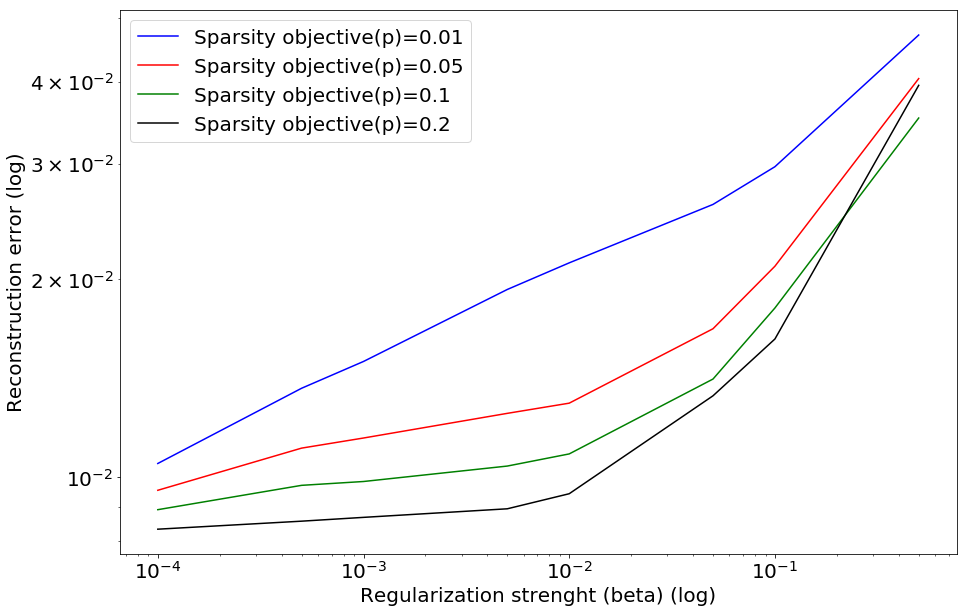

In [19]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 20
plt.figure(figsize=(15,10))
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.plot(sparsity_weights, test_mse[:,0], 'b')
plt.plot(sparsity_weights, test_mse[:,1], 'r')
plt.plot(sparsity_weights, test_mse[:,2], 'g')
plt.plot(sparsity_weights, test_mse[:,3], 'k')
plt.xscale('log')
plt.yscale('log')
plt.legend(['Sparsity objective(p)=0.01', 'Sparsity objective(p)=0.05', 'Sparsity objective(p)=0.1', 'Sparsity objective(p)=0.2'])
plt.ylabel('Reconstruction error (log)')
plt.xlabel('Regularization strenght (beta) (log)')
plt.show()

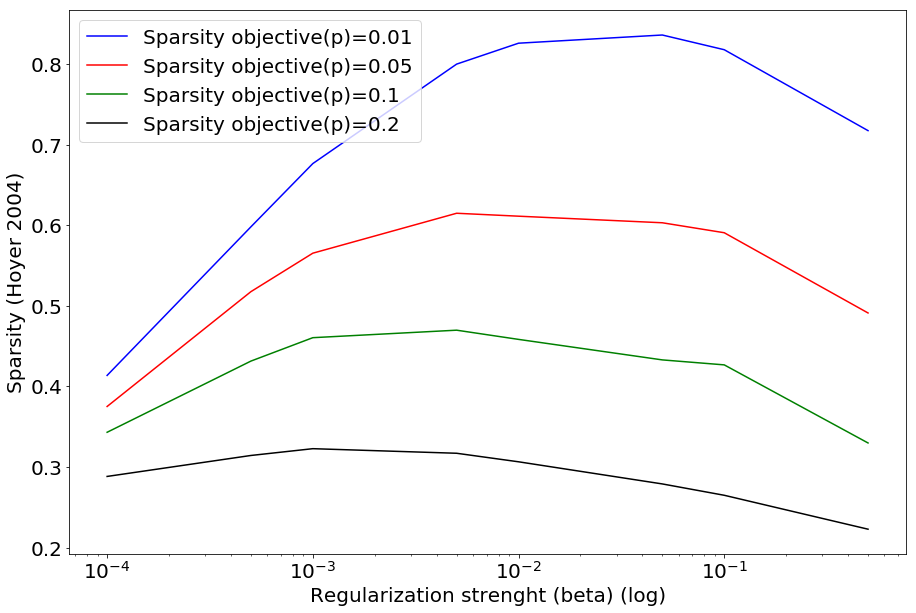

In [23]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 20
plt.figure(figsize=(15,10))
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.plot(sparsity_weights, test_sparsity[:,0], 'b')
plt.plot(sparsity_weights, test_sparsity[:,1], 'r')
plt.plot(sparsity_weights, test_sparsity[:,2], 'g')
plt.plot(sparsity_weights, test_sparsity[:,3], 'k')
plt.xscale('log')
plt.legend(['Sparsity objective(p)=0.01', 'Sparsity objective(p)=0.05', 'Sparsity objective(p)=0.1', 'Sparsity objective(p)=0.2'])
plt.ylabel('Sparsity (Hoyer 2004)')
plt.xlabel('Regularization strenght (beta) (log)')
plt.show()

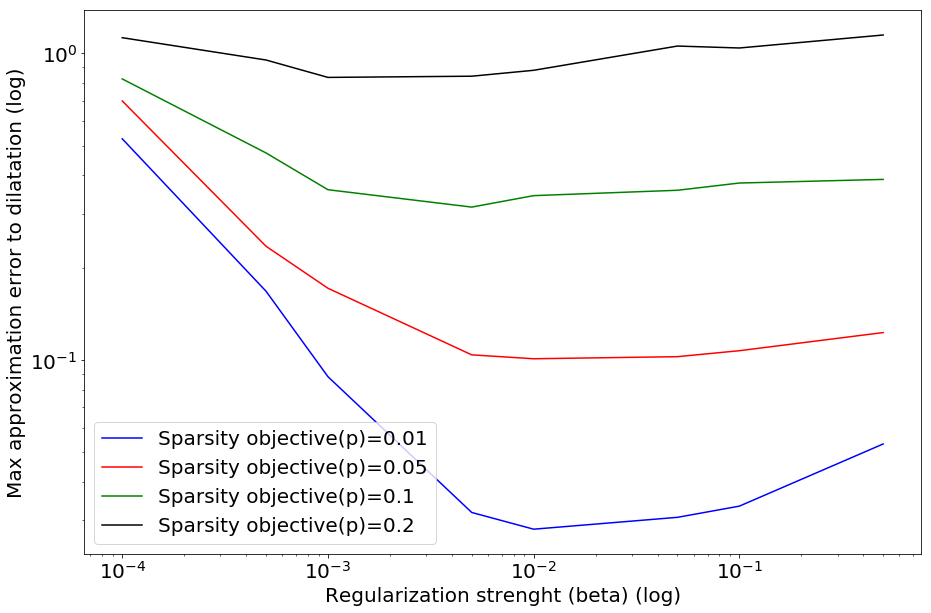

In [24]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 20
plt.figure(figsize=(15,10))
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.plot(sparsity_weights, test_max_approx_to_Original[:,0], 'b')
plt.plot(sparsity_weights, test_max_approx_to_Original[:,1], 'r')
plt.plot(sparsity_weights, test_max_approx_to_Original[:,2], 'g')
plt.plot(sparsity_weights, test_max_approx_to_Original[:,3], 'k')
plt.xscale('log')
plt.yscale('log')
plt.legend(['Sparsity objective(p)=0.01', 'Sparsity objective(p)=0.05', 'Sparsity objective(p)=0.1', 'Sparsity objective(p)=0.2'])
plt.ylabel('Max approximation error to dilatation (log)')
plt.xlabel('Regularization strenght (beta) (log)')
plt.show()

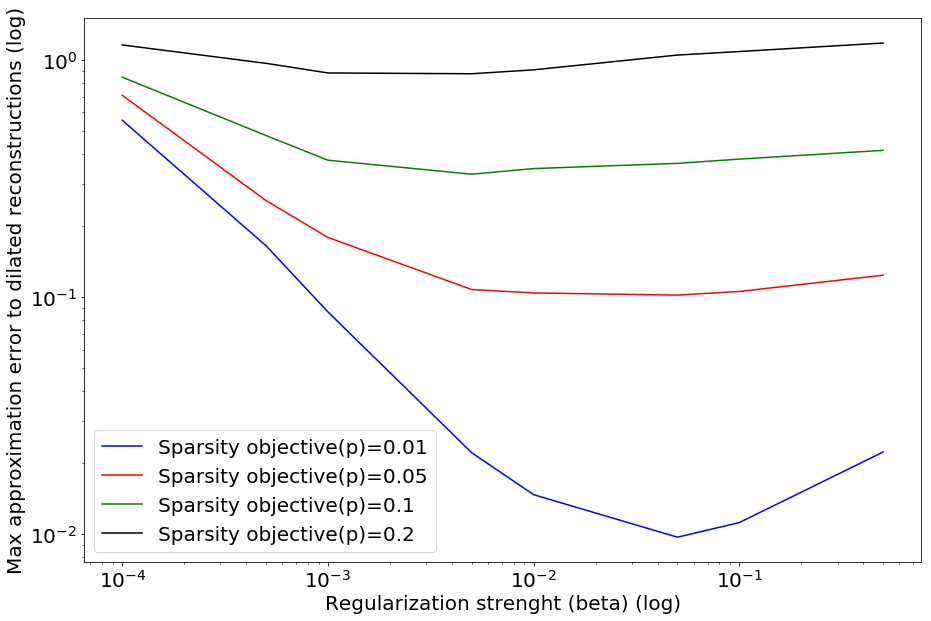

In [25]:
SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 20
plt.figure(figsize=(15,10))
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=BIGGER_SIZE)    # legend fontsize
plt.plot(sparsity_weights, test_max_approx_to_Rec[:,0], 'b')
plt.plot(sparsity_weights, test_max_approx_to_Rec[:,1], 'r')
plt.plot(sparsity_weights, test_max_approx_to_Rec[:,2], 'g')
plt.plot(sparsity_weights, test_max_approx_to_Rec[:,3], 'k')
plt.xscale('log')
plt.yscale('log')
plt.legend(['Sparsity objective(p)=0.01', 'Sparsity objective(p)=0.05', 'Sparsity objective(p)=0.1', 'Sparsity objective(p)=0.2'])
plt.ylabel('Max approximation error to dilated reconstructions (log)')
plt.xlabel('Regularization strenght (beta) (log)')
plt.show()

# 1. Sparsity_Objective = 0.01

## 1.1 Sparsity_weight = 0.0001 (sp_o = 0.01)

Original images and reconstructions - Reconstruction error:  0.010492499722540379


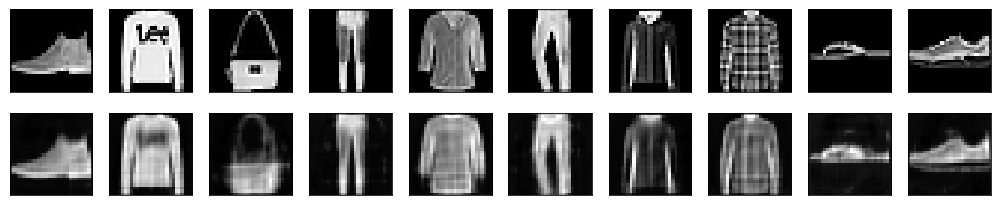

Histograms of the encodings - Sparsity (Hoyer):  0.4136788547039032


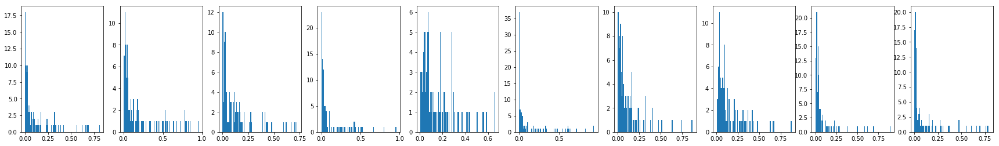

Atom images of the decoder


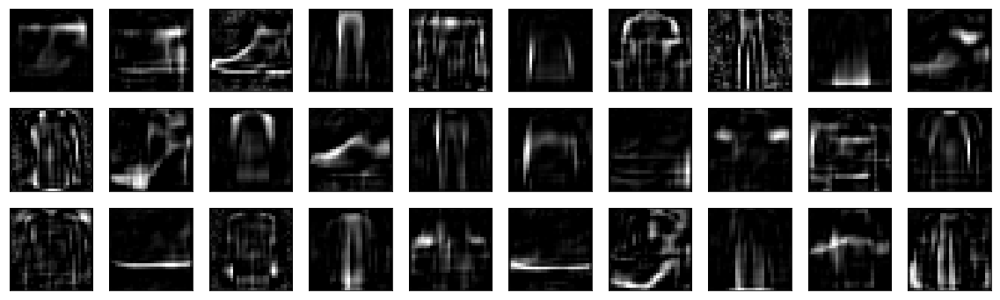

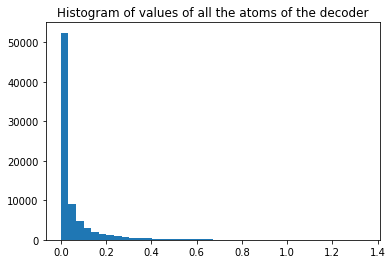

In [4]:
i = np.arange(8)[sparsity_weights==0.0001][0]
j = np.arange(4)[sparsity_objectives==0.01][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_04_dim100_KLdivSum_0.0001_0.01_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

In [9]:
round(AE.get_parameters_value()['sparsity_weight'], 4)

0.0001

In [15]:
round(AE.get_parameters_value()['sparsity_objective'], 5)

0.01

Dilatation of the original images


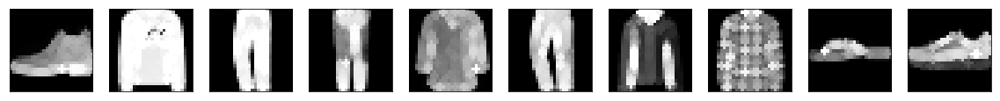

Dilatation of the reconstructions


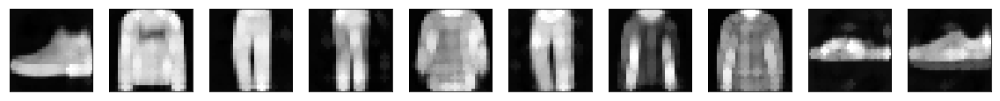

Original images and max-approximation to dilatation
Max-approx error to original:  0.6319057025909424  - Max-approx error to reconstruction:  0.6650702548980713


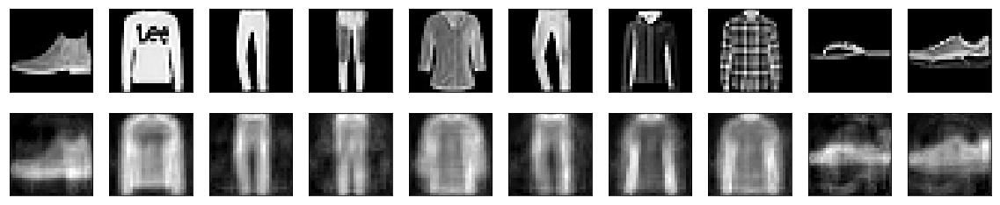

Dilated of the atom images of the decoder


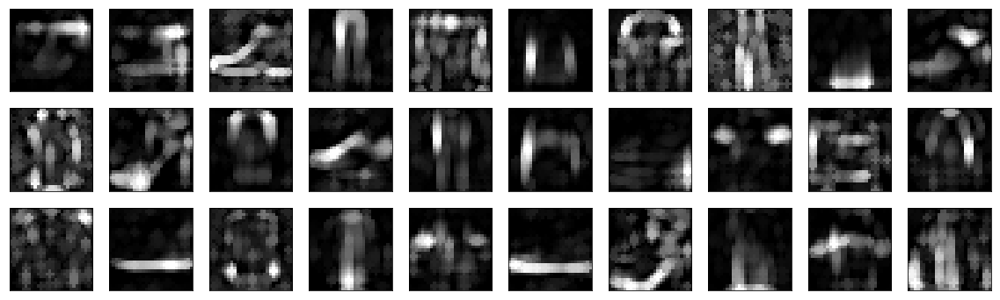

In [10]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 1.2 Sparsity_weight = 0.0005 (sp_o = 0.01)

Original images and reconstructions - Reconstruction error:  0.013658977907896042


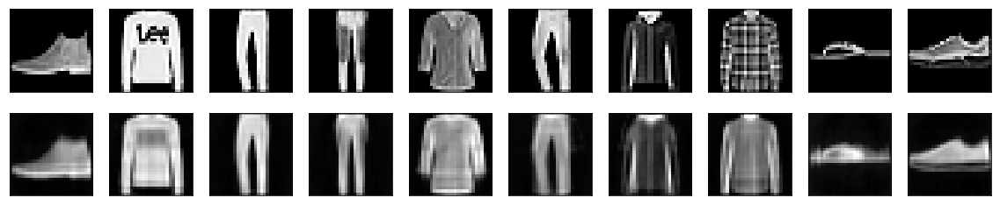

Histograms of the encodings - Sparsity (Hoyer):  0.5980108380317688


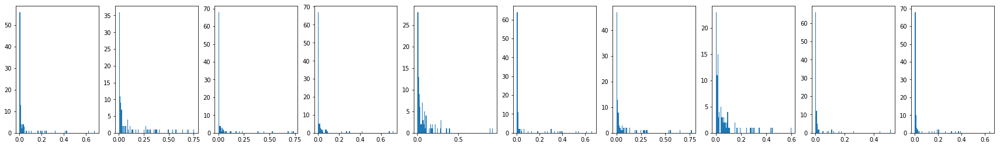

Atom images of the decoder


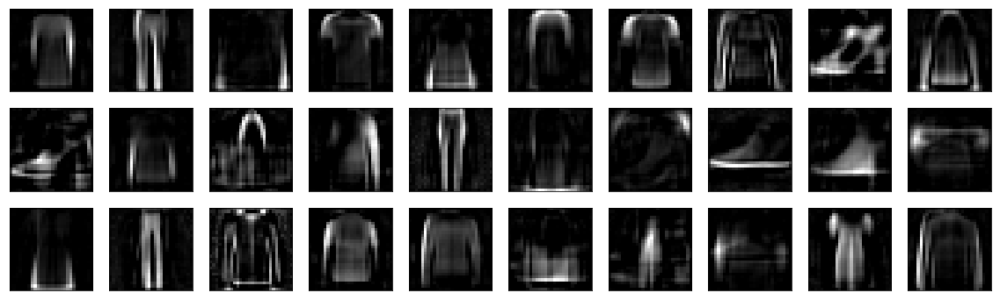

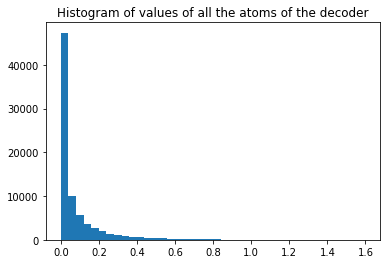

In [11]:
sp_o = 0.01
sp_w = 0.0005
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_04_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


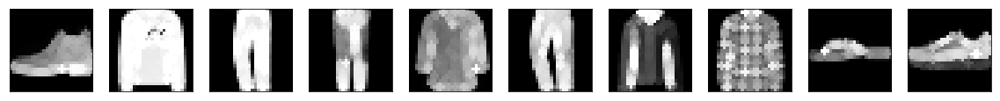

Dilatation of the reconstructions


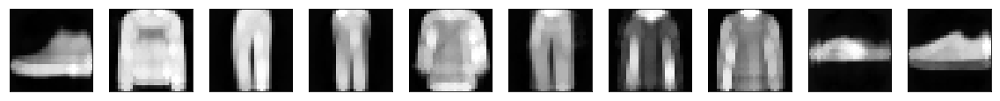

Original images and max-approximation to dilatation
Max-approx error to original:  0.1959338973402977  - Max-approx error to reconstruction:  0.19413471887111663


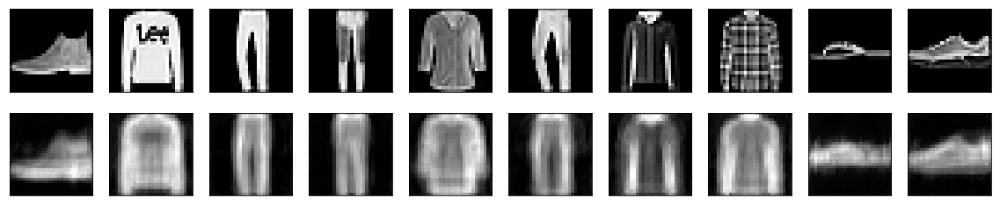

Dilated of the atom images of the decoder


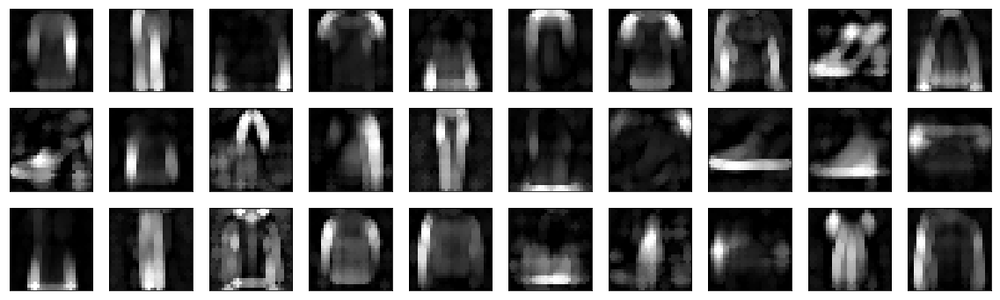

In [12]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 1.3 Sparsity_weight = 0.001 (sp_o = 0.01)

Original images and reconstructions - Reconstruction error:  0.015004394590854645


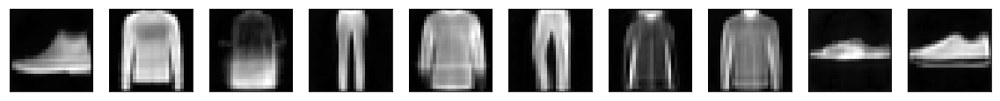

Histograms of the encodings - Sparsity (Hoyer):  0.6765046119689941


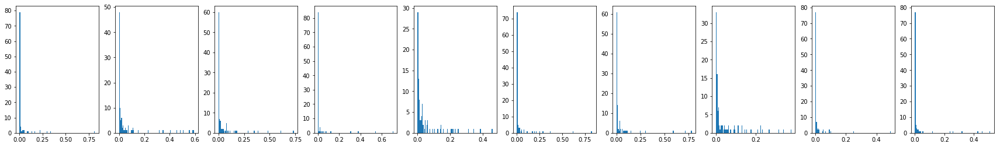

Atom images of the decoder


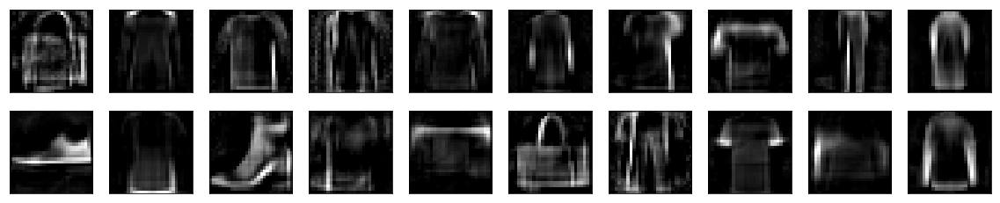

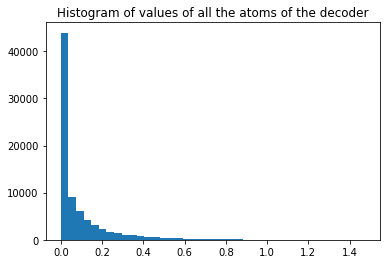

In [4]:
sp_o = 0.01
sp_w = 0.001
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small, plot_input=False)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=20)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


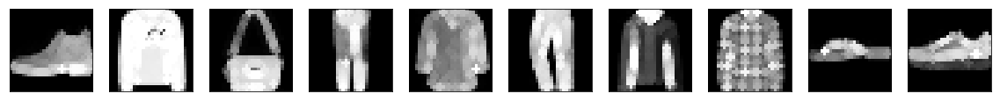

Dilatation of the reconstructions


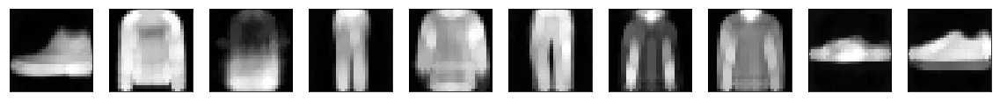

Original images and max-approximation to dilatation
Max-approx error to original:  0.0882372688114643  - Max-approx error to reconstruction:  0.08656741932034492


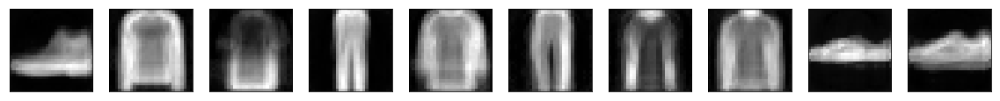

Dilated of the atom images of the decoder


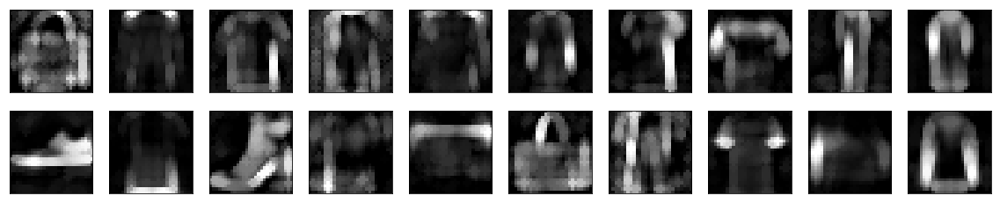

In [9]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small, plot_input=False)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=20)

In [6]:
metrics.mean_number_overlapped_atoms_at_each_pixel(AE.atom_images_decoder())

8.747049947858464

In [7]:
metrics.mean_Jaccard_index(AE.atom_images_decoder())

0.010969444688707463

In [11]:
metrics.mean_overlap_coef(AE.atom_images_decoder())

0.03800134480423263

In [13]:
metrics.mean_number_overlapped_atoms_at_each_pixel(AE_dil.atom_images_decoder())

15.011673040079828

In [16]:
np.median(AE.atom_images_decoder())

0.02372213

In [17]:
np.max(AE.atom_images_decoder())

1.4752775

In [23]:
np.quantile(AE.atom_images_decoder(),0.97)

0.4969561210274696

In [14]:
metrics.mean_Jaccard_index(AE_dil.atom_images_decoder())

0.030137587832240978

In [15]:
metrics.mean_overlap_coef(AE_dil.atom_images_decoder())

0.08590563754696375

In [5]:
from skimage import filters

def mean_Otsu_binarization_threshold(images):
    nb_images,_,_ = images.shape
    thresholds = np.zeros(nb_images)
    for i in range(nb_images):
        thresholds[i] = filters.threshold_otsu(images[i])
    return np.mean(thresholds)

def jaccard_index(A,B):
    if (not np.any(A)) and (not np.any(B)):
        #print("Warning: Two empty sets given in computation of jaccard index...returning 0...")
        return 0
    else:
        A_union_B = np.logical_or(A,B)
        A_inter_B = np.logical_and(A,B)
        jaccard_index = np.sum(A_inter_B)/np.sum(A_union_B)
        return jaccard_index

def pair_wise_mean_Jaccard_index_of_binary_images(binary_images):
    nb_images,_,_ = binary_images.shape
    nb_pairs = nb_images*(nb_images-1)/2.
    s = 0
    for i in range(nb_images):
        for j in range(i+1,nb_images):
            s += jaccard_index(binary_images[i], binary_images[j])
    return s/nb_pairs

def pair_wise_mean_Jaccard_index_of_weighted_atoms(atoms, h_test_image):
    nb_atoms,nb_rows,nb_columns,_ = atoms.shape
    weighted_atoms = np.dot(np.diag(h_test_image), atoms.reshape((nb_atoms,nb_rows*nb_columns))).reshape((nb_atoms,nb_rows,nb_columns))
    binarization_theshold = mean_Otsu_binarization_threshold(weighted_atoms)
    print('*****Otsu binarization  threshold : ', binarization_theshold,' ******')
    bin_weighted_atoms = weighted_atoms > binarization_theshold
    return pair_wise_mean_Jaccard_index_of_binary_images(bin_weighted_atoms)

def mean_jaccard_index_of_atoms_weighted_by_images_code(atoms, h_test):
    nb_samples, _ = h_test.shape
    s = 0
    for i in range(nb_samples):
        print('******Image: ', i, ' ******')
        tmp = pair_wise_mean_Jaccard_index_of_weighted_atoms(atoms, h_test[i])
        s += tmp
        print('***Mean Jaccard Index: ', tmp)
        print('\n')
    return s/nb_samples

In [7]:
h_test = AE.encode(x_test)
atoms = AE.atom_images_decoder()

In [8]:
mean_jaccard_index_of_atoms_weighted_by_images_code(atoms, h_test[:1000])

******Image:  0  ******
*****Otsu binarization  threshold :  0.00845397126660373  ******
***Mean Jaccard Index:  0.005266436306503662


******Image:  1  ******
*****Otsu binarization  threshold :  0.015767728861357  ******
***Mean Jaccard Index:  0.017297235699192195


******Image:  2  ******
*****Otsu binarization  threshold :  0.010214532701289159  ******
***Mean Jaccard Index:  0.013793225379742754


******Image:  3  ******
*****Otsu binarization  threshold :  0.005977963372154136  ******
***Mean Jaccard Index:  0.004429700536147746


******Image:  4  ******
*****Otsu binarization  threshold :  0.01274117745582771  ******
***Mean Jaccard Index:  0.02731998470872428


******Image:  5  ******
*****Otsu binarization  threshold :  0.01016025653937504  ******
***Mean Jaccard Index:  0.007017707804374198


******Image:  6  ******
*****Otsu binarization  threshold :  0.010690427360923422  ******
***Mean Jaccard Index:  0.007993064591985928


******Image:  7  ******
*****Otsu binarization  

***Mean Jaccard Index:  0.004374218004635974


******Image:  61  ******
*****Otsu binarization  threshold :  0.010895637583059852  ******
***Mean Jaccard Index:  0.004698192237613707


******Image:  62  ******
*****Otsu binarization  threshold :  0.014416941320087062  ******
***Mean Jaccard Index:  0.014048186331503721


******Image:  63  ******
*****Otsu binarization  threshold :  0.007780879491010637  ******
***Mean Jaccard Index:  0.007068807713356937


******Image:  64  ******
*****Otsu binarization  threshold :  0.00809868580480952  ******
***Mean Jaccard Index:  0.0037761322830805726


******Image:  65  ******
*****Otsu binarization  threshold :  0.005827552131609082  ******
***Mean Jaccard Index:  0.005857400311903482


******Image:  66  ******
*****Otsu binarization  threshold :  0.008158941221045097  ******
***Mean Jaccard Index:  0.019727445758940268


******Image:  67  ******
*****Otsu binarization  threshold :  0.010408008729036737  ******
***Mean Jaccard Index:  0.00887821

***Mean Jaccard Index:  0.01619889428196176


******Image:  122  ******
*****Otsu binarization  threshold :  0.010156257861381164  ******
***Mean Jaccard Index:  0.015334385769242828


******Image:  123  ******
*****Otsu binarization  threshold :  0.011407796338675098  ******
***Mean Jaccard Index:  0.006131126996943741


******Image:  124  ******
*****Otsu binarization  threshold :  0.011551888765279728  ******
***Mean Jaccard Index:  0.01258827315151572


******Image:  125  ******
*****Otsu binarization  threshold :  0.013927581302609723  ******
***Mean Jaccard Index:  0.016193154181766988


******Image:  126  ******
*****Otsu binarization  threshold :  0.012649769281924819  ******
***Mean Jaccard Index:  0.02493131363784646


******Image:  127  ******
*****Otsu binarization  threshold :  0.013752392862224952  ******
***Mean Jaccard Index:  0.014012687805852027


******Image:  128  ******
*****Otsu binarization  threshold :  0.006788290368044727  ******
***Mean Jaccard Index:  0.0081

***Mean Jaccard Index:  0.01624921369405686


******Image:  183  ******
*****Otsu binarization  threshold :  0.014471915088088282  ******
***Mean Jaccard Index:  0.02062245834859448


******Image:  184  ******
*****Otsu binarization  threshold :  0.007546378136219119  ******
***Mean Jaccard Index:  0.002918261152166224


******Image:  185  ******
*****Otsu binarization  threshold :  0.011454044235078982  ******
***Mean Jaccard Index:  0.011152806925093448


******Image:  186  ******
*****Otsu binarization  threshold :  0.010025154615523207  ******
***Mean Jaccard Index:  0.009611936344891414


******Image:  187  ******
*****Otsu binarization  threshold :  0.014656612708727153  ******
***Mean Jaccard Index:  0.01969236474263219


******Image:  188  ******
*****Otsu binarization  threshold :  0.01626661208771111  ******
***Mean Jaccard Index:  0.023996243988253386


******Image:  189  ******
*****Otsu binarization  threshold :  0.007214830974132838  ******
***Mean Jaccard Index:  0.00158

***Mean Jaccard Index:  0.012409877238567187


******Image:  243  ******
*****Otsu binarization  threshold :  0.008226314626499516  ******
***Mean Jaccard Index:  0.015928122808543683


******Image:  244  ******
*****Otsu binarization  threshold :  0.01331897834731535  ******
***Mean Jaccard Index:  0.011006593345394607


******Image:  245  ******
*****Otsu binarization  threshold :  0.014492233929959185  ******
***Mean Jaccard Index:  0.019460212454318195


******Image:  246  ******
*****Otsu binarization  threshold :  0.010394287979434012  ******
***Mean Jaccard Index:  0.02268238268908256


******Image:  247  ******
*****Otsu binarization  threshold :  0.01301812425208027  ******
***Mean Jaccard Index:  0.016257367275678027


******Image:  248  ******
*****Otsu binarization  threshold :  0.012406535397458356  ******
***Mean Jaccard Index:  0.026585731971983863


******Image:  249  ******
*****Otsu binarization  threshold :  0.01616859735202297  ******
***Mean Jaccard Index:  0.01966

***Mean Jaccard Index:  0.026681257421412335


******Image:  304  ******
*****Otsu binarization  threshold :  0.016047086001417483  ******
***Mean Jaccard Index:  0.02567458803533744


******Image:  305  ******
*****Otsu binarization  threshold :  0.013906126790425332  ******
***Mean Jaccard Index:  0.016009263719488635


******Image:  306  ******
*****Otsu binarization  threshold :  0.013530549403722034  ******
***Mean Jaccard Index:  0.015477216967468429


******Image:  307  ******
*****Otsu binarization  threshold :  0.010830958003116392  ******
***Mean Jaccard Index:  0.010064142827032708


******Image:  308  ******
*****Otsu binarization  threshold :  0.008098533900583788  ******
***Mean Jaccard Index:  0.005865702546062575


******Image:  309  ******
*****Otsu binarization  threshold :  0.010024786589679025  ******
***Mean Jaccard Index:  0.005009498561032327


******Image:  310  ******
*****Otsu binarization  threshold :  0.007761327178423016  ******
***Mean Jaccard Index:  0.00

*****Otsu binarization  threshold :  0.012946237523101445  ******
***Mean Jaccard Index:  0.01510107410106181


******Image:  364  ******
*****Otsu binarization  threshold :  0.014602257274482326  ******
***Mean Jaccard Index:  0.023781769945808006


******Image:  365  ******
*****Otsu binarization  threshold :  0.006845591829005571  ******
***Mean Jaccard Index:  0.005814612889333438


******Image:  366  ******
*****Otsu binarization  threshold :  0.010966875521385191  ******
***Mean Jaccard Index:  0.011219753358984627


******Image:  367  ******
*****Otsu binarization  threshold :  0.016763734747000852  ******
***Mean Jaccard Index:  0.026853054917493086


******Image:  368  ******
*****Otsu binarization  threshold :  0.018844774822282487  ******
***Mean Jaccard Index:  0.026634114349106338


******Image:  369  ******
*****Otsu binarization  threshold :  0.007638131127816905  ******
***Mean Jaccard Index:  0.004395095386493928


******Image:  370  ******
*****Otsu binarization  thre

***Mean Jaccard Index:  0.008490349781172147


******Image:  424  ******
*****Otsu binarization  threshold :  0.015655861324758005  ******
***Mean Jaccard Index:  0.012247834841221935


******Image:  425  ******
*****Otsu binarization  threshold :  0.011886161738875672  ******
***Mean Jaccard Index:  0.015123046037894114


******Image:  426  ******
*****Otsu binarization  threshold :  0.013470344345241756  ******
***Mean Jaccard Index:  0.017976897717652568


******Image:  427  ******
*****Otsu binarization  threshold :  0.014029416295625197  ******
***Mean Jaccard Index:  0.016408298940274676


******Image:  428  ******
*****Otsu binarization  threshold :  0.011304130872122186  ******
***Mean Jaccard Index:  0.011133496303208321


******Image:  429  ******
*****Otsu binarization  threshold :  0.012853333722014214  ******
***Mean Jaccard Index:  0.021651184609074458


******Image:  430  ******
*****Otsu binarization  threshold :  0.007294764382677386  ******
***Mean Jaccard Index:  0.0

***Mean Jaccard Index:  0.013455077371899295


******Image:  484  ******
*****Otsu binarization  threshold :  0.007693699295546708  ******
***Mean Jaccard Index:  0.004722149098758832


******Image:  485  ******
*****Otsu binarization  threshold :  0.009812179614073102  ******
***Mean Jaccard Index:  0.0101512890432585


******Image:  486  ******
*****Otsu binarization  threshold :  0.012640712025931861  ******
***Mean Jaccard Index:  0.014844855889544985


******Image:  487  ******
*****Otsu binarization  threshold :  0.005422413244323252  ******
***Mean Jaccard Index:  0.007888240099053232


******Image:  488  ******
*****Otsu binarization  threshold :  0.011510406766174128  ******
***Mean Jaccard Index:  0.01638379910586457


******Image:  489  ******
*****Otsu binarization  threshold :  0.0182632385900979  ******
***Mean Jaccard Index:  0.012090263722964121


******Image:  490  ******
*****Otsu binarization  threshold :  0.015517028912545356  ******
***Mean Jaccard Index:  0.015793

*****Otsu binarization  threshold :  0.007084602311388153  ******
***Mean Jaccard Index:  0.02254889166299771


******Image:  545  ******
*****Otsu binarization  threshold :  0.007799880537445461  ******
***Mean Jaccard Index:  0.005927013843640467


******Image:  546  ******
*****Otsu binarization  threshold :  0.01217135540144227  ******
***Mean Jaccard Index:  0.013285055965507546


******Image:  547  ******
*****Otsu binarization  threshold :  0.015957877018590808  ******
***Mean Jaccard Index:  0.024154331964791727


******Image:  548  ******
*****Otsu binarization  threshold :  0.010605911660240963  ******
***Mean Jaccard Index:  0.02436347174887256


******Image:  549  ******
*****Otsu binarization  threshold :  0.014990254244812604  ******
***Mean Jaccard Index:  0.014949497678262112


******Image:  550  ******
*****Otsu binarization  threshold :  0.00766226340598223  ******
***Mean Jaccard Index:  0.01726877405648496


******Image:  551  ******
*****Otsu binarization  threshol

***Mean Jaccard Index:  0.007398472356461961


******Image:  604  ******
*****Otsu binarization  threshold :  0.009921022161688598  ******
***Mean Jaccard Index:  0.008172336092223018


******Image:  605  ******
*****Otsu binarization  threshold :  0.00919179966662341  ******
***Mean Jaccard Index:  0.01618421300621401


******Image:  606  ******
*****Otsu binarization  threshold :  0.010688617383038945  ******
***Mean Jaccard Index:  0.012153985668997771


******Image:  607  ******
*****Otsu binarization  threshold :  0.007268065126991133  ******
***Mean Jaccard Index:  0.014405271539103969


******Image:  608  ******
*****Otsu binarization  threshold :  0.011602017550103483  ******
***Mean Jaccard Index:  0.015662738699675657


******Image:  609  ******
*****Otsu binarization  threshold :  0.010505587594939242  ******
***Mean Jaccard Index:  0.006194047129032345


******Image:  610  ******
*****Otsu binarization  threshold :  0.009677082431680901  ******
***Mean Jaccard Index:  0.025

***Mean Jaccard Index:  0.012111682279809641


******Image:  664  ******
*****Otsu binarization  threshold :  0.008407769233817817  ******
***Mean Jaccard Index:  0.015167246061807674


******Image:  665  ******
*****Otsu binarization  threshold :  0.016857425084817804  ******
***Mean Jaccard Index:  0.026722369149937912


******Image:  666  ******
*****Otsu binarization  threshold :  0.00962916518444672  ******
***Mean Jaccard Index:  0.007491307338258985


******Image:  667  ******
*****Otsu binarization  threshold :  0.015176081227546092  ******
***Mean Jaccard Index:  0.01489120112430523


******Image:  668  ******
*****Otsu binarization  threshold :  0.01041960194997955  ******
***Mean Jaccard Index:  0.015778264038831997


******Image:  669  ******
*****Otsu binarization  threshold :  0.010965166103233628  ******
***Mean Jaccard Index:  0.019243905577557785


******Image:  670  ******
*****Otsu binarization  threshold :  0.011721282430225983  ******
***Mean Jaccard Index:  0.0136

***Mean Jaccard Index:  0.020715090193795267


******Image:  724  ******
*****Otsu binarization  threshold :  0.007364523714786628  ******
***Mean Jaccard Index:  0.02013036262148976


******Image:  725  ******
*****Otsu binarization  threshold :  0.013049237427912886  ******
***Mean Jaccard Index:  0.023723232652944633


******Image:  726  ******
*****Otsu binarization  threshold :  0.012855364779461524  ******
***Mean Jaccard Index:  0.0238607221276572


******Image:  727  ******
*****Otsu binarization  threshold :  0.014041315769500216  ******
***Mean Jaccard Index:  0.017838518822734864


******Image:  728  ******
*****Otsu binarization  threshold :  0.0066967246351862285  ******
***Mean Jaccard Index:  0.005531897296122725


******Image:  729  ******
*****Otsu binarization  threshold :  0.006484593257946472  ******
***Mean Jaccard Index:  0.0066146765509690455


******Image:  730  ******
*****Otsu binarization  threshold :  0.010836181560194972  ******
***Mean Jaccard Index:  0.01

*****Otsu binarization  threshold :  0.008846956682718883  ******
***Mean Jaccard Index:  0.00654022907630929


******Image:  786  ******
*****Otsu binarization  threshold :  0.014216837337389734  ******
***Mean Jaccard Index:  0.014235229939606813


******Image:  787  ******
*****Otsu binarization  threshold :  0.008674975939734396  ******
***Mean Jaccard Index:  0.0031717213472294416


******Image:  788  ******
*****Otsu binarization  threshold :  0.01194561872311624  ******
***Mean Jaccard Index:  0.009151031717820156


******Image:  789  ******
*****Otsu binarization  threshold :  0.007797613405869015  ******
***Mean Jaccard Index:  0.003438677006446465


******Image:  790  ******
*****Otsu binarization  threshold :  0.007966225005349088  ******
***Mean Jaccard Index:  0.005691660215967522


******Image:  791  ******
*****Otsu binarization  threshold :  0.010112975395713875  ******
***Mean Jaccard Index:  0.00783597087646229


******Image:  792  ******
*****Otsu binarization  thres

***Mean Jaccard Index:  0.003184905017696687


******Image:  846  ******
*****Otsu binarization  threshold :  0.01091417439871293  ******
***Mean Jaccard Index:  0.014892134975552517


******Image:  847  ******
*****Otsu binarization  threshold :  0.0077722849771907935  ******
***Mean Jaccard Index:  0.0070479522122833295


******Image:  848  ******
*****Otsu binarization  threshold :  0.011644807281609246  ******
***Mean Jaccard Index:  0.010723632974440674


******Image:  849  ******
*****Otsu binarization  threshold :  0.011426394978689131  ******
***Mean Jaccard Index:  0.017261872922275774


******Image:  850  ******
*****Otsu binarization  threshold :  0.014083682537911955  ******
***Mean Jaccard Index:  0.010944697610577817


******Image:  851  ******
*****Otsu binarization  threshold :  0.011619432676379802  ******
***Mean Jaccard Index:  0.02348039508660461


******Image:  852  ******
*****Otsu binarization  threshold :  0.005542520159970081  ******
***Mean Jaccard Index:  0.0

*****Otsu binarization  threshold :  0.01437465634138789  ******
***Mean Jaccard Index:  0.01749522840725394


******Image:  906  ******
*****Otsu binarization  threshold :  0.008964887728234316  ******
***Mean Jaccard Index:  0.024178163385575036


******Image:  907  ******
*****Otsu binarization  threshold :  0.015594510597220506  ******
***Mean Jaccard Index:  0.021607864494060533


******Image:  908  ******
*****Otsu binarization  threshold :  0.015352234953279548  ******
***Mean Jaccard Index:  0.014699026504712678


******Image:  909  ******
*****Otsu binarization  threshold :  0.007169792696131481  ******
***Mean Jaccard Index:  0.018692233755493153


******Image:  910  ******
*****Otsu binarization  threshold :  0.013874329884492909  ******
***Mean Jaccard Index:  0.021948254768748062


******Image:  911  ******
*****Otsu binarization  threshold :  0.014670824925706255  ******
***Mean Jaccard Index:  0.020861966403954237


******Image:  912  ******
*****Otsu binarization  thres

***Mean Jaccard Index:  0.022121570358027125


******Image:  965  ******
*****Otsu binarization  threshold :  0.014015089385902684  ******
***Mean Jaccard Index:  0.02843685312409283


******Image:  966  ******
*****Otsu binarization  threshold :  0.016399526226045964  ******
***Mean Jaccard Index:  0.019845643788254885


******Image:  967  ******
*****Otsu binarization  threshold :  0.013538164457168022  ******
***Mean Jaccard Index:  0.013828190633650152


******Image:  968  ******
*****Otsu binarization  threshold :  0.009684154557035071  ******
***Mean Jaccard Index:  0.0207732003916466


******Image:  969  ******
*****Otsu binarization  threshold :  0.012014589480386348  ******
***Mean Jaccard Index:  0.016373016561367405


******Image:  970  ******
*****Otsu binarization  threshold :  0.009945359853682022  ******
***Mean Jaccard Index:  0.011795482594325888


******Image:  971  ******
*****Otsu binarization  threshold :  0.010997443275266505  ******
***Mean Jaccard Index:  0.0107

0.014081249068849631

In [10]:
mean_jaccard_index_of_atoms_weighted_by_images_code(AE_dil.atom_images_decoder(), h_test[:1000])

******Image:  0  ******
*****Otsu binarization  threshold :  0.01034832863104839  ******
***Mean Jaccard Index:  0.007110107932495806


******Image:  1  ******
*****Otsu binarization  threshold :  0.02094283664521754  ******
***Mean Jaccard Index:  0.020812401624449667


******Image:  2  ******
*****Otsu binarization  threshold :  0.013510907030077988  ******
***Mean Jaccard Index:  0.018472720450030726


******Image:  3  ******
*****Otsu binarization  threshold :  0.007378645731869256  ******
***Mean Jaccard Index:  0.00616770814100644


******Image:  4  ******
*****Otsu binarization  threshold :  0.01698107746145979  ******
***Mean Jaccard Index:  0.03646137878579108


******Image:  5  ******
*****Otsu binarization  threshold :  0.013283752813003957  ******
***Mean Jaccard Index:  0.009552941702622364


******Image:  6  ******
*****Otsu binarization  threshold :  0.013785196766589252  ******
***Mean Jaccard Index:  0.011089673921769402


******Image:  7  ******
*****Otsu binarization

*****Otsu binarization  threshold :  0.012943453991397291  ******
***Mean Jaccard Index:  0.006721895271945519


******Image:  62  ******
*****Otsu binarization  threshold :  0.01870776924074562  ******
***Mean Jaccard Index:  0.01928085882930712


******Image:  63  ******
*****Otsu binarization  threshold :  0.009734219674919586  ******
***Mean Jaccard Index:  0.01022700176573649


******Image:  64  ******
*****Otsu binarization  threshold :  0.01179910539204002  ******
***Mean Jaccard Index:  0.004742700169584322


******Image:  65  ******
*****Otsu binarization  threshold :  0.0073773013478967185  ******
***Mean Jaccard Index:  0.007158526223254573


******Image:  66  ******
*****Otsu binarization  threshold :  0.010474508445040555  ******
***Mean Jaccard Index:  0.026756356715243367


******Image:  67  ******
*****Otsu binarization  threshold :  0.01281850364035563  ******
***Mean Jaccard Index:  0.012004172941141002


******Image:  68  ******
*****Otsu binarization  threshold :  0

*****Otsu binarization  threshold :  0.020919131498121715  ******
***Mean Jaccard Index:  0.021011993585748383


******Image:  122  ******
*****Otsu binarization  threshold :  0.013268902874260675  ******
***Mean Jaccard Index:  0.020334575620735585


******Image:  123  ******
*****Otsu binarization  threshold :  0.014379109706280814  ******
***Mean Jaccard Index:  0.007707874901574937


******Image:  124  ******
*****Otsu binarization  threshold :  0.015221386803550558  ******
***Mean Jaccard Index:  0.015486594488106112


******Image:  125  ******
*****Otsu binarization  threshold :  0.017950290921689885  ******
***Mean Jaccard Index:  0.020545287745271118


******Image:  126  ******
*****Otsu binarization  threshold :  0.01668591849535005  ******
***Mean Jaccard Index:  0.034245580962916175


******Image:  127  ******
*****Otsu binarization  threshold :  0.01738026888240711  ******
***Mean Jaccard Index:  0.017929111721686875


******Image:  128  ******
*****Otsu binarization  thres

***Mean Jaccard Index:  0.01843354334674989


******Image:  181  ******
*****Otsu binarization  threshold :  0.013302528815056575  ******
***Mean Jaccard Index:  0.012741982783082492


******Image:  182  ******
*****Otsu binarization  threshold :  0.020457187649949447  ******
***Mean Jaccard Index:  0.021999688209937012


******Image:  183  ******
*****Otsu binarization  threshold :  0.019018535860886913  ******
***Mean Jaccard Index:  0.02808466965378776


******Image:  184  ******
*****Otsu binarization  threshold :  0.00896023100780667  ******
***Mean Jaccard Index:  0.004415561515515374


******Image:  185  ******
*****Otsu binarization  threshold :  0.014952145572315202  ******
***Mean Jaccard Index:  0.014629444366642623


******Image:  186  ******
*****Otsu binarization  threshold :  0.012414234228526767  ******
***Mean Jaccard Index:  0.013342882182980706


******Image:  187  ******
*****Otsu binarization  threshold :  0.01858054283818092  ******
***Mean Jaccard Index:  0.02604

***Mean Jaccard Index:  0.013862244164925052


******Image:  241  ******
*****Otsu binarization  threshold :  0.015516546344006201  ******
***Mean Jaccard Index:  0.022781326302693666


******Image:  242  ******
*****Otsu binarization  threshold :  0.020671263735312095  ******
***Mean Jaccard Index:  0.016555452367733325


******Image:  243  ******
*****Otsu binarization  threshold :  0.010548798586642079  ******
***Mean Jaccard Index:  0.022478276437307848


******Image:  244  ******
*****Otsu binarization  threshold :  0.017686215214935144  ******
***Mean Jaccard Index:  0.014588423942115868


******Image:  245  ******
*****Otsu binarization  threshold :  0.01931602263899549  ******
***Mean Jaccard Index:  0.02510250637344586


******Image:  246  ******
*****Otsu binarization  threshold :  0.01349000099922705  ******
***Mean Jaccard Index:  0.029425231058534552


******Image:  247  ******
*****Otsu binarization  threshold :  0.017201776133322254  ******
***Mean Jaccard Index:  0.0203

*****Otsu binarization  threshold :  0.01478951133344708  ******
***Mean Jaccard Index:  0.016949955311665873


******Image:  302  ******
*****Otsu binarization  threshold :  0.019515140904477448  ******
***Mean Jaccard Index:  0.024241223467276425


******Image:  303  ******
*****Otsu binarization  threshold :  0.02578181477780163  ******
***Mean Jaccard Index:  0.03346907448702555


******Image:  304  ******
*****Otsu binarization  threshold :  0.020980936804553495  ******
***Mean Jaccard Index:  0.031649622863819095


******Image:  305  ******
*****Otsu binarization  threshold :  0.018426960349825095  ******
***Mean Jaccard Index:  0.02037008941019902


******Image:  306  ******
*****Otsu binarization  threshold :  0.017581782059369288  ******
***Mean Jaccard Index:  0.020390173723121643


******Image:  307  ******
*****Otsu binarization  threshold :  0.013662359304544226  ******
***Mean Jaccard Index:  0.01268327513512628


******Image:  308  ******
*****Otsu binarization  threshol

*****Otsu binarization  threshold :  0.017120718450751155  ******
***Mean Jaccard Index:  0.017391634611621222


******Image:  363  ******
*****Otsu binarization  threshold :  0.017186486074715502  ******
***Mean Jaccard Index:  0.019356345085795527


******Image:  364  ******
*****Otsu binarization  threshold :  0.018598907732612132  ******
***Mean Jaccard Index:  0.030822032249698806


******Image:  365  ******
*****Otsu binarization  threshold :  0.00809711098569096  ******
***Mean Jaccard Index:  0.008355898747572983


******Image:  366  ******
*****Otsu binarization  threshold :  0.01511114491151602  ******
***Mean Jaccard Index:  0.014826313777265438


******Image:  367  ******
*****Otsu binarization  threshold :  0.021983179120361455  ******
***Mean Jaccard Index:  0.03642556626613138


******Image:  368  ******
*****Otsu binarization  threshold :  0.02488079119255417  ******
***Mean Jaccard Index:  0.033777592432259244


******Image:  369  ******
*****Otsu binarization  thresho

***Mean Jaccard Index:  0.018407042367981703


******Image:  422  ******
*****Otsu binarization  threshold :  0.025705149756540778  ******
***Mean Jaccard Index:  0.03072716423299537


******Image:  423  ******
*****Otsu binarization  threshold :  0.008767377064336869  ******
***Mean Jaccard Index:  0.010537776613443869


******Image:  424  ******
*****Otsu binarization  threshold :  0.02026736991976577  ******
***Mean Jaccard Index:  0.01561743260974539


******Image:  425  ******
*****Otsu binarization  threshold :  0.015419986228080234  ******
***Mean Jaccard Index:  0.021038218316143473


******Image:  426  ******
*****Otsu binarization  threshold :  0.01720876933562977  ******
***Mean Jaccard Index:  0.024303253684325885


******Image:  427  ******
*****Otsu binarization  threshold :  0.01798566618410405  ******
***Mean Jaccard Index:  0.022852734559084122


******Image:  428  ******
*****Otsu binarization  threshold :  0.014211550756767792  ******
***Mean Jaccard Index:  0.014832

*****Otsu binarization  threshold :  0.01249002603635745  ******
***Mean Jaccard Index:  0.006834980051937856


******Image:  482  ******
*****Otsu binarization  threshold :  0.014483451416326716  ******
***Mean Jaccard Index:  0.015792413493601203


******Image:  483  ******
*****Otsu binarization  threshold :  0.01036333650641609  ******
***Mean Jaccard Index:  0.018746660617754346


******Image:  484  ******
*****Otsu binarization  threshold :  0.009637420880384297  ******
***Mean Jaccard Index:  0.0065604415719391655


******Image:  485  ******
*****Otsu binarization  threshold :  0.012803606838460838  ******
***Mean Jaccard Index:  0.013430697774307786


******Image:  486  ******
*****Otsu binarization  threshold :  0.016719338974871788  ******
***Mean Jaccard Index:  0.018987081274079585


******Image:  487  ******
*****Otsu binarization  threshold :  0.0066601827265822065  ******
***Mean Jaccard Index:  0.010714601520020404


******Image:  488  ******
*****Otsu binarization  thr

***Mean Jaccard Index:  0.027209993118834402


******Image:  541  ******
*****Otsu binarization  threshold :  0.016077818652775022  ******
***Mean Jaccard Index:  0.013381638573049538


******Image:  542  ******
*****Otsu binarization  threshold :  0.014204786443897319  ******
***Mean Jaccard Index:  0.012021375276725227


******Image:  543  ******
*****Otsu binarization  threshold :  0.011914259337863768  ******
***Mean Jaccard Index:  0.01107318711603933


******Image:  544  ******
*****Otsu binarization  threshold :  0.009199730478339916  ******
***Mean Jaccard Index:  0.029860449411624065


******Image:  545  ******
*****Otsu binarization  threshold :  0.009717394461163167  ******
***Mean Jaccard Index:  0.0071213331821332135


******Image:  546  ******
*****Otsu binarization  threshold :  0.015904756882882794  ******
***Mean Jaccard Index:  0.016749817196221473


******Image:  547  ******
*****Otsu binarization  threshold :  0.020639081302833803  ******
***Mean Jaccard Index:  0.0

***Mean Jaccard Index:  0.0373365283274561


******Image:  601  ******
*****Otsu binarization  threshold :  0.02106031036562399  ******
***Mean Jaccard Index:  0.010720893472276213


******Image:  602  ******
*****Otsu binarization  threshold :  0.012001956766107469  ******
***Mean Jaccard Index:  0.01980085377083243


******Image:  603  ******
*****Otsu binarization  threshold :  0.007536000857453473  ******
***Mean Jaccard Index:  0.009546368335783052


******Image:  604  ******
*****Otsu binarization  threshold :  0.013016441408863101  ******
***Mean Jaccard Index:  0.010228979114134791


******Image:  605  ******
*****Otsu binarization  threshold :  0.012579899723714334  ******
***Mean Jaccard Index:  0.019680317176997617


******Image:  606  ******
*****Otsu binarization  threshold :  0.014042546607952318  ******
***Mean Jaccard Index:  0.015750158152061825


******Image:  607  ******
*****Otsu binarization  threshold :  0.009475095744273859  ******
***Mean Jaccard Index:  0.01983

***Mean Jaccard Index:  0.01033947029085383


******Image:  661  ******
*****Otsu binarization  threshold :  0.012975179826762542  ******
***Mean Jaccard Index:  0.030005141097197503


******Image:  662  ******
*****Otsu binarization  threshold :  0.01159472408129659  ******
***Mean Jaccard Index:  0.011344536380255206


******Image:  663  ******
*****Otsu binarization  threshold :  0.010733775312401122  ******
***Mean Jaccard Index:  0.016326950205648262


******Image:  664  ******
*****Otsu binarization  threshold :  0.010795977502893947  ******
***Mean Jaccard Index:  0.02039296637355081


******Image:  665  ******
*****Otsu binarization  threshold :  0.02181242950442538  ******
***Mean Jaccard Index:  0.03560319242795313


******Image:  666  ******
*****Otsu binarization  threshold :  0.012312119089042426  ******
***Mean Jaccard Index:  0.009391328466093692


******Image:  667  ******
*****Otsu binarization  threshold :  0.01965318633527204  ******
***Mean Jaccard Index:  0.0190385

***Mean Jaccard Index:  0.02418022734930366


******Image:  721  ******
*****Otsu binarization  threshold :  0.013899847594566382  ******
***Mean Jaccard Index:  0.026634451658867252


******Image:  722  ******
*****Otsu binarization  threshold :  0.009529662123777599  ******
***Mean Jaccard Index:  0.003971400458097161


******Image:  723  ******
*****Otsu binarization  threshold :  0.016360860174609117  ******
***Mean Jaccard Index:  0.026494740781947076


******Image:  724  ******
*****Otsu binarization  threshold :  0.009707339427259286  ******
***Mean Jaccard Index:  0.0261694901132638


******Image:  725  ******
*****Otsu binarization  threshold :  0.016855622567090903  ******
***Mean Jaccard Index:  0.032499179996538265


******Image:  726  ******
*****Otsu binarization  threshold :  0.016573215764947236  ******
***Mean Jaccard Index:  0.03192752131462258


******Image:  727  ******
*****Otsu binarization  threshold :  0.018196661372712697  ******
***Mean Jaccard Index:  0.02248

***Mean Jaccard Index:  0.03022449289960973


******Image:  782  ******
*****Otsu binarization  threshold :  0.01165086896970024  ******
***Mean Jaccard Index:  0.014878545773923765


******Image:  783  ******
*****Otsu binarization  threshold :  0.011228666236183927  ******
***Mean Jaccard Index:  0.008110224819461071


******Image:  784  ******
*****Otsu binarization  threshold :  0.011455029989883769  ******
***Mean Jaccard Index:  0.007550731000419244


******Image:  785  ******
*****Otsu binarization  threshold :  0.01080787224260348  ******
***Mean Jaccard Index:  0.009121401287603395


******Image:  786  ******
*****Otsu binarization  threshold :  0.018464196953264036  ******
***Mean Jaccard Index:  0.018095192745555065


******Image:  787  ******
*****Otsu binarization  threshold :  0.010782313241415977  ******
***Mean Jaccard Index:  0.0044801694532607935


******Image:  788  ******
*****Otsu binarization  threshold :  0.014439424597194375  ******
***Mean Jaccard Index:  0.012

*****Otsu binarization  threshold :  0.010493775577683663  ******
***Mean Jaccard Index:  0.007601342986505983


******Image:  844  ******
*****Otsu binarization  threshold :  0.010687986220220864  ******
***Mean Jaccard Index:  0.010731269582575682


******Image:  845  ******
*****Otsu binarization  threshold :  0.010211820357958458  ******
***Mean Jaccard Index:  0.004572556365175925


******Image:  846  ******
*****Otsu binarization  threshold :  0.014081451951278722  ******
***Mean Jaccard Index:  0.019999867201493913


******Image:  847  ******
*****Otsu binarization  threshold :  0.009690773739439464  ******
***Mean Jaccard Index:  0.009280719986028942


******Image:  848  ******
*****Otsu binarization  threshold :  0.015350951349528259  ******
***Mean Jaccard Index:  0.013446463851301787


******Image:  849  ******
*****Otsu binarization  threshold :  0.01498995136645135  ******
***Mean Jaccard Index:  0.022904836901585856


******Image:  850  ******
*****Otsu binarization  thre

*****Otsu binarization  threshold :  0.014430688836000627  ******
***Mean Jaccard Index:  0.018208085380465155


******Image:  904  ******
*****Otsu binarization  threshold :  0.0162712747459409  ******
***Mean Jaccard Index:  0.02238213971378206


******Image:  905  ******
*****Otsu binarization  threshold :  0.018585360083670822  ******
***Mean Jaccard Index:  0.02313034038896809


******Image:  906  ******
*****Otsu binarization  threshold :  0.012036433098437556  ******
***Mean Jaccard Index:  0.030633949020534675


******Image:  907  ******
*****Otsu binarization  threshold :  0.019938663706743683  ******
***Mean Jaccard Index:  0.028504545087173042


******Image:  908  ******
*****Otsu binarization  threshold :  0.019566722042000037  ******
***Mean Jaccard Index:  0.019370109411312432


******Image:  909  ******
*****Otsu binarization  threshold :  0.009444792217636859  ******
***Mean Jaccard Index:  0.024916278602972363


******Image:  910  ******
*****Otsu binarization  thresho

***Mean Jaccard Index:  0.028298007591964422


******Image:  964  ******
*****Otsu binarization  threshold :  0.017972242456507956  ******
***Mean Jaccard Index:  0.02954114089812485


******Image:  965  ******
*****Otsu binarization  threshold :  0.018458533167795395  ******
***Mean Jaccard Index:  0.03565251012940065


******Image:  966  ******
*****Otsu binarization  threshold :  0.02134174667895877  ******
***Mean Jaccard Index:  0.025261343231047895


******Image:  967  ******
*****Otsu binarization  threshold :  0.017485090462905646  ******
***Mean Jaccard Index:  0.01732070976737786


******Image:  968  ******
*****Otsu binarization  threshold :  0.01271945107022475  ******
***Mean Jaccard Index:  0.025700427908786665


******Image:  969  ******
*****Otsu binarization  threshold :  0.016446134058060124  ******
***Mean Jaccard Index:  0.02017468528135798


******Image:  970  ******
*****Otsu binarization  threshold :  0.013154987803500263  ******
***Mean Jaccard Index:  0.0155585

0.018449799164067512

In [18]:
from skimage import filters

def mean_Otsu_binarization_threshold_using_10_majors_images(images, h_test_image):
    nb_images,_,_ = images.shape
    thresholds = np.zeros(10)
    idx_sort = np.flip(np.argsort(h_test_image))
    for i in range(10):
        thresholds[i] = filters.threshold_otsu(images[idx_sort[i]])
    return np.mean(thresholds)

def jaccard_index(A,B):
    if (not np.any(A)) and (not np.any(B)):
        #print("Warning: Two empty sets given in computation of jaccard index...returning 0...")
        return 0
    else:
        A_union_B = np.logical_or(A,B)
        A_inter_B = np.logical_and(A,B)
        jaccard_index = np.sum(A_inter_B)/np.sum(A_union_B)
        return jaccard_index

def pair_wise_mean_Jaccard_index_of_binary_images(binary_images):
    nb_images,_,_ = binary_images.shape
    nb_pairs = nb_images*(nb_images-1)/2.
    s = 0
    for i in range(nb_images):
        for j in range(i+1,nb_images):
            s += jaccard_index(binary_images[i], binary_images[j])
    return s/nb_pairs

def pair_wise_mean_Jaccard_index_of_weighted_atoms(atoms, h_test_image):
    nb_atoms,nb_rows,nb_columns,_ = atoms.shape
    weighted_atoms = np.dot(np.diag(h_test_image), atoms.reshape((nb_atoms,nb_rows*nb_columns))).reshape((nb_atoms,nb_rows,nb_columns))
    binarization_theshold = mean_Otsu_binarization_threshold_using_10_majors_images(weighted_atoms, h_test_image)
    print('*****Otsu binarization  threshold : ', binarization_theshold,' ******')
    bin_weighted_atoms = weighted_atoms > binarization_theshold
    return pair_wise_mean_Jaccard_index_of_binary_images(bin_weighted_atoms)

def mean_jaccard_index_of_atoms_weighted_by_images_code(atoms, h_test):
    nb_samples, _ = h_test.shape
    s = 0
    for i in range(nb_samples):
        print('******Image: ', i, ' ******')
        tmp = pair_wise_mean_Jaccard_index_of_weighted_atoms(atoms, h_test[i])
        s += tmp
        print('***Mean Jaccard Index: ', tmp)
        print('\n')
    return s/nb_samples

In [19]:
mean_jaccard_index_of_atoms_weighted_by_images_code(atoms, h_test[:1000])

******Image:  0  ******
*****Otsu binarization  threshold :  0.07442916333675384  ******
***Mean Jaccard Index:  0.0006405427674225379


******Image:  1  ******
*****Otsu binarization  threshold :  0.1027586106210947  ******
***Mean Jaccard Index:  0.0014385041945632405


******Image:  2  ******
*****Otsu binarization  threshold :  0.07271434068679809  ******
***Mean Jaccard Index:  0.0012033647084603721


******Image:  3  ******
*****Otsu binarization  threshold :  0.05454167956486344  ******
***Mean Jaccard Index:  0.0011206791861582811


******Image:  4  ******
*****Otsu binarization  threshold :  0.05682748556137085  ******
***Mean Jaccard Index:  0.002658575701405086


******Image:  5  ******
*****Otsu binarization  threshold :  0.08783812858164311  ******
***Mean Jaccard Index:  0.0009671247460919072


******Image:  6  ******
*****Otsu binarization  threshold :  0.0874767079949379  ******
***Mean Jaccard Index:  0.00032428050038400195


******Image:  7  ******
*****Otsu binarizat

***Mean Jaccard Index:  0.0004727595401954273


******Image:  61  ******
*****Otsu binarization  threshold :  0.09762235470116139  ******
***Mean Jaccard Index:  0.0010546974620956025


******Image:  62  ******
*****Otsu binarization  threshold :  0.09374712072312832  ******
***Mean Jaccard Index:  0.0011129600712704237


******Image:  63  ******
*****Otsu binarization  threshold :  0.06551118195056915  ******
***Mean Jaccard Index:  0.0005864610319056199


******Image:  64  ******
*****Otsu binarization  threshold :  0.07539809914305806  ******
***Mean Jaccard Index:  0.0019905514215682063


******Image:  65  ******
*****Otsu binarization  threshold :  0.05257752500474453  ******
***Mean Jaccard Index:  0.0011575414361425455


******Image:  66  ******
*****Otsu binarization  threshold :  0.04587046355009079  ******
***Mean Jaccard Index:  0.0022365067231937294


******Image:  67  ******
*****Otsu binarization  threshold :  0.0872405081987381  ******
***Mean Jaccard Index:  0.001333410

***Mean Jaccard Index:  0.0006932634600915321


******Image:  121  ******
*****Otsu binarization  threshold :  0.10256651155650616  ******
***Mean Jaccard Index:  0.001555557278960011


******Image:  122  ******
*****Otsu binarization  threshold :  0.06712994035333394  ******
***Mean Jaccard Index:  0.0009034121325576363


******Image:  123  ******
*****Otsu binarization  threshold :  0.102074184268713  ******
***Mean Jaccard Index:  0.0009153740706715791


******Image:  124  ******
*****Otsu binarization  threshold :  0.08616058826446533  ******
***Mean Jaccard Index:  0.001593158913480684


******Image:  125  ******
*****Otsu binarization  threshold :  0.08862280696630478  ******
***Mean Jaccard Index:  0.0009839110147833957


******Image:  126  ******
*****Otsu binarization  threshold :  0.06478402502834797  ******
***Mean Jaccard Index:  0.001333862505655879


******Image:  127  ******
*****Otsu binarization  threshold :  0.09639957584440709  ******
***Mean Jaccard Index:  0.001209

***Mean Jaccard Index:  0.001636806723825696


******Image:  183  ******
*****Otsu binarization  threshold :  0.07410771399736404  ******
***Mean Jaccard Index:  0.001953868418083319


******Image:  184  ******
*****Otsu binarization  threshold :  0.0711518325842917  ******
***Mean Jaccard Index:  0.00042399289113671053


******Image:  185  ******
*****Otsu binarization  threshold :  0.08177328631281852  ******
***Mean Jaccard Index:  0.0014165014572389942


******Image:  186  ******
*****Otsu binarization  threshold :  0.08009429592639208  ******
***Mean Jaccard Index:  0.0011235812174110395


******Image:  187  ******
*****Otsu binarization  threshold :  0.09545264281332493  ******
***Mean Jaccard Index:  0.00175089222545455


******Image:  188  ******
*****Otsu binarization  threshold :  0.09326168298721313  ******
***Mean Jaccard Index:  0.002126748928676713


******Image:  189  ******
*****Otsu binarization  threshold :  0.06886924833524972  ******
***Mean Jaccard Index:  0.000276

***Mean Jaccard Index:  0.00191331594511245


******Image:  243  ******
*****Otsu binarization  threshold :  0.05360940117388964  ******
***Mean Jaccard Index:  0.00037791436184066114


******Image:  244  ******
*****Otsu binarization  threshold :  0.10038391761481762  ******
***Mean Jaccard Index:  0.0015446128172298664


******Image:  245  ******
*****Otsu binarization  threshold :  0.08938852101564407  ******
***Mean Jaccard Index:  0.0015367521954093536


******Image:  246  ******
*****Otsu binarization  threshold :  0.058888947032392024  ******
***Mean Jaccard Index:  0.0020048379089177993


******Image:  247  ******
*****Otsu binarization  threshold :  0.08617763370275497  ******
***Mean Jaccard Index:  0.0020347390226078173


******Image:  248  ******
*****Otsu binarization  threshold :  0.05719893900677562  ******
***Mean Jaccard Index:  0.002325865875484859


******Image:  249  ******
*****Otsu binarization  threshold :  0.09973372854292392  ******
***Mean Jaccard Index:  0.00

***Mean Jaccard Index:  0.0010352755954778836


******Image:  303  ******
*****Otsu binarization  threshold :  0.11538369320333004  ******
***Mean Jaccard Index:  0.0008986999774135517


******Image:  304  ******
*****Otsu binarization  threshold :  0.08810927271842957  ******
***Mean Jaccard Index:  0.001991226059062124


******Image:  305  ******
*****Otsu binarization  threshold :  0.09419895932078362  ******
***Mean Jaccard Index:  0.0013910491820996603


******Image:  306  ******
*****Otsu binarization  threshold :  0.09824561588466167  ******
***Mean Jaccard Index:  0.0013218980449507976


******Image:  307  ******
*****Otsu binarization  threshold :  0.08391090650111437  ******
***Mean Jaccard Index:  0.0015293345691049524


******Image:  308  ******
*****Otsu binarization  threshold :  0.07146662352606654  ******
***Mean Jaccard Index:  0.000682399521037928


******Image:  309  ******
*****Otsu binarization  threshold :  0.09199379775673151  ******
***Mean Jaccard Index:  0.001

***Mean Jaccard Index:  0.0013767876010047548


******Image:  363  ******
*****Otsu binarization  threshold :  0.09081839956343174  ******
***Mean Jaccard Index:  0.0010302817749842995


******Image:  364  ******
*****Otsu binarization  threshold :  0.08964480683207512  ******
***Mean Jaccard Index:  0.001925421697466461


******Image:  365  ******
*****Otsu binarization  threshold :  0.05949445618316531  ******
***Mean Jaccard Index:  0.0006742803122100038


******Image:  366  ******
*****Otsu binarization  threshold :  0.08779476210474968  ******
***Mean Jaccard Index:  0.0007732528757715599


******Image:  367  ******
*****Otsu binarization  threshold :  0.08485013544559479  ******
***Mean Jaccard Index:  0.002472305590874363


******Image:  368  ******
*****Otsu binarization  threshold :  0.09833796769380569  ******
***Mean Jaccard Index:  0.002003705062732383


******Image:  369  ******
*****Otsu binarization  threshold :  0.06902564708143473  ******
***Mean Jaccard Index:  0.0005

***Mean Jaccard Index:  0.0013833759381785872


******Image:  425  ******
*****Otsu binarization  threshold :  0.08457268439233304  ******
***Mean Jaccard Index:  0.0007909573952794346


******Image:  426  ******
*****Otsu binarization  threshold :  0.08799694273620844  ******
***Mean Jaccard Index:  0.0009544175001308611


******Image:  427  ******
*****Otsu binarization  threshold :  0.0947528574615717  ******
***Mean Jaccard Index:  0.0009620559518783595


******Image:  428  ******
*****Otsu binarization  threshold :  0.07535036914050579  ******
***Mean Jaccard Index:  0.002618317364986366


******Image:  429  ******
*****Otsu binarization  threshold :  0.06840021386742592  ******
***Mean Jaccard Index:  0.0023231040206308858


******Image:  430  ******
*****Otsu binarization  threshold :  0.04988377783447504  ******
***Mean Jaccard Index:  0.0008476146705863583


******Image:  431  ******
*****Otsu binarization  threshold :  0.08038709312677383  ******
***Mean Jaccard Index:  0.000

***Mean Jaccard Index:  0.0012421517098343195


******Image:  486  ******
*****Otsu binarization  threshold :  0.0858029667288065  ******
***Mean Jaccard Index:  0.0008585561159641693


******Image:  487  ******
*****Otsu binarization  threshold :  0.04672159682959318  ******
***Mean Jaccard Index:  0.0008238805037896112


******Image:  488  ******
*****Otsu binarization  threshold :  0.07724180426448583  ******
***Mean Jaccard Index:  0.0012016003997074847


******Image:  489  ******
*****Otsu binarization  threshold :  0.12479088604450225  ******
***Mean Jaccard Index:  0.001228853186815015


******Image:  490  ******
*****Otsu binarization  threshold :  0.09594863876700402  ******
***Mean Jaccard Index:  0.000978463318027963


******Image:  491  ******
*****Otsu binarization  threshold :  0.07205461040139198  ******
***Mean Jaccard Index:  0.0014022856644793516


******Image:  492  ******
*****Otsu binarization  threshold :  0.06734972279518843  ******
***Mean Jaccard Index:  0.0027

*****Otsu binarization  threshold :  0.07104211617261172  ******
***Mean Jaccard Index:  0.0020583998262645197


******Image:  546  ******
*****Otsu binarization  threshold :  0.08810433652251959  ******
***Mean Jaccard Index:  0.0011855863899584373


******Image:  547  ******
*****Otsu binarization  threshold :  0.09323530048131942  ******
***Mean Jaccard Index:  0.0014833786336008988


******Image:  548  ******
*****Otsu binarization  threshold :  0.054524948447942735  ******
***Mean Jaccard Index:  0.0011778218377053592


******Image:  549  ******
*****Otsu binarization  threshold :  0.09350949004292489  ******
***Mean Jaccard Index:  0.0012213420544745902


******Image:  550  ******
*****Otsu binarization  threshold :  0.047251807153224946  ******
***Mean Jaccard Index:  0.0014600552728744368


******Image:  551  ******
*****Otsu binarization  threshold :  0.0660366022028029  ******
***Mean Jaccard Index:  0.0009469763435711575


******Image:  552  ******
*****Otsu binarization  th

***Mean Jaccard Index:  0.0014038974580550122


******Image:  607  ******
*****Otsu binarization  threshold :  0.049631303176283836  ******
***Mean Jaccard Index:  0.0006594261872035625


******Image:  608  ******
*****Otsu binarization  threshold :  0.08493579253554344  ******
***Mean Jaccard Index:  0.0014479593308998474


******Image:  609  ******
*****Otsu binarization  threshold :  0.09158368259668351  ******
***Mean Jaccard Index:  0.0012194972275198857


******Image:  610  ******
*****Otsu binarization  threshold :  0.04980033244937658  ******
***Mean Jaccard Index:  0.0020529599778370804


******Image:  611  ******
*****Otsu binarization  threshold :  0.07571444734930992  ******
***Mean Jaccard Index:  0.0006532897744593312


******Image:  612  ******
*****Otsu binarization  threshold :  0.08430512621998787  ******
***Mean Jaccard Index:  0.0006858733038496979


******Image:  613  ******
*****Otsu binarization  threshold :  0.075778578966856  ******
***Mean Jaccard Index:  0.00

***Mean Jaccard Index:  0.0019114768330794453


******Image:  670  ******
*****Otsu binarization  threshold :  0.07848482690751553  ******
***Mean Jaccard Index:  0.001842758677127048


******Image:  671  ******
*****Otsu binarization  threshold :  0.03854839894920588  ******
***Mean Jaccard Index:  0.0007253274783389818


******Image:  672  ******
*****Otsu binarization  threshold :  0.08904407732188702  ******
***Mean Jaccard Index:  0.0021988927299690236


******Image:  673  ******
*****Otsu binarization  threshold :  0.08996660336852073  ******
***Mean Jaccard Index:  0.002328925046781605


******Image:  674  ******
*****Otsu binarization  threshold :  0.07978011183440685  ******
***Mean Jaccard Index:  0.0016030398764803084


******Image:  675  ******
*****Otsu binarization  threshold :  0.07291598506271839  ******
***Mean Jaccard Index:  0.0009640843425004991


******Image:  676  ******
*****Otsu binarization  threshold :  0.07555683106184005  ******
***Mean Jaccard Index:  0.000

***Mean Jaccard Index:  0.0016334381152966846


******Image:  731  ******
*****Otsu binarization  threshold :  0.08062592446804047  ******
***Mean Jaccard Index:  0.0011976723310212771


******Image:  732  ******
*****Otsu binarization  threshold :  0.08479131571948528  ******
***Mean Jaccard Index:  0.0007944378383027012


******Image:  733  ******
*****Otsu binarization  threshold :  0.06901715807616711  ******
***Mean Jaccard Index:  0.0008538440199745245


******Image:  734  ******
*****Otsu binarization  threshold :  0.0491842171177268  ******
***Mean Jaccard Index:  0.001107897631299519


******Image:  735  ******
*****Otsu binarization  threshold :  0.0716716155409813  ******
***Mean Jaccard Index:  0.0004319923649932272


******Image:  736  ******
*****Otsu binarization  threshold :  0.08113446570932865  ******
***Mean Jaccard Index:  0.0013083480993162848


******Image:  737  ******
*****Otsu binarization  threshold :  0.036025266908109185  ******
***Mean Jaccard Index:  0.000

***Mean Jaccard Index:  0.00119117995683973


******Image:  794  ******
*****Otsu binarization  threshold :  0.0751923892647028  ******
***Mean Jaccard Index:  0.0018906055931399207


******Image:  795  ******
*****Otsu binarization  threshold :  0.0539531484246254  ******
***Mean Jaccard Index:  0.0005073352638444251


******Image:  796  ******
*****Otsu binarization  threshold :  0.06826317086815833  ******
***Mean Jaccard Index:  0.0011512892636302069


******Image:  797  ******
*****Otsu binarization  threshold :  0.08272527530789375  ******
***Mean Jaccard Index:  0.0030068514864169025


******Image:  798  ******
*****Otsu binarization  threshold :  0.09576895758509636  ******
***Mean Jaccard Index:  0.001624855832242605


******Image:  799  ******
*****Otsu binarization  threshold :  0.0789504274725914  ******
***Mean Jaccard Index:  0.001266060200880021


******Image:  800  ******
*****Otsu binarization  threshold :  0.08441143073141574  ******
***Mean Jaccard Index:  0.00167936

***Mean Jaccard Index:  0.0008121381955092942


******Image:  854  ******
*****Otsu binarization  threshold :  0.061345310509204866  ******
***Mean Jaccard Index:  0.0017000929902318952


******Image:  855  ******
*****Otsu binarization  threshold :  0.08258353266865015  ******
***Mean Jaccard Index:  0.0010789606268991276


******Image:  856  ******
*****Otsu binarization  threshold :  0.057641015574336055  ******
***Mean Jaccard Index:  0.0028611346584585624


******Image:  857  ******
*****Otsu binarization  threshold :  0.06571735115721822  ******
***Mean Jaccard Index:  0.0015579233978622433


******Image:  858  ******
*****Otsu binarization  threshold :  0.06807932648807764  ******
***Mean Jaccard Index:  0.0009597938837878563


******Image:  859  ******
*****Otsu binarization  threshold :  0.03509684912860393  ******
***Mean Jaccard Index:  0.0015181130782687831


******Image:  860  ******
*****Otsu binarization  threshold :  0.10250949524343014  ******
***Mean Jaccard Index:  0

***Mean Jaccard Index:  0.0013126562455421584


******Image:  916  ******
*****Otsu binarization  threshold :  0.08473894074559211  ******
***Mean Jaccard Index:  0.0011031619829361364


******Image:  917  ******
*****Otsu binarization  threshold :  0.09087725579738617  ******
***Mean Jaccard Index:  0.0015884146396577276


******Image:  918  ******
*****Otsu binarization  threshold :  0.07951746380422264  ******
***Mean Jaccard Index:  0.0005681151237129914


******Image:  919  ******
*****Otsu binarization  threshold :  0.0799041274935007  ******
***Mean Jaccard Index:  0.0006315923321536707


******Image:  920  ******
*****Otsu binarization  threshold :  0.08841170780360699  ******
***Mean Jaccard Index:  0.001490711353809115


******Image:  921  ******
*****Otsu binarization  threshold :  0.10347659066319466  ******
***Mean Jaccard Index:  0.0011388268229185787


******Image:  922  ******
*****Otsu binarization  threshold :  0.08974739275872708  ******
***Mean Jaccard Index:  0.001

***Mean Jaccard Index:  0.0010675106538644075


******Image:  976  ******
*****Otsu binarization  threshold :  0.09392185918986798  ******
***Mean Jaccard Index:  0.0013993335436811056


******Image:  977  ******
*****Otsu binarization  threshold :  0.10175978764891624  ******
***Mean Jaccard Index:  0.001458552747897633


******Image:  978  ******
*****Otsu binarization  threshold :  0.04272314263507724  ******
***Mean Jaccard Index:  0.0013061312373836695


******Image:  979  ******
*****Otsu binarization  threshold :  0.07899399138987065  ******
***Mean Jaccard Index:  0.0016710925549516713


******Image:  980  ******
*****Otsu binarization  threshold :  0.09700596965849399  ******
***Mean Jaccard Index:  0.0015829141869694132


******Image:  981  ******
*****Otsu binarization  threshold :  0.10931878909468651  ******
***Mean Jaccard Index:  0.0006936028379718685


******Image:  982  ******
*****Otsu binarization  threshold :  0.0777933083474636  ******
***Mean Jaccard Index:  0.001

0.0012996204517666545

In [20]:
mean_jaccard_index_of_atoms_weighted_by_images_code(AE_dil.atom_images_decoder(), h_test[:1000])

******Image:  0  ******
*****Otsu binarization  threshold :  0.09059473033994436  ******
***Mean Jaccard Index:  0.0008140698785521446


******Image:  1  ******
*****Otsu binarization  threshold :  0.14218639992177487  ******
***Mean Jaccard Index:  0.001969121639659198


******Image:  2  ******
*****Otsu binarization  threshold :  0.09710972718894481  ******
***Mean Jaccard Index:  0.001542184347667704


******Image:  3  ******
*****Otsu binarization  threshold :  0.06705022593960167  ******
***Mean Jaccard Index:  0.0014554713837168546


******Image:  4  ******
*****Otsu binarization  threshold :  0.07813288401812316  ******
***Mean Jaccard Index:  0.0031103526423714965


******Image:  5  ******
*****Otsu binarization  threshold :  0.1147036574780941  ******
***Mean Jaccard Index:  0.0014422221055678684


******Image:  6  ******
*****Otsu binarization  threshold :  0.11227152263745666  ******
***Mean Jaccard Index:  0.0004760126531450739


******Image:  7  ******
*****Otsu binarizati

***Mean Jaccard Index:  0.0015821448443229865


******Image:  62  ******
*****Otsu binarization  threshold :  0.1246402844786644  ******
***Mean Jaccard Index:  0.001519475484683005


******Image:  63  ******
*****Otsu binarization  threshold :  0.08097243681550026  ******
***Mean Jaccard Index:  0.0008257965421622657


******Image:  64  ******
*****Otsu binarization  threshold :  0.1108264870941639  ******
***Mean Jaccard Index:  0.0020210172880312997


******Image:  65  ******
*****Otsu binarization  threshold :  0.06643420942127705  ******
***Mean Jaccard Index:  0.0013863670561924798


******Image:  66  ******
*****Otsu binarization  threshold :  0.0568654328584671  ******
***Mean Jaccard Index:  0.0032358724732999412


******Image:  67  ******
*****Otsu binarization  threshold :  0.10667992942035198  ******
***Mean Jaccard Index:  0.0021442909902176024


******Image:  68  ******
*****Otsu binarization  threshold :  0.07345716748386621  ******
***Mean Jaccard Index:  0.001504595095

***Mean Jaccard Index:  0.0010343271090834426


******Image:  123  ******
*****Otsu binarization  threshold :  0.12640346363186836  ******
***Mean Jaccard Index:  0.0010923284184844776


******Image:  124  ******
*****Otsu binarization  threshold :  0.11474155336618423  ******
***Mean Jaccard Index:  0.0018276481440314056


******Image:  125  ******
*****Otsu binarization  threshold :  0.11241257078945636  ******
***Mean Jaccard Index:  0.0012702517525008832


******Image:  126  ******
*****Otsu binarization  threshold :  0.08691834807395935  ******
***Mean Jaccard Index:  0.0015566249898518421


******Image:  127  ******
*****Otsu binarization  threshold :  0.11928173452615738  ******
***Mean Jaccard Index:  0.0015337688557269438


******Image:  128  ******
*****Otsu binarization  threshold :  0.0797629945911467  ******
***Mean Jaccard Index:  0.001992359741550867


******Image:  129  ******
*****Otsu binarization  threshold :  0.036542998347431424  ******
***Mean Jaccard Index:  0.00

***Mean Jaccard Index:  0.002408300184815319


******Image:  184  ******
*****Otsu binarization  threshold :  0.08414132501929998  ******
***Mean Jaccard Index:  0.0004860478126587995


******Image:  185  ******
*****Otsu binarization  threshold :  0.10615172758698463  ******
***Mean Jaccard Index:  0.0018099987012358174


******Image:  186  ******
*****Otsu binarization  threshold :  0.097521498426795  ******
***Mean Jaccard Index:  0.0014097326429934713


******Image:  187  ******
*****Otsu binarization  threshold :  0.11905918642878532  ******
***Mean Jaccard Index:  0.002410650047017589


******Image:  188  ******
*****Otsu binarization  threshold :  0.11808453947305679  ******
***Mean Jaccard Index:  0.0029290110802581196


******Image:  189  ******
*****Otsu binarization  threshold :  0.07938333556521684  ******
***Mean Jaccard Index:  0.00037595040184328516


******Image:  190  ******
*****Otsu binarization  threshold :  0.09633503779768944  ******
***Mean Jaccard Index:  0.0026

***Mean Jaccard Index:  0.0017511876582937663


******Image:  246  ******
*****Otsu binarization  threshold :  0.07522178329527378  ******
***Mean Jaccard Index:  0.0027748397450102504


******Image:  247  ******
*****Otsu binarization  threshold :  0.11487895585596561  ******
***Mean Jaccard Index:  0.0023120895634008293


******Image:  248  ******
*****Otsu binarization  threshold :  0.07631790190935135  ******
***Mean Jaccard Index:  0.002702964665298632


******Image:  249  ******
*****Otsu binarization  threshold :  0.1256674278527498  ******
***Mean Jaccard Index:  0.0024678999971671643


******Image:  250  ******
*****Otsu binarization  threshold :  0.08842793107032776  ******
***Mean Jaccard Index:  0.0021613227591889468


******Image:  251  ******
*****Otsu binarization  threshold :  0.08194714849814773  ******
***Mean Jaccard Index:  0.0008421526212942349


******Image:  252  ******
*****Otsu binarization  threshold :  0.1074589416384697  ******
***Mean Jaccard Index:  0.0020

*****Otsu binarization  threshold :  0.10547949373722076  ******
***Mean Jaccard Index:  0.0019699043189465447


******Image:  308  ******
*****Otsu binarization  threshold :  0.08745891340076924  ******
***Mean Jaccard Index:  0.0008613231034667403


******Image:  309  ******
*****Otsu binarization  threshold :  0.11631102487444878  ******
***Mean Jaccard Index:  0.0014302823550245735


******Image:  310  ******
*****Otsu binarization  threshold :  0.09253121558576823  ******
***Mean Jaccard Index:  0.0010322893884628214


******Image:  311  ******
*****Otsu binarization  threshold :  0.0684350362047553  ******
***Mean Jaccard Index:  0.0016622950477330316


******Image:  312  ******
*****Otsu binarization  threshold :  0.0694481085985899  ******
***Mean Jaccard Index:  0.0011474252608076885


******Image:  313  ******
*****Otsu binarization  threshold :  0.0873907633125782  ******
***Mean Jaccard Index:  0.0012092135658724914


******Image:  314  ******
*****Otsu binarization  thresh

***Mean Jaccard Index:  0.002222993606573193


******Image:  369  ******
*****Otsu binarization  threshold :  0.0847410331480205  ******
***Mean Jaccard Index:  0.0006975946343979011


******Image:  370  ******
*****Otsu binarization  threshold :  0.08612395823001862  ******
***Mean Jaccard Index:  0.0012033930664492073


******Image:  371  ******
*****Otsu binarization  threshold :  0.05644363239407539  ******
***Mean Jaccard Index:  0.0006809148292110071


******Image:  372  ******
*****Otsu binarization  threshold :  0.10078658759593964  ******
***Mean Jaccard Index:  0.002903547114622629


******Image:  373  ******
*****Otsu binarization  threshold :  0.13132483884692192  ******
***Mean Jaccard Index:  0.0016649423492195081


******Image:  374  ******
*****Otsu binarization  threshold :  0.11711766291409731  ******
***Mean Jaccard Index:  0.0007598599561918814


******Image:  375  ******
*****Otsu binarization  threshold :  0.13536222390830516  ******
***Mean Jaccard Index:  0.0015

***Mean Jaccard Index:  0.0033715390148184687


******Image:  429  ******
*****Otsu binarization  threshold :  0.09194914810359478  ******
***Mean Jaccard Index:  0.002422637024265091


******Image:  430  ******
*****Otsu binarization  threshold :  0.07055088095366954  ******
***Mean Jaccard Index:  0.0008191115560074321


******Image:  431  ******
*****Otsu binarization  threshold :  0.10298367068171502  ******
***Mean Jaccard Index:  0.0009413426458832843


******Image:  432  ******
*****Otsu binarization  threshold :  0.12195531651377678  ******
***Mean Jaccard Index:  0.0022647729038768154


******Image:  433  ******
*****Otsu binarization  threshold :  0.10563906654715538  ******
***Mean Jaccard Index:  0.0024680600897660247


******Image:  434  ******
*****Otsu binarization  threshold :  0.05493244174867869  ******
***Mean Jaccard Index:  0.0019043940262101074


******Image:  435  ******
*****Otsu binarization  threshold :  0.13137519359588623  ******
***Mean Jaccard Index:  0.00

*****Otsu binarization  threshold :  0.12241050377488136  ******
***Mean Jaccard Index:  0.0010768408589077961


******Image:  491  ******
*****Otsu binarization  threshold :  0.09130557253956795  ******
***Mean Jaccard Index:  0.0024263432135520763


******Image:  492  ******
*****Otsu binarization  threshold :  0.08741568699479103  ******
***Mean Jaccard Index:  0.0037317008107416744


******Image:  493  ******
*****Otsu binarization  threshold :  0.12873896956443787  ******
***Mean Jaccard Index:  0.0011685302003930592


******Image:  494  ******
*****Otsu binarization  threshold :  0.11727345697581767  ******
***Mean Jaccard Index:  0.0015861942413449342


******Image:  495  ******
*****Otsu binarization  threshold :  0.11430927067995071  ******
***Mean Jaccard Index:  0.001172782240068197


******Image:  496  ******
*****Otsu binarization  threshold :  0.07618791721761227  ******
***Mean Jaccard Index:  0.0015945537217963415


******Image:  497  ******
*****Otsu binarization  thre

*****Otsu binarization  threshold :  0.0816864144988358  ******
***Mean Jaccard Index:  0.0011214678481460724


******Image:  552  ******
*****Otsu binarization  threshold :  0.07485432159155607  ******
***Mean Jaccard Index:  0.00037252084584537464


******Image:  553  ******
*****Otsu binarization  threshold :  0.08708883225917816  ******
***Mean Jaccard Index:  0.0027095595722820263


******Image:  554  ******
*****Otsu binarization  threshold :  0.049849638575688006  ******
***Mean Jaccard Index:  0.0005497926106141024


******Image:  555  ******
*****Otsu binarization  threshold :  0.08163582365959883  ******
***Mean Jaccard Index:  0.0019724202363321903


******Image:  556  ******
*****Otsu binarization  threshold :  0.12056072726845742  ******
***Mean Jaccard Index:  0.002379300442148564


******Image:  557  ******
*****Otsu binarization  threshold :  0.07268036380410195  ******
***Mean Jaccard Index:  0.001506516921854704


******Image:  558  ******
*****Otsu binarization  thre

***Mean Jaccard Index:  0.002485752096977859


******Image:  611  ******
*****Otsu binarization  threshold :  0.08911826238036155  ******
***Mean Jaccard Index:  0.0011222743021144872


******Image:  612  ******
*****Otsu binarization  threshold :  0.10023811794817447  ******
***Mean Jaccard Index:  0.0008723263366571115


******Image:  613  ******
*****Otsu binarization  threshold :  0.10480971485376359  ******
***Mean Jaccard Index:  0.0010922257822980298


******Image:  614  ******
*****Otsu binarization  threshold :  0.08351286984980107  ******
***Mean Jaccard Index:  0.0024613997800132584


******Image:  615  ******
*****Otsu binarization  threshold :  0.08660026714205742  ******
***Mean Jaccard Index:  0.0011705557458880534


******Image:  616  ******
*****Otsu binarization  threshold :  0.11156637966632843  ******
***Mean Jaccard Index:  0.002664306359624211


******Image:  617  ******
*****Otsu binarization  threshold :  0.12485113367438316  ******
***Mean Jaccard Index:  0.001

***Mean Jaccard Index:  0.000672172690627653


******Image:  672  ******
*****Otsu binarization  threshold :  0.1158858012408018  ******
***Mean Jaccard Index:  0.0030857710180516185


******Image:  673  ******
*****Otsu binarization  threshold :  0.11502885073423386  ******
***Mean Jaccard Index:  0.003383677870383912


******Image:  674  ******
*****Otsu binarization  threshold :  0.09540823474526405  ******
***Mean Jaccard Index:  0.002284968646765935


******Image:  675  ******
*****Otsu binarization  threshold :  0.09718371592462063  ******
***Mean Jaccard Index:  0.0009661144827646785


******Image:  676  ******
*****Otsu binarization  threshold :  0.09725677818059922  ******
***Mean Jaccard Index:  0.0008648892159602634


******Image:  677  ******
*****Otsu binarization  threshold :  0.07405064897611738  ******
***Mean Jaccard Index:  0.0007429214584639937


******Image:  678  ******
*****Otsu binarization  threshold :  0.10290718395262957  ******
***Mean Jaccard Index:  0.00086

***Mean Jaccard Index:  0.0009942484111573671


******Image:  733  ******
*****Otsu binarization  threshold :  0.08642327636480332  ******
***Mean Jaccard Index:  0.0012339716704143457


******Image:  734  ******
*****Otsu binarization  threshold :  0.06879799198359252  ******
***Mean Jaccard Index:  0.001325934514988424


******Image:  735  ******
*****Otsu binarization  threshold :  0.08548229560256004  ******
***Mean Jaccard Index:  0.0005293127711005793


******Image:  736  ******
*****Otsu binarization  threshold :  0.10632961913943291  ******
***Mean Jaccard Index:  0.0017640226339875815


******Image:  737  ******
*****Otsu binarization  threshold :  0.04446026450023055  ******
***Mean Jaccard Index:  0.0012321347203211226


******Image:  738  ******
*****Otsu binarization  threshold :  0.11004624664783477  ******
***Mean Jaccard Index:  0.0027485370209340233


******Image:  739  ******
*****Otsu binarization  threshold :  0.07304311003535986  ******
***Mean Jaccard Index:  0.00

***Mean Jaccard Index:  0.001640596595823592


******Image:  794  ******
*****Otsu binarization  threshold :  0.09290855564177036  ******
***Mean Jaccard Index:  0.002432424949504856


******Image:  795  ******
*****Otsu binarization  threshold :  0.07156824050471186  ******
***Mean Jaccard Index:  0.0006489623670229054


******Image:  796  ******
*****Otsu binarization  threshold :  0.09251547046005726  ******
***Mean Jaccard Index:  0.0014117504244268708


******Image:  797  ******
*****Otsu binarization  threshold :  0.11342787742614746  ******
***Mean Jaccard Index:  0.0033396339818973584


******Image:  798  ******
*****Otsu binarization  threshold :  0.12679000869393348  ******
***Mean Jaccard Index:  0.0020815660480862095


******Image:  799  ******
*****Otsu binarization  threshold :  0.10515442490577698  ******
***Mean Jaccard Index:  0.001410196133032012


******Image:  800  ******
*****Otsu binarization  threshold :  0.10366103053092957  ******
***Mean Jaccard Index:  0.0022

***Mean Jaccard Index:  0.0012026130770620097


******Image:  854  ******
*****Otsu binarization  threshold :  0.08366008400917054  ******
***Mean Jaccard Index:  0.002083507675812448


******Image:  855  ******
*****Otsu binarization  threshold :  0.10009154789149761  ******
***Mean Jaccard Index:  0.0013095506287868809


******Image:  856  ******
*****Otsu binarization  threshold :  0.078256681188941  ******
***Mean Jaccard Index:  0.0032407395172486283


******Image:  857  ******
*****Otsu binarization  threshold :  0.0907328886911273  ******
***Mean Jaccard Index:  0.0018960191681801986


******Image:  858  ******
*****Otsu binarization  threshold :  0.08785357363522053  ******
***Mean Jaccard Index:  0.0014566067065302282


******Image:  859  ******
*****Otsu binarization  threshold :  0.05136906262487173  ******
***Mean Jaccard Index:  0.0012194470809664586


******Image:  860  ******
*****Otsu binarization  threshold :  0.13556800931692123  ******
***Mean Jaccard Index:  0.00152

***Mean Jaccard Index:  0.001971720573474715


******Image:  916  ******
*****Otsu binarization  threshold :  0.10185558311641216  ******
***Mean Jaccard Index:  0.001442216864849741


******Image:  917  ******
*****Otsu binarization  threshold :  0.11306817829608917  ******
***Mean Jaccard Index:  0.0020755971253772956


******Image:  918  ******
*****Otsu binarization  threshold :  0.09282970139756799  ******
***Mean Jaccard Index:  0.0006970156782559008


******Image:  919  ******
*****Otsu binarization  threshold :  0.09588904110714794  ******
***Mean Jaccard Index:  0.0008407937401121451


******Image:  920  ******
*****Otsu binarization  threshold :  0.10895405486226081  ******
***Mean Jaccard Index:  0.0021685712204783385


******Image:  921  ******
*****Otsu binarization  threshold :  0.12748445197939873  ******
***Mean Jaccard Index:  0.0016049706912768503


******Image:  922  ******
*****Otsu binarization  threshold :  0.11640459671616554  ******
***Mean Jaccard Index:  0.001

***Mean Jaccard Index:  0.001987589005893218


******Image:  977  ******
*****Otsu binarization  threshold :  0.12449299357831478  ******
***Mean Jaccard Index:  0.002168065101784488


******Image:  978  ******
*****Otsu binarization  threshold :  0.05826035663485527  ******
***Mean Jaccard Index:  0.0015322044609335913


******Image:  979  ******
*****Otsu binarization  threshold :  0.10178787261247635  ******
***Mean Jaccard Index:  0.0021384885218064067


******Image:  980  ******
*****Otsu binarization  threshold :  0.12875111550092697  ******
***Mean Jaccard Index:  0.0013742718110695792


******Image:  981  ******
*****Otsu binarization  threshold :  0.13534929789602757  ******
***Mean Jaccard Index:  0.0009587518559503566


******Image:  982  ******
*****Otsu binarization  threshold :  0.09907357320189476  ******
***Mean Jaccard Index:  0.0017336361918431594


******Image:  983  ******
*****Otsu binarization  threshold :  0.07049948908388615  ******
***Mean Jaccard Index:  0.001

0.001635093305007815

In [21]:
def plot_10_most_used_atoms_for_an_image(h_image, atoms):
    idx_sort = np.flip(np.argsort(h_image))
    major_atoms = atoms[idx_sort[:10]]
    print('Atoms associated with the 10 highest code coefficients of the image')
    bastien_utils.plot_all_images(major_atoms)

Atoms associated with the 10 highest code coefficients of the image


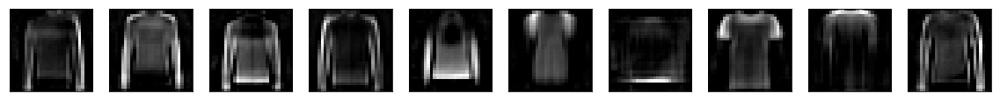

In [23]:
plot_10_most_used_atoms_for_an_image(h_test[1], AE.atom_images_decoder())

In [32]:
def plot_heat_map_of_overlapping_atoms(h_images, atoms, dilated_atoms=None, number_of_atoms=20, threshold=0.5):
    nb_atoms, nb_rows, nb_columns, _ = atoms.shape
    nb_samples_to_plot = min(h_images.shape[0], 8)
    if dilated_atoms is None:
        show_dilated_atoms = 1
    else:
        show_dilated_atoms = 2
        heat_map_of_dilated_atoms = np.zeros((nb_samples_to_plot,nb_rows, nb_columns))
    heat_map_of_atoms = np.zeros((nb_samples_to_plot,nb_rows, nb_columns))
    for i in range(nb_samples_to_plot):
        idx_sort = np.argsort(h_images[i])
        major_atoms = atoms[idx_sort[-number_of_atoms:],:,:,0]
        binary_atoms = major_atoms.reshape((number_of_atoms, nb_rows*nb_columns))>threshold
        heat_map_of_atoms[i,:,:] = np.sum(binary_atoms, axis=0).reshape((28,28))
        if show_dilated_atoms>1:
            major_atoms = dilated_atoms[idx_sort[-number_of_atoms:],:,:,0]
            binary_atoms = major_atoms.reshape((number_of_atoms, nb_rows*nb_columns))>threshold
            heat_map_of_dilated_atoms[i,:,:] = np.sum(binary_atoms, axis=0).reshape((28,28))
    nb_max = max(np.max(heat_map_of_atoms), np.max(heat_map_of_dilated_atoms))
    plt.figure(figsize=(nb_samples_to_plot*3,show_dilated_atoms*3))
    fig, axes = plt.subplots(nrows=show_dilated_atoms, ncols=nb_samples_to_plot, figsize=(nb_samples_to_plot*2, show_dilated_atoms*2))
    i = 0
    for ax in axes.flat:
        ax.set_axis_off()
        if i<nb_samples_to_plot:
            im = ax.imshow(heat_map_of_atoms[i].reshape((nb_rows,nb_columns)), cmap='hot', vmin=0, vmax=nb_max)    
        if i>=nb_samples_to_plot:
            im = ax.imshow(heat_map_of_dilated_atoms[i-nb_samples_to_plot].reshape((nb_rows,nb_columns)), cmap='hot', vmin=0, vmax=nb_max)    
        i += 1
    cb_ax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
    cbar = fig.colorbar(im, cax=cb_ax)
    plt.show()

<Figure size 1728x432 with 0 Axes>

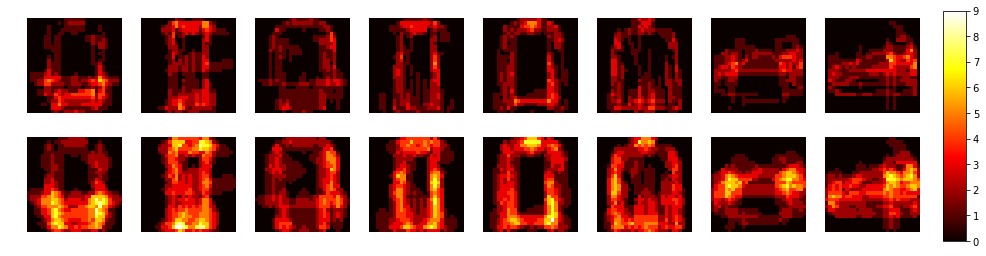

In [33]:
plot_heat_map_of_overlapping_atoms(h_test[idx_small][2:10], AE.atom_images_decoder(), dilated_atoms=AE_dil.atom_images_decoder(),number_of_atoms=20 )

In [34]:
def progressive_reconstruction(h_image, atoms, number_of_steps=50):
    nb_atoms, nb_rows, nb_columns, _ = atoms.shape
    idx_sort = np.flip(np.argsort(h_image))
    h_sort = h_image[idx_sort][:number_of_steps]
    major_atoms = atoms[idx_sort[:number_of_steps]].reshape((number_of_steps, nb_rows*nb_columns))
    partial_reconstructions = np.zeros((number_of_steps, nb_rows*nb_columns))
    for i in range(number_of_steps):
        partial_reconstructions[i,:] = np.dot(h_sort[:i+1], major_atoms[:i+1])
    nb_max = np.max(partial_reconstructions)
    nb_plot_rows = int(number_of_steps / 8) + int(number_of_steps%8 > 0)
    plt.figure(figsize=(nb_plot_rows*3,8*3))
    fig, axes = plt.subplots(nrows=nb_plot_rows, ncols=8, figsize=(8*2, nb_plot_rows*2))
    i = 0
    for ax in axes.flat:
        ax.set_axis_off()
        if i<number_of_steps:
            im = ax.imshow(partial_reconstructions[i].reshape((nb_rows,nb_columns)), cmap='gray', vmin=0, vmax=nb_max)    
        i += 1
    fig.subplots_adjust(wspace=0.02, hspace=0.05)
    cb_ax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
    cbar = fig.colorbar(im, cax=cb_ax)
    plt.show()

<Figure size 2808x1728 with 0 Axes>

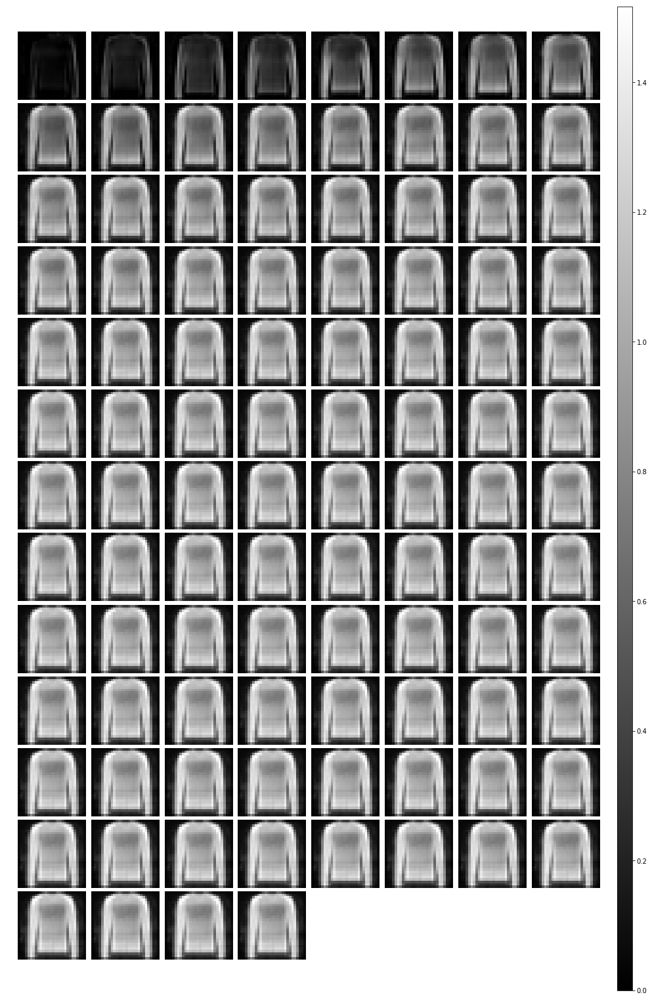

In [35]:
progressive_reconstruction(h_test[1], atoms, number_of_steps=100)

In [36]:
from skimage import filters

def mean_Otsu_binarization_threshold_using_10_majors_images(images, h_test_image):
    nb_images,_,_ = images.shape
    thresholds = np.zeros(10)
    idx_sort = np.flip(np.argsort(h_test_image))
    for i in range(10):
        thresholds[i] = filters.threshold_otsu(images[idx_sort[i]])
    return np.mean(thresholds)

def overlap_coef(A,B):
    if (not np.any(A)) or (not np.any(B)):
        #print("Warning: Two empty sets given in computation of jaccard index...returning 0...")
        return 0
    else:
        A_union_B = np.logical_or(A,B)
        A_inter_B = np.logical_and(A,B)
        overlap_coef = np.sum(A_inter_B)/min(np.sum(A), np.sum(B))
        return overlap_coef

def pair_wise_mean_overlap_coef_of_binary_images(binary_images):
    nb_images,_,_ = binary_images.shape
    nb_pairs = nb_images*(nb_images-1)/2.
    s = 0
    for i in range(nb_images):
        for j in range(i+1,nb_images):
            s += overlap_coef(binary_images[i], binary_images[j])
    return s/nb_pairs

def pair_wise_mean_overlap_coef_of_weighted_atoms(atoms, h_test_image):
    nb_atoms,nb_rows,nb_columns,_ = atoms.shape
    weighted_atoms = np.dot(np.diag(h_test_image), atoms.reshape((nb_atoms,nb_rows*nb_columns))).reshape((nb_atoms,nb_rows,nb_columns))
    binarization_theshold = mean_Otsu_binarization_threshold_using_10_majors_images(weighted_atoms, h_test_image)
    print('*****Otsu binarization  threshold : ', binarization_theshold,' ******')
    bin_weighted_atoms = weighted_atoms > binarization_theshold
    return pair_wise_mean_overlap_coef_of_binary_images(bin_weighted_atoms)

def mean_overlap_coef_of_atoms_weighted_by_images_code(atoms, h_test):
    nb_samples, _ = h_test.shape
    s = 0
    for i in range(nb_samples):
        print('******Image: ', i, ' ******')
        tmp = pair_wise_mean_overlap_coef_of_weighted_atoms(atoms, h_test[i])
        s += tmp
        print('***Mean overlap coef: ', tmp)
        print('\n')
    return s/nb_samples

In [37]:
mean_overlap_coef_of_atoms_weighted_by_images_code(atoms, h_test[:1000])

******Image:  0  ******
*****Otsu binarization  threshold :  0.07442916333675384  ******
***Mean overlap coef:  0.001818318318372374


******Image:  1  ******
*****Otsu binarization  threshold :  0.1027586106210947  ******
***Mean overlap coef:  0.005576344640392721


******Image:  2  ******
*****Otsu binarization  threshold :  0.07271434068679809  ******
***Mean overlap coef:  0.004710915347637562


******Image:  3  ******
*****Otsu binarization  threshold :  0.05454167956486344  ******
***Mean overlap coef:  0.002870553739471878


******Image:  4  ******
*****Otsu binarization  threshold :  0.05682748556137085  ******
***Mean overlap coef:  0.01037593230805837


******Image:  5  ******
*****Otsu binarization  threshold :  0.08783812858164311  ******
***Mean overlap coef:  0.002665665652672257


******Image:  6  ******
*****Otsu binarization  threshold :  0.0874767079949379  ******
***Mean overlap coef:  0.0016024714978746443


******Image:  7  ******
*****Otsu binarization  threshold

***Mean overlap coef:  0.004024804019998654


******Image:  63  ******
*****Otsu binarization  threshold :  0.06551118195056915  ******
***Mean overlap coef:  0.001996266283667044


******Image:  64  ******
*****Otsu binarization  threshold :  0.07539809914305806  ******
***Mean overlap coef:  0.0035995363618532223


******Image:  65  ******
*****Otsu binarization  threshold :  0.05257752500474453  ******
***Mean overlap coef:  0.0026743875441987896


******Image:  66  ******
*****Otsu binarization  threshold :  0.04587046355009079  ******
***Mean overlap coef:  0.0072601392253856456


******Image:  67  ******
*****Otsu binarization  threshold :  0.0872405081987381  ******
***Mean overlap coef:  0.003765837830023969


******Image:  68  ******
*****Otsu binarization  threshold :  0.06197924129664898  ******
***Mean overlap coef:  0.0035090775904271145


******Image:  69  ******
*****Otsu binarization  threshold :  0.07625331133604049  ******
***Mean overlap coef:  0.00934900719175708




***Mean overlap coef:  0.003546788412930851


******Image:  123  ******
*****Otsu binarization  threshold :  0.102074184268713  ******
***Mean overlap coef:  0.0026971523319396


******Image:  124  ******
*****Otsu binarization  threshold :  0.08616058826446533  ******
***Mean overlap coef:  0.004394605581498356


******Image:  125  ******
*****Otsu binarization  threshold :  0.08862280696630478  ******
***Mean overlap coef:  0.004699968417435811


******Image:  126  ******
*****Otsu binarization  threshold :  0.06478402502834797  ******
***Mean overlap coef:  0.006721240061934459


******Image:  127  ******
*****Otsu binarization  threshold :  0.09639957584440709  ******
***Mean overlap coef:  0.004984444154060868


******Image:  128  ******
*****Otsu binarization  threshold :  0.055393464863300323  ******
***Mean overlap coef:  0.004194607989795769


******Image:  129  ******
*****Otsu binarization  threshold :  0.028777565574273467  ******
***Mean overlap coef:  0.002553230812313432

***Mean overlap coef:  0.005321392403061836


******Image:  186  ******
*****Otsu binarization  threshold :  0.08009429592639208  ******
***Mean overlap coef:  0.0035554370438173025


******Image:  187  ******
*****Otsu binarization  threshold :  0.09545264281332493  ******
***Mean overlap coef:  0.006792544616283572


******Image:  188  ******
*****Otsu binarization  threshold :  0.09326168298721313  ******
***Mean overlap coef:  0.008094069234122403


******Image:  189  ******
*****Otsu binarization  threshold :  0.06886924833524972  ******
***Mean overlap coef:  0.0007454355414458762


******Image:  190  ******
*****Otsu binarization  threshold :  0.0741792492568493  ******
***Mean overlap coef:  0.007358291456156163


******Image:  191  ******
*****Otsu binarization  threshold :  0.04605031628161669  ******
***Mean overlap coef:  0.0033362904238286016


******Image:  192  ******
*****Otsu binarization  threshold :  0.06883419640362262  ******
***Mean overlap coef:  0.00821380103706

***Mean overlap coef:  0.005576731874532738


******Image:  246  ******
*****Otsu binarization  threshold :  0.058888947032392024  ******
***Mean overlap coef:  0.007747788351896846


******Image:  247  ******
*****Otsu binarization  threshold :  0.08617763370275497  ******
***Mean overlap coef:  0.006724727766450574


******Image:  248  ******
*****Otsu binarization  threshold :  0.05719893900677562  ******
***Mean overlap coef:  0.010681472283859166


******Image:  249  ******
*****Otsu binarization  threshold :  0.09973372854292392  ******
***Mean overlap coef:  0.006110457975293706


******Image:  250  ******
*****Otsu binarization  threshold :  0.07064219377934933  ******
***Mean overlap coef:  0.006580467651135132


******Image:  251  ******
*****Otsu binarization  threshold :  0.06962399333715438  ******
***Mean overlap coef:  0.0016671313038970344


******Image:  252  ******
*****Otsu binarization  threshold :  0.08829420916736126  ******
***Mean overlap coef:  0.00564511658638

***Mean overlap coef:  0.00450330726748282


******Image:  306  ******
*****Otsu binarization  threshold :  0.09824561588466167  ******
***Mean overlap coef:  0.004591429949404618


******Image:  307  ******
*****Otsu binarization  threshold :  0.08391090650111437  ******
***Mean overlap coef:  0.004557019297689061


******Image:  308  ******
*****Otsu binarization  threshold :  0.07146662352606654  ******
***Mean overlap coef:  0.0025505712370313288


******Image:  309  ******
*****Otsu binarization  threshold :  0.09199379775673151  ******
***Mean overlap coef:  0.0026164035514151317


******Image:  310  ******
*****Otsu binarization  threshold :  0.06758768167346715  ******
***Mean overlap coef:  0.0029965832912481763


******Image:  311  ******
*****Otsu binarization  threshold :  0.05279951151460409  ******
***Mean overlap coef:  0.005507570185821217


******Image:  312  ******
*****Otsu binarization  threshold :  0.0504386018961668  ******
***Mean overlap coef:  0.004203361991956

***Mean overlap coef:  0.0037266384807162303


******Image:  367  ******
*****Otsu binarization  threshold :  0.08485013544559479  ******
***Mean overlap coef:  0.010289242661783085


******Image:  368  ******
*****Otsu binarization  threshold :  0.09833796769380569  ******
***Mean overlap coef:  0.007776496366080755


******Image:  369  ******
*****Otsu binarization  threshold :  0.06902564708143473  ******
***Mean overlap coef:  0.002783976612090553


******Image:  370  ******
*****Otsu binarization  threshold :  0.07044659033417702  ******
***Mean overlap coef:  0.0033311564962653873


******Image:  371  ******
*****Otsu binarization  threshold :  0.04716469375416636  ******
***Mean overlap coef:  0.002385064532897879


******Image:  372  ******
*****Otsu binarization  threshold :  0.07959694769233465  ******
***Mean overlap coef:  0.006823492888453663


******Image:  373  ******
*****Otsu binarization  threshold :  0.1062822125852108  ******
***Mean overlap coef:  0.004197399788161

***Mean overlap coef:  0.003921551807941777


******Image:  428  ******
*****Otsu binarization  threshold :  0.07535036914050579  ******
***Mean overlap coef:  0.006555506079328038


******Image:  429  ******
*****Otsu binarization  threshold :  0.06840021386742592  ******
***Mean overlap coef:  0.007947397596983718


******Image:  430  ******
*****Otsu binarization  threshold :  0.04988377783447504  ******
***Mean overlap coef:  0.003698910879443596


******Image:  431  ******
*****Otsu binarization  threshold :  0.08038709312677383  ******
***Mean overlap coef:  0.0034805399672679324


******Image:  432  ******
*****Otsu binarization  threshold :  0.09430458843708038  ******
***Mean overlap coef:  0.006146670873071424


******Image:  433  ******
*****Otsu binarization  threshold :  0.08530650287866592  ******
***Mean overlap coef:  0.005143264152652849


******Image:  434  ******
*****Otsu binarization  threshold :  0.04099048301577568  ******
***Mean overlap coef:  0.007782620317265

***Mean overlap coef:  0.005645222975387619


******Image:  489  ******
*****Otsu binarization  threshold :  0.12479088604450225  ******
***Mean overlap coef:  0.004845121672379343


******Image:  490  ******
*****Otsu binarization  threshold :  0.09594863876700402  ******
***Mean overlap coef:  0.004749358009920402


******Image:  491  ******
*****Otsu binarization  threshold :  0.07205461040139198  ******
***Mean overlap coef:  0.006894307039622976


******Image:  492  ******
*****Otsu binarization  threshold :  0.06734972279518843  ******
***Mean overlap coef:  0.010490955466726995


******Image:  493  ******
*****Otsu binarization  threshold :  0.10084762647747994  ******
***Mean overlap coef:  0.0031496583760920334


******Image:  494  ******
*****Otsu binarization  threshold :  0.09583519361913204  ******
***Mean overlap coef:  0.00290694439434842


******Image:  495  ******
*****Otsu binarization  threshold :  0.08824203833937645  ******
***Mean overlap coef:  0.0043430283463280

***Mean overlap coef:  0.002428927092748274


******Image:  552  ******
*****Otsu binarization  threshold :  0.06264692284166813  ******
***Mean overlap coef:  0.0013265670690818466


******Image:  553  ******
*****Otsu binarization  threshold :  0.06901111919432878  ******
***Mean overlap coef:  0.004859420915386076


******Image:  554  ******
*****Otsu binarization  threshold :  0.04213072778657079  ******
***Mean overlap coef:  0.0022414100116120318


******Image:  555  ******
*****Otsu binarization  threshold :  0.06467188522219658  ******
***Mean overlap coef:  0.004485718459869299


******Image:  556  ******
*****Otsu binarization  threshold :  0.08840725272893905  ******
***Mean overlap coef:  0.004972800176546255


******Image:  557  ******
*****Otsu binarization  threshold :  0.056437717750668526  ******
***Mean overlap coef:  0.004599386145218187


******Image:  558  ******
*****Otsu binarization  threshold :  0.07855738066136837  ******
***Mean overlap coef:  0.0058756121869

***Mean overlap coef:  0.009728366650634665


******Image:  615  ******
*****Otsu binarization  threshold :  0.07191541809588671  ******
***Mean overlap coef:  0.0021920555545810686


******Image:  616  ******
*****Otsu binarization  threshold :  0.08029175773262978  ******
***Mean overlap coef:  0.006262181468262173


******Image:  617  ******
*****Otsu binarization  threshold :  0.09208366721868515  ******
***Mean overlap coef:  0.003994054156061129


******Image:  618  ******
*****Otsu binarization  threshold :  0.09257137179374694  ******
***Mean overlap coef:  0.00290686953802229


******Image:  619  ******
*****Otsu binarization  threshold :  0.09070513844490051  ******
***Mean overlap coef:  0.002870121691234914


******Image:  620  ******
*****Otsu binarization  threshold :  0.08282132633030415  ******
***Mean overlap coef:  0.0073348187656021874


******Image:  621  ******
*****Otsu binarization  threshold :  0.08379399850964546  ******
***Mean overlap coef:  0.007465074469536

***Mean overlap coef:  0.0022742563848967166


******Image:  679  ******
*****Otsu binarization  threshold :  0.0830645402893424  ******
***Mean overlap coef:  0.009619633868420421


******Image:  680  ******
*****Otsu binarization  threshold :  0.0896847752854228  ******
***Mean overlap coef:  0.0038961478841499095


******Image:  681  ******
*****Otsu binarization  threshold :  0.0732836365699768  ******
***Mean overlap coef:  0.008959021941993344


******Image:  682  ******
*****Otsu binarization  threshold :  0.08395576365292072  ******
***Mean overlap coef:  0.005404238015186907


******Image:  683  ******
*****Otsu binarization  threshold :  0.09299952276051045  ******
***Mean overlap coef:  0.004054793696919714


******Image:  684  ******
*****Otsu binarization  threshold :  0.040482595842331645  ******
***Mean overlap coef:  0.0036382637413135376


******Image:  685  ******
*****Otsu binarization  threshold :  0.09529345594346524  ******
***Mean overlap coef:  0.005117991177052

***Mean overlap coef:  0.004154114691554739


******Image:  744  ******
*****Otsu binarization  threshold :  0.09688606932759285  ******
***Mean overlap coef:  0.0028320863395920578


******Image:  745  ******
*****Otsu binarization  threshold :  0.08649062104523182  ******
***Mean overlap coef:  0.0023308008028019253


******Image:  746  ******
*****Otsu binarization  threshold :  0.07742428705096245  ******
***Mean overlap coef:  0.002550343285015559


******Image:  747  ******
*****Otsu binarization  threshold :  0.0849285140633583  ******
***Mean overlap coef:  0.0030260118138260403


******Image:  748  ******
*****Otsu binarization  threshold :  0.08983891755342484  ******
***Mean overlap coef:  0.005494117744371737


******Image:  749  ******
*****Otsu binarization  threshold :  0.08117463290691376  ******
***Mean overlap coef:  0.0015617894940175268


******Image:  750  ******
*****Otsu binarization  threshold :  0.09419356435537338  ******
***Mean overlap coef:  0.0065232396600

***Mean overlap coef:  0.0016900960024639768


******Image:  808  ******
*****Otsu binarization  threshold :  0.05150170791894197  ******
***Mean overlap coef:  0.003654243206122496


******Image:  809  ******
*****Otsu binarization  threshold :  0.0728359617292881  ******
***Mean overlap coef:  0.004933354408898859


******Image:  810  ******
*****Otsu binarization  threshold :  0.08761806078255177  ******
***Mean overlap coef:  0.003923318956738139


******Image:  811  ******
*****Otsu binarization  threshold :  0.09339755102992058  ******
***Mean overlap coef:  0.006495022359482511


******Image:  812  ******
*****Otsu binarization  threshold :  0.05757754938676953  ******
***Mean overlap coef:  0.0015949754035400475


******Image:  813  ******
*****Otsu binarization  threshold :  0.08929045591503382  ******
***Mean overlap coef:  0.0030344711244022185


******Image:  814  ******
*****Otsu binarization  threshold :  0.07375323884189129  ******
***Mean overlap coef:  0.00211681613013

***Mean overlap coef:  0.006096302691167451


******Image:  873  ******
*****Otsu binarization  threshold :  0.06951386835426092  ******
***Mean overlap coef:  0.002764340322338531


******Image:  874  ******
*****Otsu binarization  threshold :  0.053314730804413554  ******
***Mean overlap coef:  0.0015424579973256382


******Image:  875  ******
*****Otsu binarization  threshold :  0.08021481558680535  ******
***Mean overlap coef:  0.007080781736198613


******Image:  876  ******
*****Otsu binarization  threshold :  0.09704431518912315  ******
***Mean overlap coef:  0.0026864770988094555


******Image:  877  ******
*****Otsu binarization  threshold :  0.09408413395285606  ******
***Mean overlap coef:  0.006190655811771341


******Image:  878  ******
*****Otsu binarization  threshold :  0.057558494992554186  ******
***Mean overlap coef:  0.0022128460936210563


******Image:  879  ******
*****Otsu binarization  threshold :  0.07342862021178007  ******
***Mean overlap coef:  0.00252308411

***Mean overlap coef:  0.00574685118251917


******Image:  936  ******
*****Otsu binarization  threshold :  0.09428324662148953  ******
***Mean overlap coef:  0.0069417497743733975


******Image:  937  ******
*****Otsu binarization  threshold :  0.11027103420346976  ******
***Mean overlap coef:  0.0035570194013195113


******Image:  938  ******
*****Otsu binarization  threshold :  0.07535634636878967  ******
***Mean overlap coef:  0.003153236968793789


******Image:  939  ******
*****Otsu binarization  threshold :  0.0711739081889391  ******
***Mean overlap coef:  0.006666162067319097


******Image:  940  ******
*****Otsu binarization  threshold :  0.06288956701755524  ******
***Mean overlap coef:  0.005305325470592748


******Image:  941  ******
*****Otsu binarization  threshold :  0.06305654011666775  ******
***Mean overlap coef:  0.0022813516006306824


******Image:  942  ******
*****Otsu binarization  threshold :  0.06723516173660755  ******
***Mean overlap coef:  0.005990334303379

***Mean overlap coef:  0.0030378812455176675




0.0047214652136370735

In [38]:
mean_overlap_coef_of_atoms_weighted_by_images_code(AE_dil.atom_images_decoder(), h_test[:1000])

******Image:  0  ******
*****Otsu binarization  threshold :  0.09059473033994436  ******
***Mean overlap coef:  0.00231612180113937


******Image:  1  ******
*****Otsu binarization  threshold :  0.14218639992177487  ******
***Mean overlap coef:  0.0055449309180935335


******Image:  2  ******
*****Otsu binarization  threshold :  0.09710972718894481  ******
***Mean overlap coef:  0.004564307393339963


******Image:  3  ******
*****Otsu binarization  threshold :  0.06705022593960167  ******
***Mean overlap coef:  0.0039062142187033183


******Image:  4  ******
*****Otsu binarization  threshold :  0.07813288401812316  ******
***Mean overlap coef:  0.010461051154627843


******Image:  5  ******
*****Otsu binarization  threshold :  0.1147036574780941  ******
***Mean overlap coef:  0.003941644649411115


******Image:  6  ******
*****Otsu binarization  threshold :  0.11227152263745666  ******
***Mean overlap coef:  0.0021110894944368704


******Image:  7  ******
*****Otsu binarization  thresh

***Mean overlap coef:  0.002295082774327215


******Image:  61  ******
*****Otsu binarization  threshold :  0.11396620068699122  ******
***Mean overlap coef:  0.003773235009633771


******Image:  62  ******
*****Otsu binarization  threshold :  0.1246402844786644  ******
***Mean overlap coef:  0.004720996280117973


******Image:  63  ******
*****Otsu binarization  threshold :  0.08097243681550026  ******
***Mean overlap coef:  0.002461304278851224


******Image:  64  ******
*****Otsu binarization  threshold :  0.1108264870941639  ******
***Mean overlap coef:  0.003152724013293647


******Image:  65  ******
*****Otsu binarization  threshold :  0.06643420942127705  ******
***Mean overlap coef:  0.0034042509338694633


******Image:  66  ******
*****Otsu binarization  threshold :  0.0568654328584671  ******
***Mean overlap coef:  0.00880358301911244


******Image:  67  ******
*****Otsu binarization  threshold :  0.10667992942035198  ******
***Mean overlap coef:  0.004906837371439977


*****

***Mean overlap coef:  0.004452335388393303


******Image:  126  ******
*****Otsu binarization  threshold :  0.08691834807395935  ******
***Mean overlap coef:  0.0067981161755667424


******Image:  127  ******
*****Otsu binarization  threshold :  0.11928173452615738  ******
***Mean overlap coef:  0.005749989591313268


******Image:  128  ******
*****Otsu binarization  threshold :  0.0797629945911467  ******
***Mean overlap coef:  0.004863426466659151


******Image:  129  ******
*****Otsu binarization  threshold :  0.036542998347431424  ******
***Mean overlap coef:  0.0025750263611070065


******Image:  130  ******
*****Otsu binarization  threshold :  0.10645267814397812  ******
***Mean overlap coef:  0.009020550789062968


******Image:  131  ******
*****Otsu binarization  threshold :  0.07452573445625603  ******
***Mean overlap coef:  0.002729260914427556


******Image:  132  ******
*****Otsu binarization  threshold :  0.10371383279561996  ******
***Mean overlap coef:  0.00389987904748

***Mean overlap coef:  0.0065385082459462635


******Image:  188  ******
*****Otsu binarization  threshold :  0.11808453947305679  ******
***Mean overlap coef:  0.008623369269350827


******Image:  189  ******
*****Otsu binarization  threshold :  0.07938333556521684  ******
***Mean overlap coef:  0.0009898966185543795


******Image:  190  ******
*****Otsu binarization  threshold :  0.09633503779768944  ******
***Mean overlap coef:  0.008793112946725256


******Image:  191  ******
*****Otsu binarization  threshold :  0.05983002670109272  ******
***Mean overlap coef:  0.004659885079111105


******Image:  192  ******
*****Otsu binarization  threshold :  0.09452711716294289  ******
***Mean overlap coef:  0.008235115763808691


******Image:  193  ******
*****Otsu binarization  threshold :  0.11089660748839378  ******
***Mean overlap coef:  0.008867366119420548


******Image:  194  ******
*****Otsu binarization  threshold :  0.07775696013122797  ******
***Mean overlap coef:  0.00263495594527

***Mean overlap coef:  0.005919356707393153


******Image:  251  ******
*****Otsu binarization  threshold :  0.08194714849814773  ******
***Mean overlap coef:  0.0022260987016073375


******Image:  252  ******
*****Otsu binarization  threshold :  0.1074589416384697  ******
***Mean overlap coef:  0.007416026705053169


******Image:  253  ******
*****Otsu binarization  threshold :  0.0767043475061655  ******
***Mean overlap coef:  0.00290775730875668


******Image:  254  ******
*****Otsu binarization  threshold :  0.08641705699265004  ******
***Mean overlap coef:  0.0029304908356391026


******Image:  255  ******
*****Otsu binarization  threshold :  0.15048856437206268  ******
***Mean overlap coef:  0.0034512175830550573


******Image:  256  ******
*****Otsu binarization  threshold :  0.10755318999290467  ******
***Mean overlap coef:  0.004219782741858664


******Image:  257  ******
*****Otsu binarization  threshold :  0.08536762585863471  ******
***Mean overlap coef:  0.0008197751652993

*****Otsu binarization  threshold :  0.0873907633125782  ******
***Mean overlap coef:  0.0038912494916971013


******Image:  314  ******
*****Otsu binarization  threshold :  0.1261459119617939  ******
***Mean overlap coef:  0.006671947974385874


******Image:  315  ******
*****Otsu binarization  threshold :  0.12954220324754714  ******
***Mean overlap coef:  0.007790174294161708


******Image:  316  ******
*****Otsu binarization  threshold :  0.12106142528355121  ******
***Mean overlap coef:  0.00318276483882243


******Image:  317  ******
*****Otsu binarization  threshold :  0.08769853934645652  ******
***Mean overlap coef:  0.00314300217971834


******Image:  318  ******
*****Otsu binarization  threshold :  0.05634399875998497  ******
***Mean overlap coef:  0.010649624155682387


******Image:  319  ******
*****Otsu binarization  threshold :  0.10483729206025601  ******
***Mean overlap coef:  0.007349781933262433


******Image:  320  ******
*****Otsu binarization  threshold :  0.07039

***Mean overlap coef:  0.0021559758399940817


******Image:  375  ******
*****Otsu binarization  threshold :  0.13536222390830516  ******
***Mean overlap coef:  0.004958539203462936


******Image:  376  ******
*****Otsu binarization  threshold :  0.09922360070049763  ******
***Mean overlap coef:  0.0072519140685400425


******Image:  377  ******
*****Otsu binarization  threshold :  0.10494196191430091  ******
***Mean overlap coef:  0.00681340266359152


******Image:  378  ******
*****Otsu binarization  threshold :  0.08663838505744934  ******
***Mean overlap coef:  0.0066448443591542745


******Image:  379  ******
*****Otsu binarization  threshold :  0.10444818064570427  ******
***Mean overlap coef:  0.011341735300541837


******Image:  380  ******
*****Otsu binarization  threshold :  0.09517868384718894  ******
***Mean overlap coef:  0.0030466388824702427


******Image:  381  ******
*****Otsu binarization  threshold :  0.10448821634054184  ******
***Mean overlap coef:  0.0115205442912

***Mean overlap coef:  0.0016427495546716957


******Image:  437  ******
*****Otsu binarization  threshold :  0.09613450840115548  ******
***Mean overlap coef:  0.009605718346803557


******Image:  438  ******
*****Otsu binarization  threshold :  0.10657110055908561  ******
***Mean overlap coef:  0.002061981957348073


******Image:  439  ******
*****Otsu binarization  threshold :  0.09744130335748195  ******
***Mean overlap coef:  0.005401802822886591


******Image:  440  ******
*****Otsu binarization  threshold :  0.11013699285686016  ******
***Mean overlap coef:  0.005926024976422807


******Image:  441  ******
*****Otsu binarization  threshold :  0.0929909797385335  ******
***Mean overlap coef:  0.002214306008145606


******Image:  442  ******
*****Otsu binarization  threshold :  0.1359824486076832  ******
***Mean overlap coef:  0.004643031264663238


******Image:  443  ******
*****Otsu binarization  threshold :  0.09151152558624745  ******
***Mean overlap coef:  0.00933400866675024

***Mean overlap coef:  0.003604627501882099


******Image:  500  ******
*****Otsu binarization  threshold :  0.07503397651016712  ******
***Mean overlap coef:  0.005314574245303302


******Image:  501  ******
*****Otsu binarization  threshold :  0.11945401504635811  ******
***Mean overlap coef:  0.0065945450268538805


******Image:  502  ******
*****Otsu binarization  threshold :  0.0980947520583868  ******
***Mean overlap coef:  0.005697046013099039


******Image:  503  ******
*****Otsu binarization  threshold :  0.09852049443870783  ******
***Mean overlap coef:  0.002464874854293978


******Image:  504  ******
*****Otsu binarization  threshold :  0.09165510609745979  ******
***Mean overlap coef:  0.004138455543600441


******Image:  505  ******
*****Otsu binarization  threshold :  0.12104730531573296  ******
***Mean overlap coef:  0.004532424195808752


******Image:  506  ******
*****Otsu binarization  threshold :  0.07286372669041156  ******
***Mean overlap coef:  0.0062772077947184

*****Otsu binarization  threshold :  0.1222949855029583  ******
***Mean overlap coef:  0.005601228953450163


******Image:  562  ******
*****Otsu binarization  threshold :  0.0789406580850482  ******
***Mean overlap coef:  0.008051171045735831


******Image:  563  ******
*****Otsu binarization  threshold :  0.07062821667641402  ******
***Mean overlap coef:  0.007368530591651713


******Image:  564  ******
*****Otsu binarization  threshold :  0.12363140136003495  ******
***Mean overlap coef:  0.007009039455254641


******Image:  565  ******
*****Otsu binarization  threshold :  0.10101414062082767  ******
***Mean overlap coef:  0.005985862860598874


******Image:  566  ******
*****Otsu binarization  threshold :  0.09842674694955349  ******
***Mean overlap coef:  0.006846824720447797


******Image:  567  ******
*****Otsu binarization  threshold :  0.0619472848251462  ******
***Mean overlap coef:  0.001628617122078168


******Image:  568  ******
*****Otsu binarization  threshold :  0.11083

*****Otsu binarization  threshold :  0.13083168491721153  ******
***Mean overlap coef:  0.0032895219453319894


******Image:  624  ******
*****Otsu binarization  threshold :  0.09483704715967178  ******
***Mean overlap coef:  0.003957986759062975


******Image:  625  ******
*****Otsu binarization  threshold :  0.14336886256933212  ******
***Mean overlap coef:  0.004583228901145018


******Image:  626  ******
*****Otsu binarization  threshold :  0.06872491799294948  ******
***Mean overlap coef:  0.002095982603113132


******Image:  627  ******
*****Otsu binarization  threshold :  0.11477162800729275  ******
***Mean overlap coef:  0.002506360007815958


******Image:  628  ******
*****Otsu binarization  threshold :  0.11394511722028255  ******
***Mean overlap coef:  0.007711906995167953


******Image:  629  ******
*****Otsu binarization  threshold :  0.11029168143868447  ******
***Mean overlap coef:  0.007663380105146166


******Image:  630  ******
*****Otsu binarization  threshold :  0.1

***Mean overlap coef:  0.005758449859452832


******Image:  686  ******
*****Otsu binarization  threshold :  0.12310384288430214  ******
***Mean overlap coef:  0.007194177357824543


******Image:  687  ******
*****Otsu binarization  threshold :  0.13763428404927253  ******
***Mean overlap coef:  0.0042690331836713865


******Image:  688  ******
*****Otsu binarization  threshold :  0.05379824191331863  ******
***Mean overlap coef:  0.00525714866183993


******Image:  689  ******
*****Otsu binarization  threshold :  0.12659834176301957  ******
***Mean overlap coef:  0.004068612965452198


******Image:  690  ******
*****Otsu binarization  threshold :  0.044137108232825996  ******
***Mean overlap coef:  0.0031388683689033553


******Image:  691  ******
*****Otsu binarization  threshold :  0.11696861051023007  ******
***Mean overlap coef:  0.006337801381287348


******Image:  692  ******
*****Otsu binarization  threshold :  0.11228022351861  ******
***Mean overlap coef:  0.00320857855745532

***Mean overlap coef:  0.0027639428788042587


******Image:  746  ******
*****Otsu binarization  threshold :  0.091276815533638  ******
***Mean overlap coef:  0.0033360611221693345


******Image:  747  ******
*****Otsu binarization  threshold :  0.11071506179869176  ******
***Mean overlap coef:  0.0034915397121459755


******Image:  748  ******
*****Otsu binarization  threshold :  0.11518978774547577  ******
***Mean overlap coef:  0.007225905097116613


******Image:  749  ******
*****Otsu binarization  threshold :  0.09357950342819095  ******
***Mean overlap coef:  0.002030786479842315


******Image:  750  ******
*****Otsu binarization  threshold :  0.12493532709777355  ******
***Mean overlap coef:  0.007094807051111318


******Image:  751  ******
*****Otsu binarization  threshold :  0.11229852940887212  ******
***Mean overlap coef:  0.0011456981741534587


******Image:  752  ******
*****Otsu binarization  threshold :  0.07437976524233818  ******
***Mean overlap coef:  0.00143853975859

***Mean overlap coef:  0.0034961223730507534


******Image:  811  ******
*****Otsu binarization  threshold :  0.12137051485478878  ******
***Mean overlap coef:  0.00687970037661245


******Image:  812  ******
*****Otsu binarization  threshold :  0.07045672163367271  ******
***Mean overlap coef:  0.0019529437492869987


******Image:  813  ******
*****Otsu binarization  threshold :  0.11403391398489475  ******
***Mean overlap coef:  0.0040190698554845635


******Image:  814  ******
*****Otsu binarization  threshold :  0.09248605892062187  ******
***Mean overlap coef:  0.0032680714608978615


******Image:  815  ******
*****Otsu binarization  threshold :  0.1182863898575306  ******
***Mean overlap coef:  0.010811418770719013


******Image:  816  ******
*****Otsu binarization  threshold :  0.1296378243714571  ******
***Mean overlap coef:  0.0023442308387231553


******Image:  817  ******
*****Otsu binarization  threshold :  0.1020529367029667  ******
***Mean overlap coef:  0.009556213884498

***Mean overlap coef:  0.0037584699624103827


******Image:  874  ******
*****Otsu binarization  threshold :  0.06590686552226543  ******
***Mean overlap coef:  0.00179757768336519


******Image:  875  ******
*****Otsu binarization  threshold :  0.11034040749073029  ******
***Mean overlap coef:  0.006482492046435911


******Image:  876  ******
*****Otsu binarization  threshold :  0.13386517874896525  ******
***Mean overlap coef:  0.002907396430223303


******Image:  877  ******
*****Otsu binarization  threshold :  0.12213947027921676  ******
***Mean overlap coef:  0.007272898196743216


******Image:  878  ******
*****Otsu binarization  threshold :  0.07158092260360718  ******
***Mean overlap coef:  0.002353961195566078


******Image:  879  ******
*****Otsu binarization  threshold :  0.08820469463244081  ******
***Mean overlap coef:  0.0032605584241030454


******Image:  880  ******
*****Otsu binarization  threshold :  0.09108347818255424  ******
***Mean overlap coef:  0.002055570782306

***Mean overlap coef:  0.0031652765836407606


******Image:  938  ******
*****Otsu binarization  threshold :  0.09652033187448979  ******
***Mean overlap coef:  0.003698314578669579


******Image:  939  ******
*****Otsu binarization  threshold :  0.0925818357616663  ******
***Mean overlap coef:  0.006289729290132556


******Image:  940  ******
*****Otsu binarization  threshold :  0.08086250592023134  ******
***Mean overlap coef:  0.0058392902397331435


******Image:  941  ******
*****Otsu binarization  threshold :  0.08593073673546314  ******
***Mean overlap coef:  0.001641054005793412


******Image:  942  ******
*****Otsu binarization  threshold :  0.08528541699051857  ******
***Mean overlap coef:  0.0074261650761908


******Image:  943  ******
*****Otsu binarization  threshold :  0.06090805334970355  ******
***Mean overlap coef:  0.004277448256593586


******Image:  944  ******
*****Otsu binarization  threshold :  0.11714885756373405  ******
***Mean overlap coef:  0.00256195226851482

0.004984224178513681

## 1.4 Sparsity_weight = 0.005 (sp_o = 0.01)

Original images and reconstructions - Reconstruction error:  0.01931256490945816


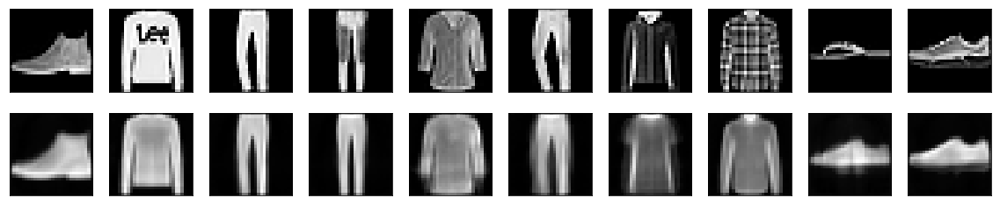

Histograms of the encodings - Sparsity (Hoyer):  0.7998856902122498


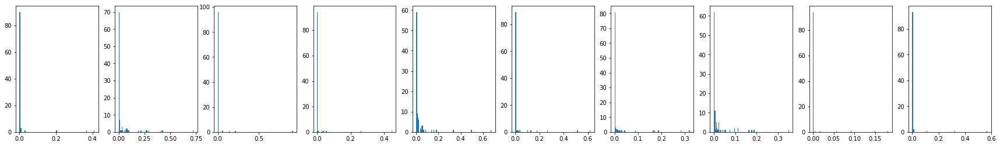

Atom images of the decoder


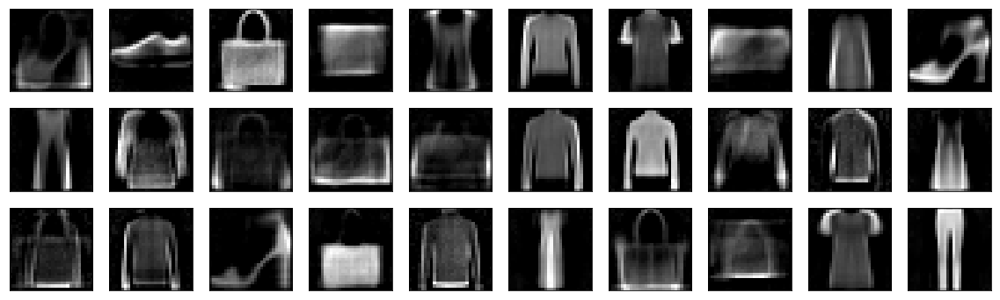

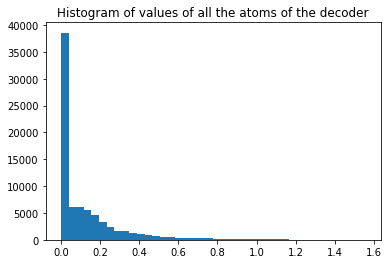

In [18]:
sp_o = 0.01
sp_w = 0.005
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


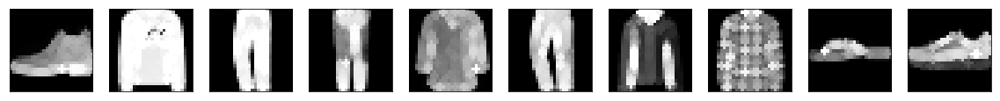

Dilatation of the reconstructions


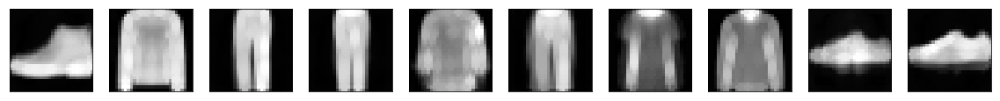

Original images and max-approximation to dilatation
Max-approx error to original:  0.03476408634185791  - Max-approx error to reconstruction:  0.026728828549385072


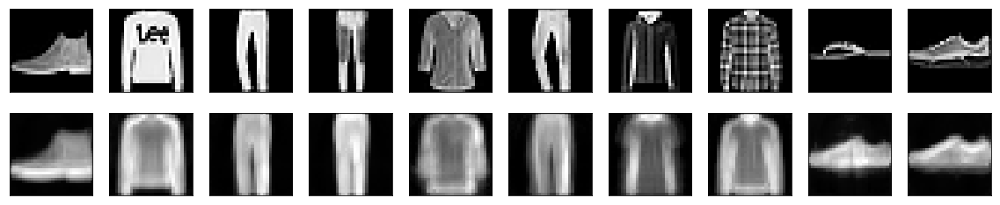

Dilated of the atom images of the decoder


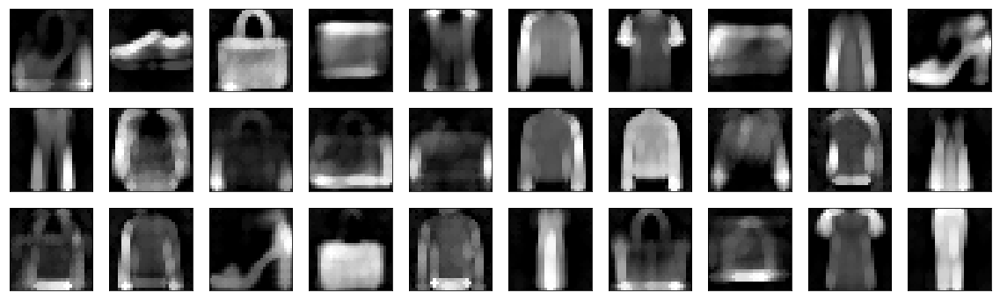

In [19]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 1.5 Sparsity_weight = 0.01 (sp_o = 0.01)

Original images and reconstructions - Reconstruction error:  0.02120140025615692


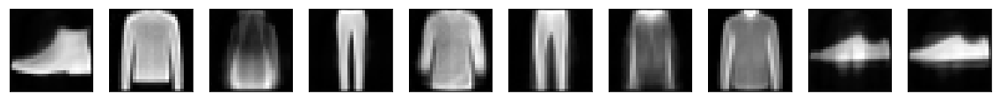

Histograms of the encodings - Sparsity (Hoyer):  0.8258406519889832


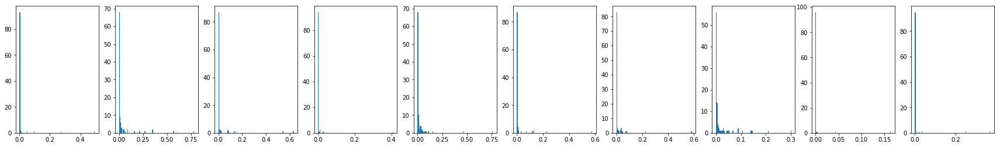

Atom images of the decoder


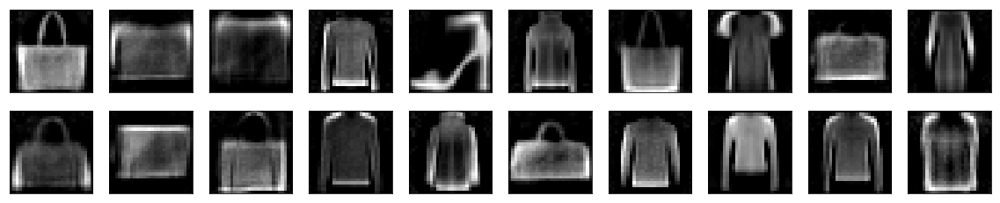

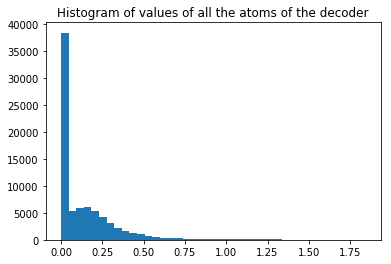

In [13]:
sp_o = 0.01
sp_w = 0.01
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small, plot_input=False)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=20)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


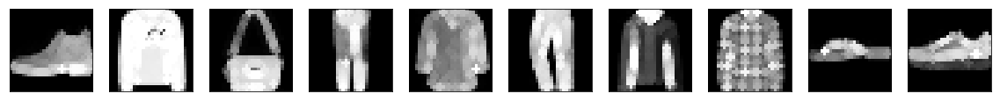

Dilatation of the reconstructions


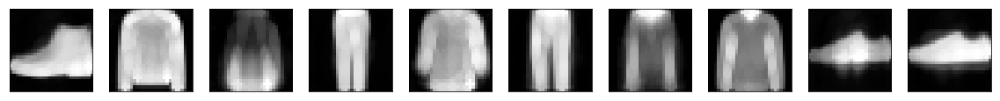

Original images and max-approximation to dilatation
Max-approx error to original:  0.028061463367938997  - Max-approx error to reconstruction:  0.014675731945037842


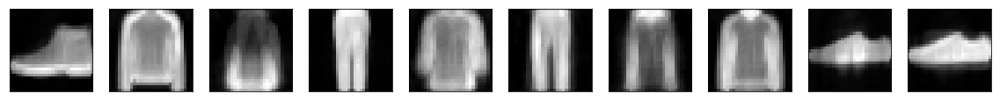

Dilated of the atom images of the decoder


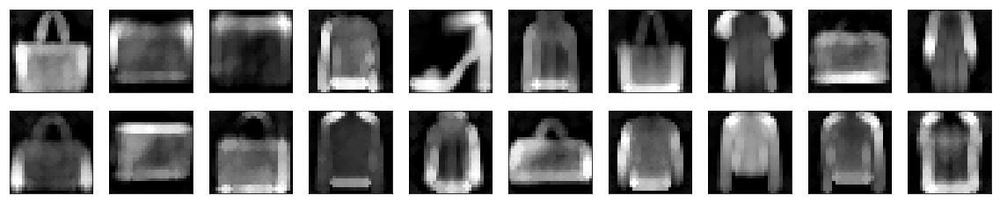

In [15]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small, plot_input=False)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=20)

## 1.6 Sparsity_weight = 0.05 (sp_o = 0.01)

Original images and reconstructions - Reconstruction error:  0.026021905386447906


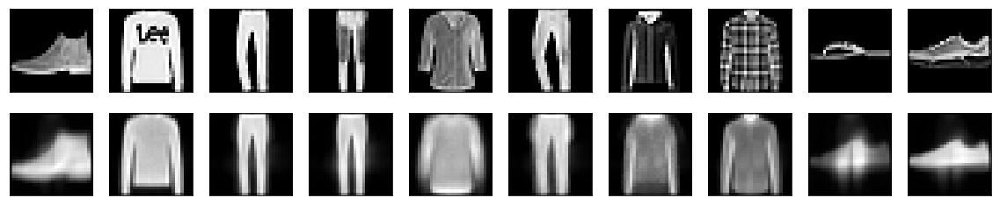

Histograms of the encodings - Sparsity (Hoyer):  0.836001455783844


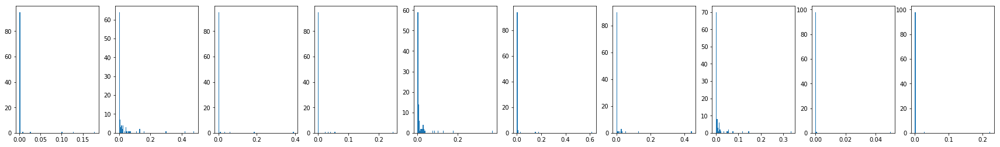

Atom images of the decoder


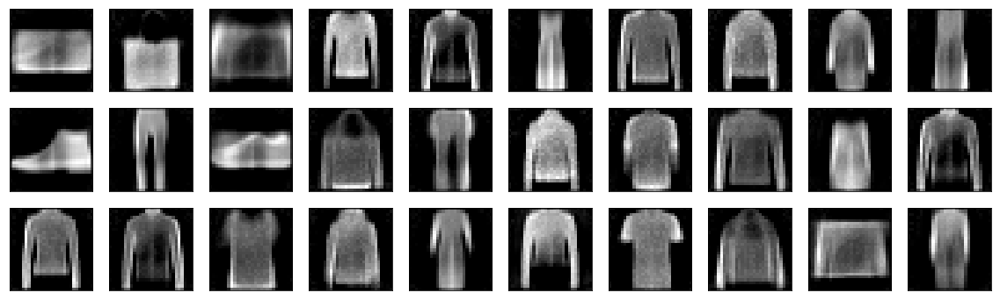

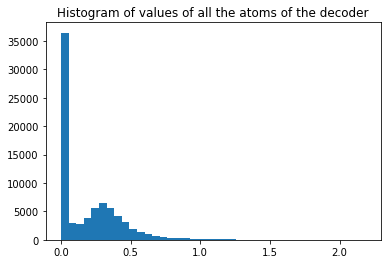

In [22]:
sp_o = 0.01
sp_w = 0.05
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


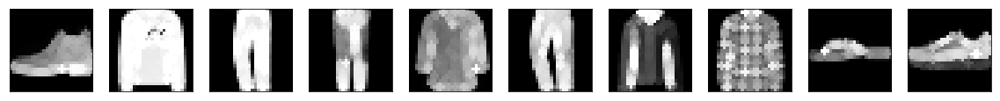

Dilatation of the reconstructions


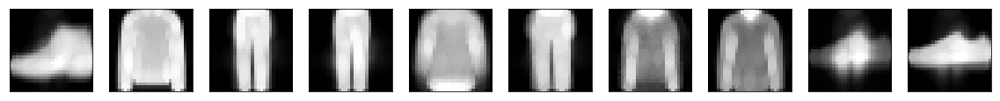

Original images and max-approximation to dilatation
Max-approx error to original:  0.03066383352279663  - Max-approx error to reconstruction:  0.01193883860707283


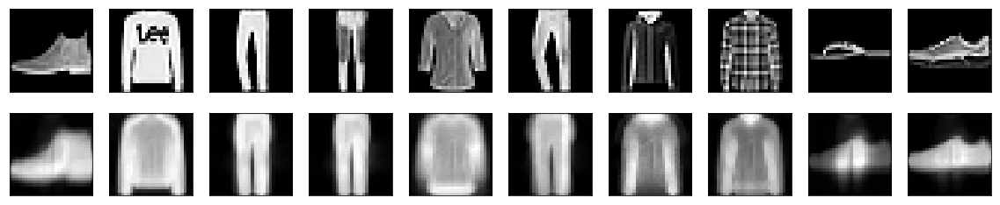

Dilated of the atom images of the decoder


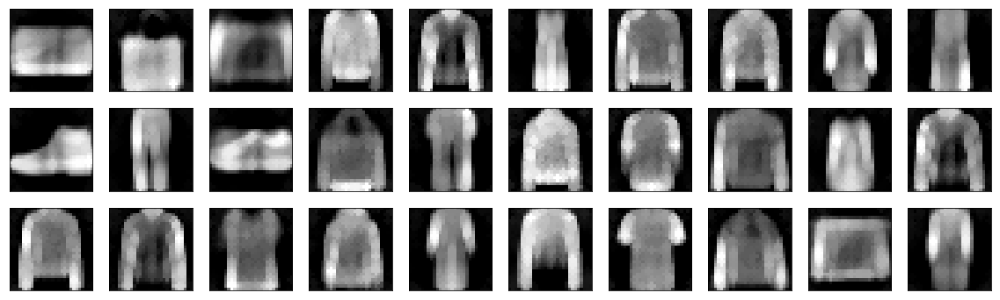

In [23]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 1.7 Sparsity_weight = 0.1 (sp_o = 0.01)

Original images and reconstructions - Reconstruction error:  0.029700033342838286


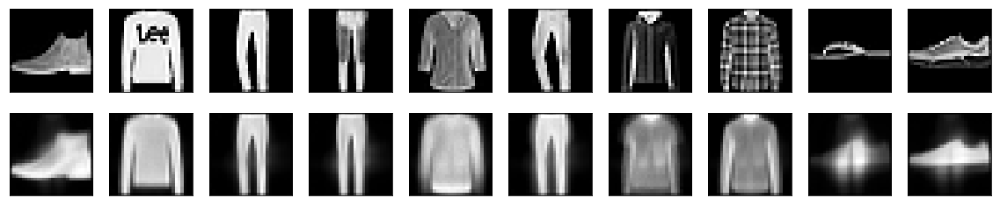

Histograms of the encodings - Sparsity (Hoyer):  0.8177566528320312


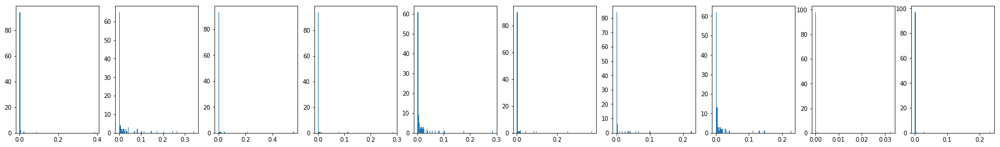

Atom images of the decoder


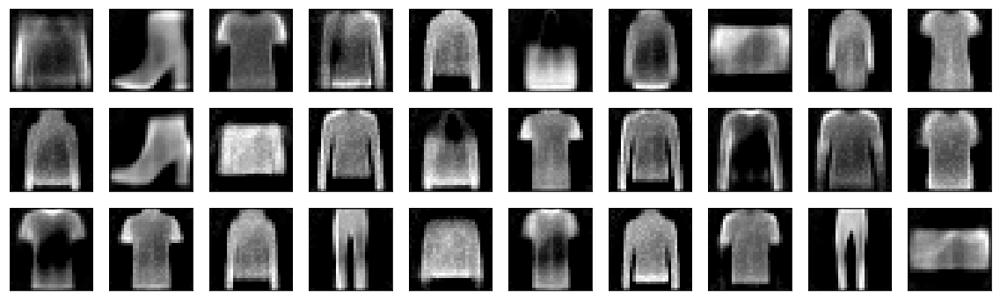

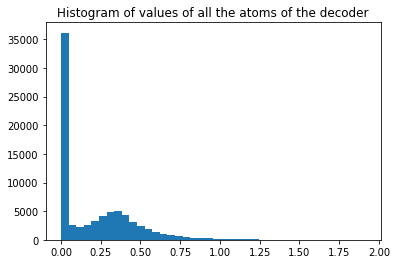

In [24]:
sp_o = 0.01
sp_w = 0.1
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


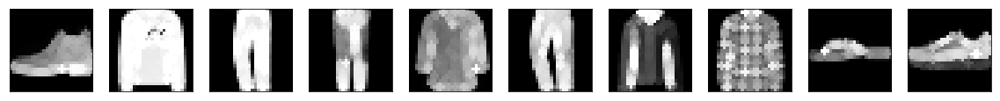

Dilatation of the reconstructions


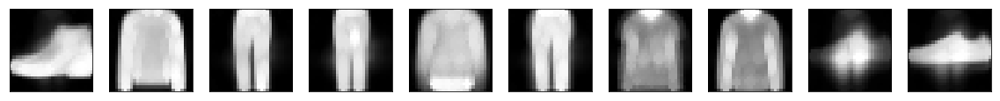

Original images and max-approximation to dilatation
Max-approx error to original:  0.03319251635074615  - Max-approx error to reconstruction:  0.013218466579914092


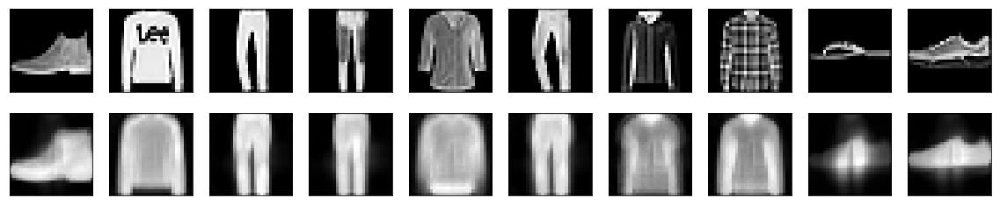

Dilated of the atom images of the decoder


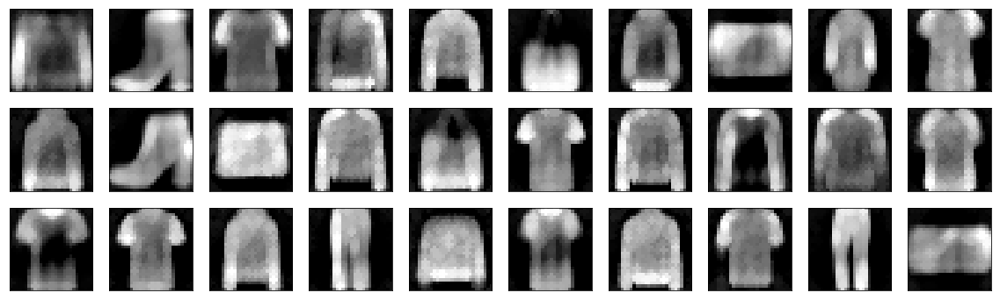

In [25]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 1.8 Sparsity_weight = 0.5 (sp_o = 0.01)

Original images and reconstructions - Reconstruction error:  0.04712977695465088


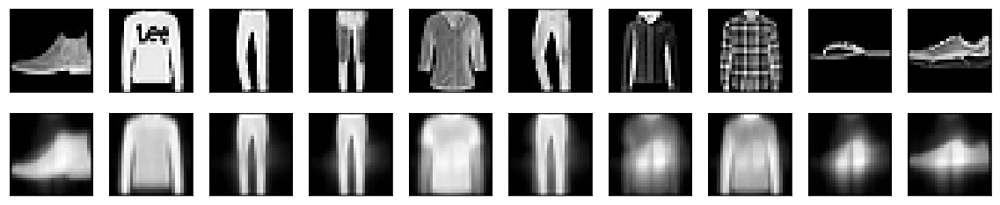

Histograms of the encodings - Sparsity (Hoyer):  0.7173709273338318


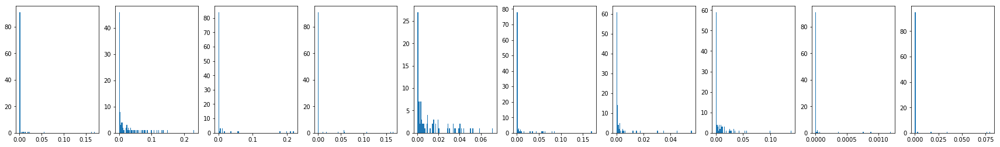

Atom images of the decoder


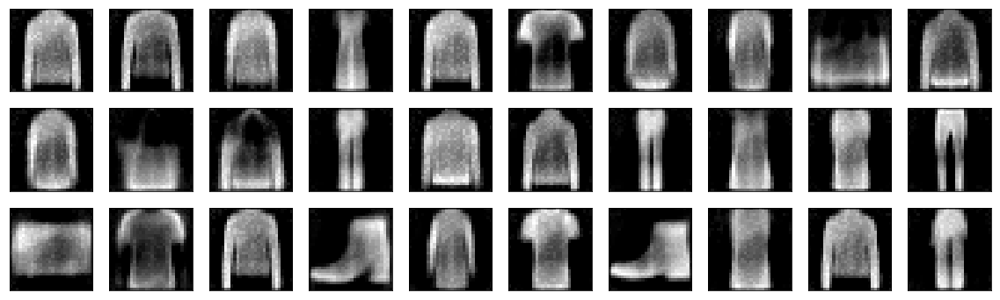

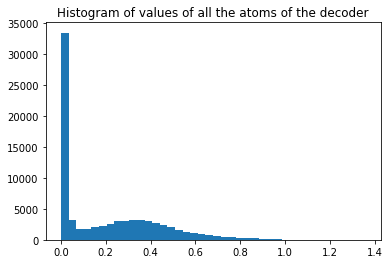

In [26]:
sp_o = 0.01
sp_w = 0.5
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_06_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


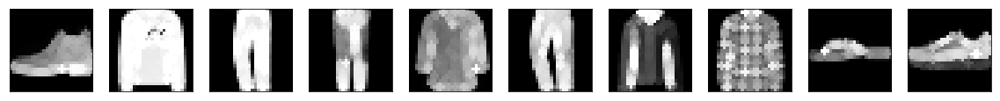

Dilatation of the reconstructions


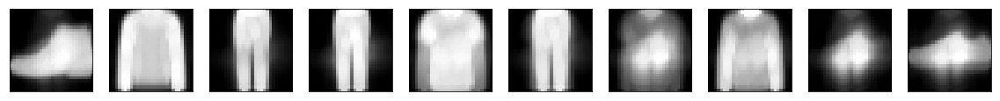

Original images and max-approximation to dilatation
Max-approx error to original:  0.05291578500270844  - Max-approx error to reconstruction:  0.023994002985954284


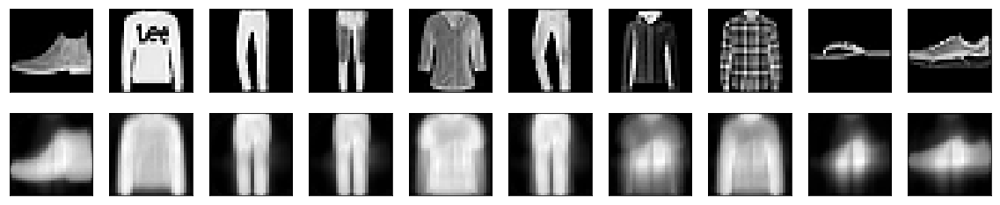

Dilated of the atom images of the decoder


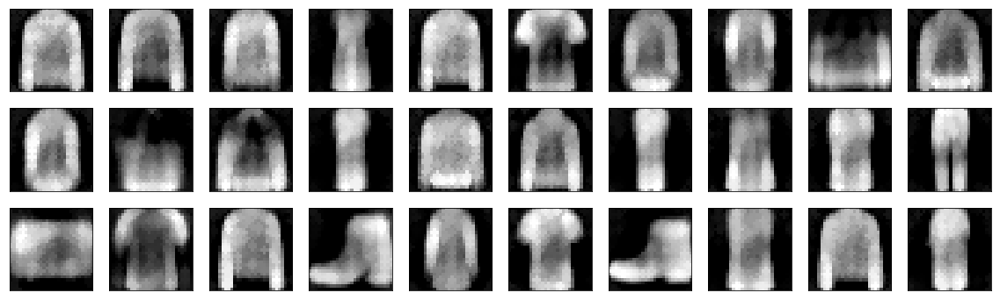

In [27]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

# 2. Sparsity_Objective = 0.05

## 2.1 Sparsity_weight = 0.0001 (sp_o = 0.05)

Original images and reconstructions - Reconstruction error:  0.009551745267212391


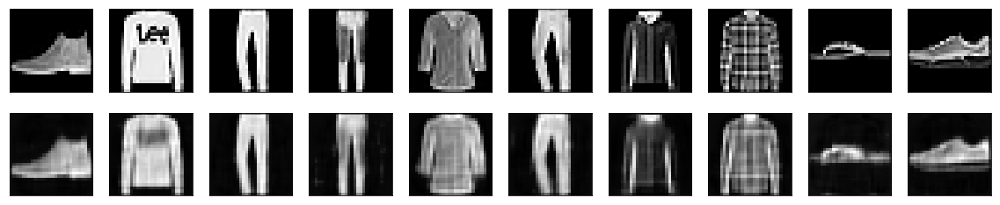

Histograms of the encodings - Sparsity (Hoyer):  0.37513333559036255


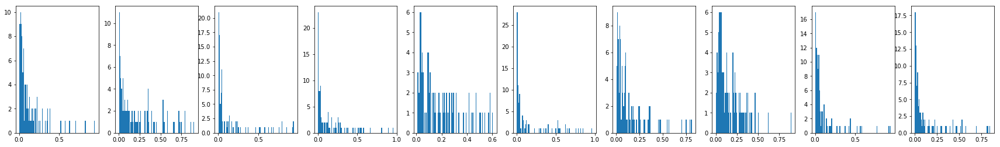

Atom images of the decoder


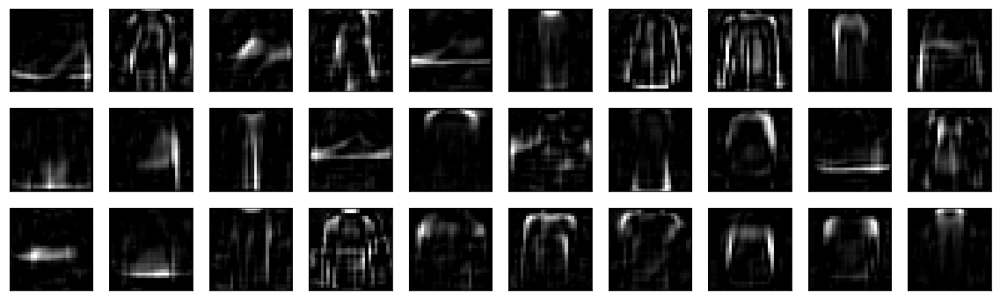

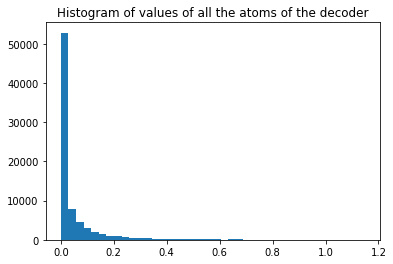

In [28]:
sp_o = 0.05
sp_w = 0.0001
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_04_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


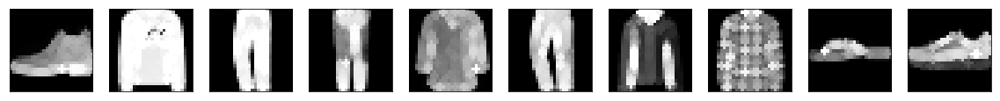

Dilatation of the reconstructions


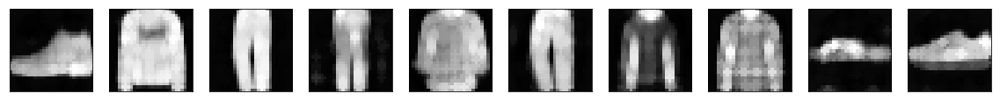

Original images and max-approximation to dilatation
Max-approx error to original:  0.824526282119751  - Max-approx error to reconstruction:  0.8353466991424561


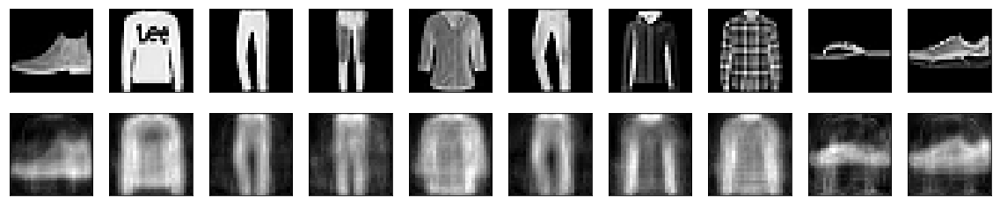

Dilated of the atom images of the decoder


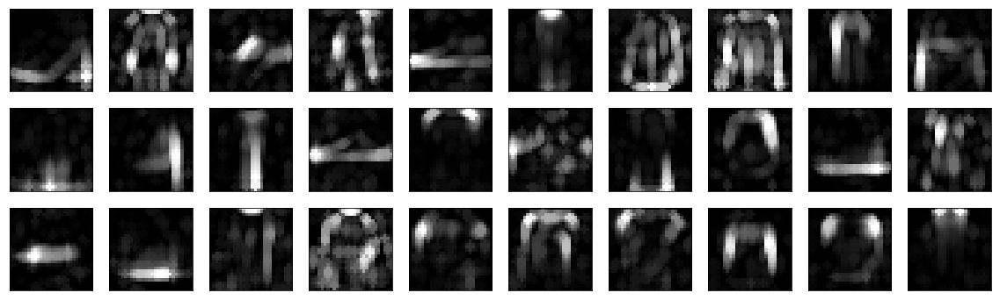

In [29]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 2.2 Sparsity_weight = 0.0005 (sp_o = 0.05)

Original images and reconstructions - Reconstruction error:  0.011073263162374496


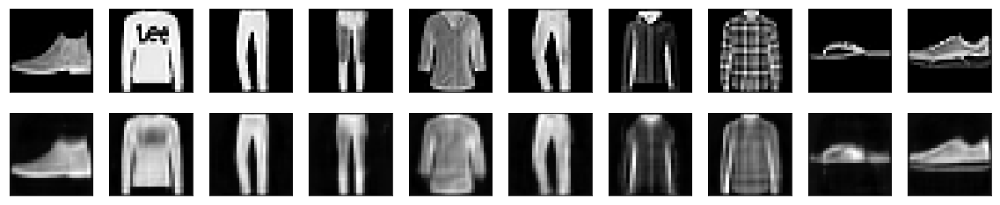

Histograms of the encodings - Sparsity (Hoyer):  0.5175786018371582


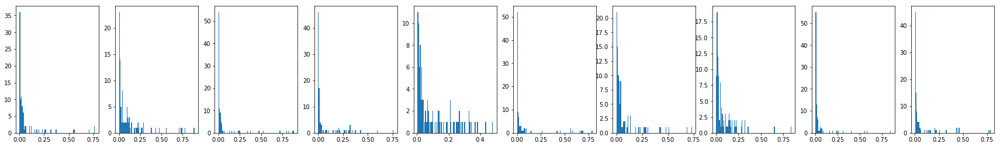

Atom images of the decoder


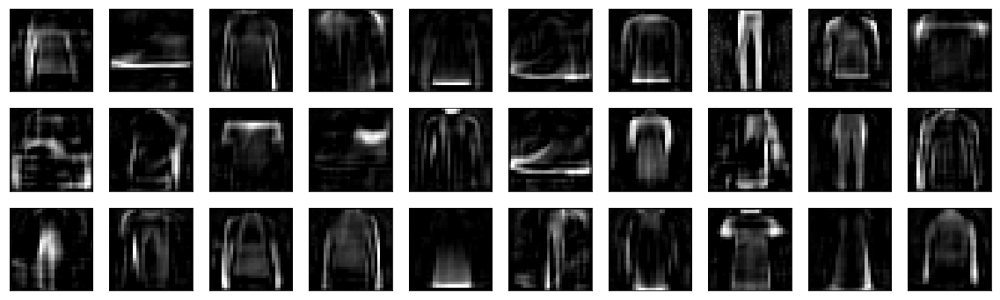

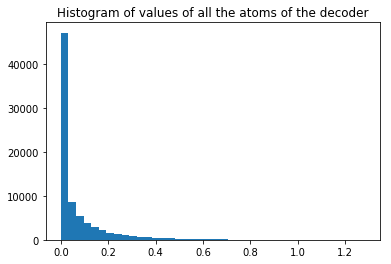

In [30]:
sp_o = 0.05
sp_w = 0.0005
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


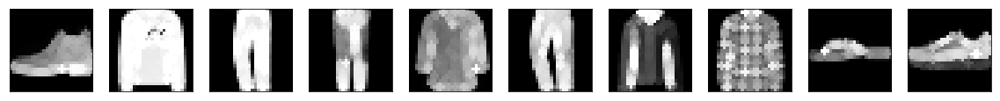

Dilatation of the reconstructions


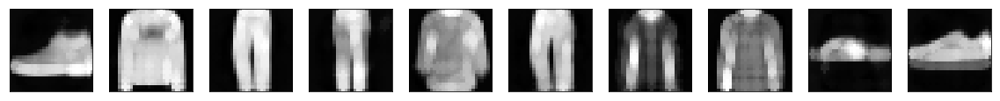

Original images and max-approximation to dilatation
Max-approx error to original:  0.2807899772882462  - Max-approx error to reconstruction:  0.30375319612026214


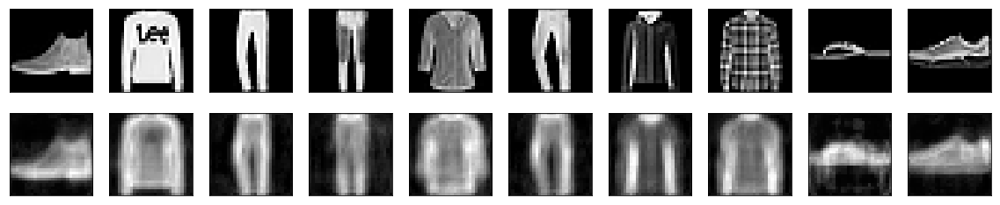

Dilated of the atom images of the decoder


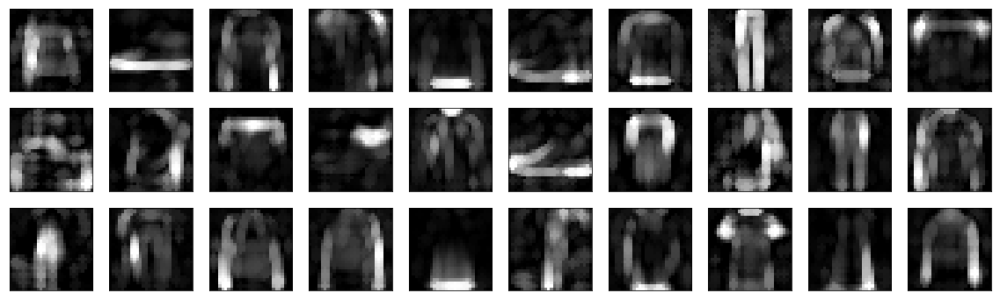

In [31]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 2.3 Sparsity_weight = 0.001 (sp_o = 0.05)

Original images and reconstructions - Reconstruction error:  0.011472779926657677


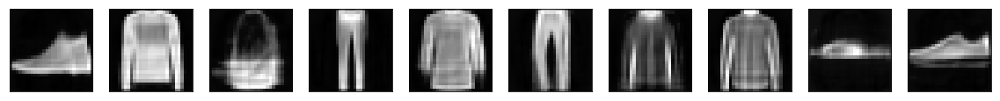

Histograms of the encodings - Sparsity (Hoyer):  0.5653221607208252


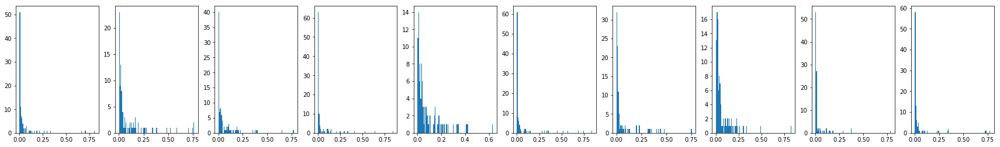

Atom images of the decoder


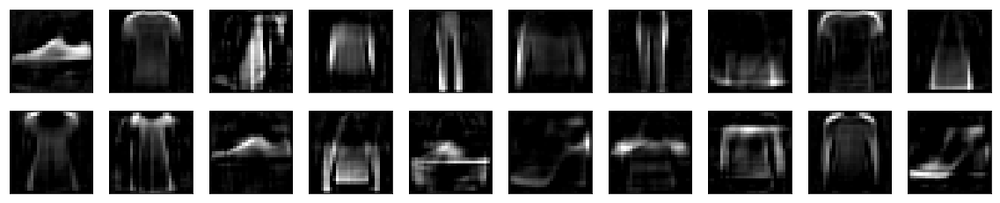

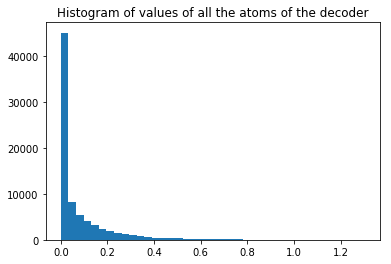

In [4]:
sp_o = 0.05
sp_w = 0.001
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small, plot_input=False)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=20)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


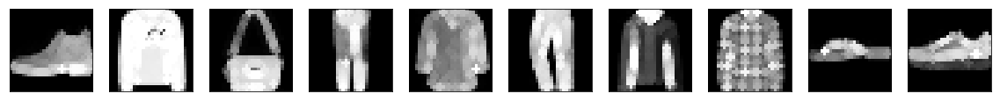

Dilatation of the reconstructions


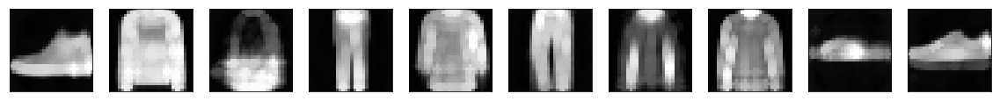

Original images and max-approximation to dilatation
Max-approx error to original:  0.17143405107259752  - Max-approx error to reconstruction:  0.17831934657096862


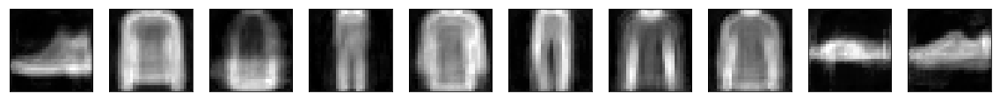

Dilated of the atom images of the decoder


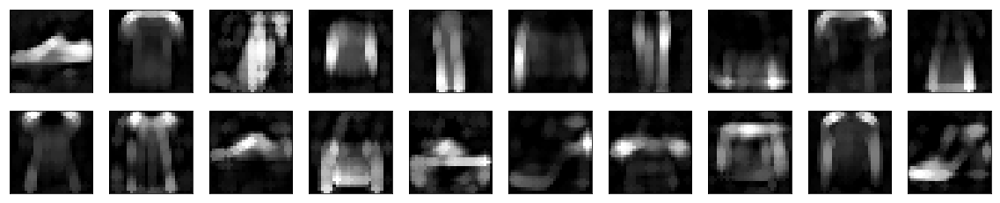

In [6]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small,plot_input=False)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=20)

## 2.4 Sparsity_weight = 0.005 (sp_o = 0.05)

Original images and reconstructions - Reconstruction error:  0.012508940917253495


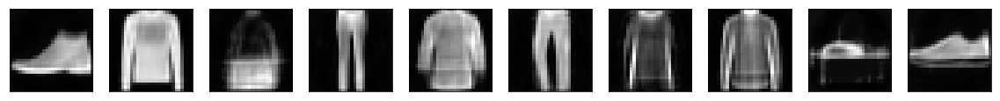

Histograms of the encodings - Sparsity (Hoyer):  0.6148548722267151


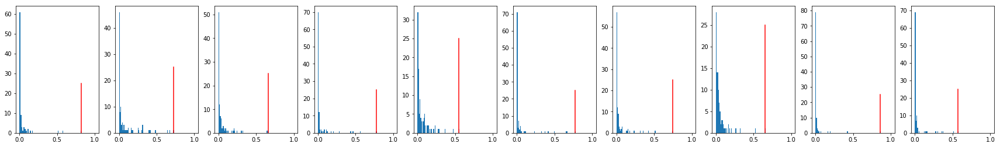

Atom images of the decoder


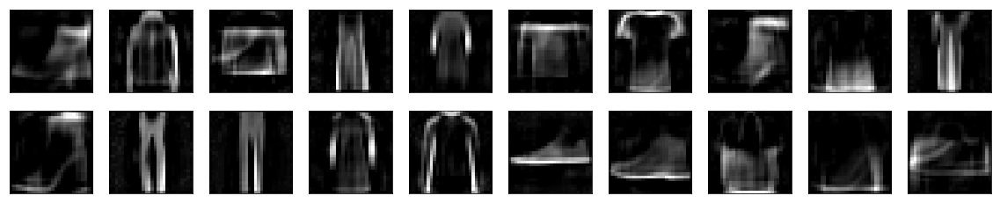

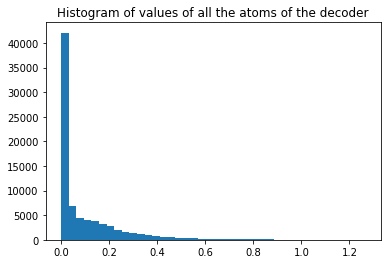

In [4]:
sp_o = 0.05
sp_w = 0.005
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small, plot_input=False)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=20)
AE.plot_histograms_of_the_decoder_atoms()

In [5]:
sp_o = 0.05
sp_w = 0.005
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')

In [5]:
import atoms_analysis

In [6]:
atoms_analysis.Hoyer_sparsity_of_atoms(AE.atom_images_decoder())

0.47037548

In [ ]:
AE.

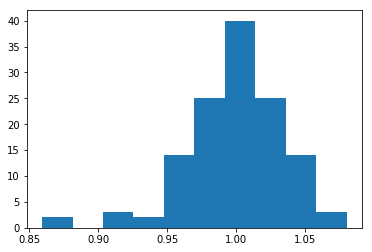

In [58]:
plt.hist(AE.encoder.layers[4].get_weights()[0].flatten())
plt.show()

Dilatation of the original images


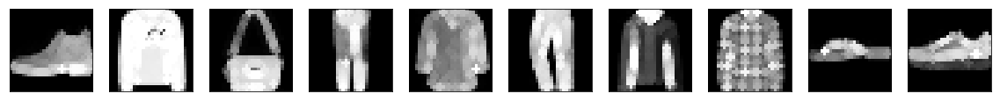

Dilatation of the reconstructions


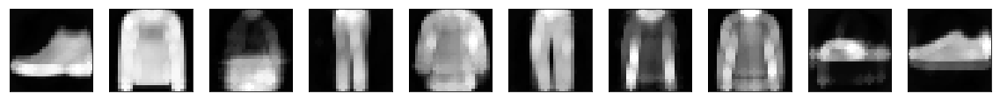

Original images and max-approximation to dilatation
Max-approx error to original:  0.10395206676721573  - Max-approx error to reconstruction:  0.1075544703245163


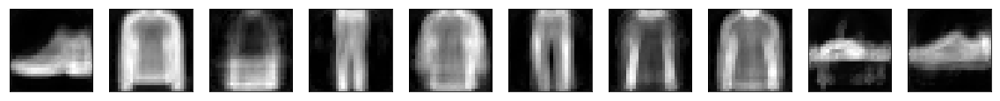

Dilated of the atom images of the decoder


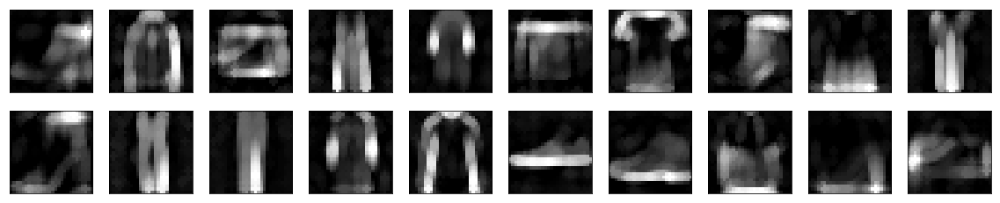

In [59]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small, plot_input=False)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=20)

In [65]:
P = AE_dil.decoder.layers[1].get_weights()

In [67]:
W,B = P

In [70]:
P = [W, np.zeros(784)]

In [71]:
AE_dil.decoder.layers[1].set_weights(P)

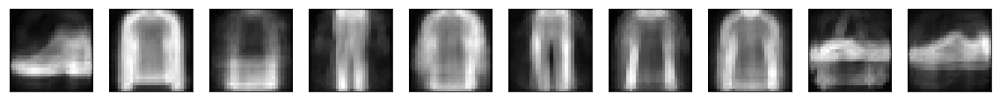

In [72]:
AE_dil.plot_reconstructions(x_small,plot_input=False)

##### Computation time of Max-Approximation

In [6]:
import time

In [9]:
dilation_times = np.zeros(100)
max_approximation_times = np.zeros(100)
for i in range(100):
    t1 = time.time()
    bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_test, SE_scale=1)
    t2=time.time()
    dilation_times[i] = t2 - t1
    
    t1 = time.time()
    AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1).reconstruction(x_test)
    t2 = time.time()
    max_approximation_times[i] = t2 - t1

KeyboardInterrupt: 

In [7]:
t1 = time.time()
bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_test, SE_scale=1)
t2=time.time()
t2-t1

1.1668391227722168

In [8]:
t1 = time.time()
AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1).reconstruction(x_test)
t2 = time.time()
t2 - t1

10.754003524780273

## 2.5 Sparsity_weight = 0.01 (sp_o = 0.05)

Original images and reconstructions - Reconstruction error:  0.012963676309585571


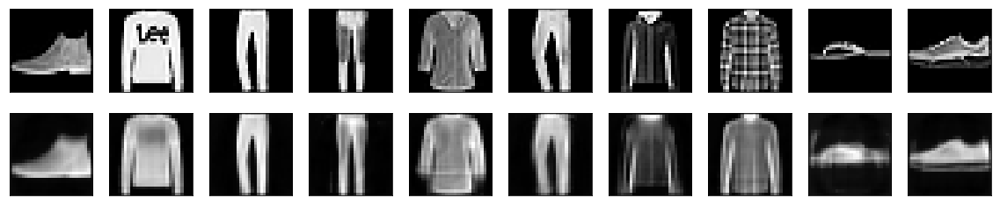

Histograms of the encodings - Sparsity (Hoyer):  0.6112198829650879


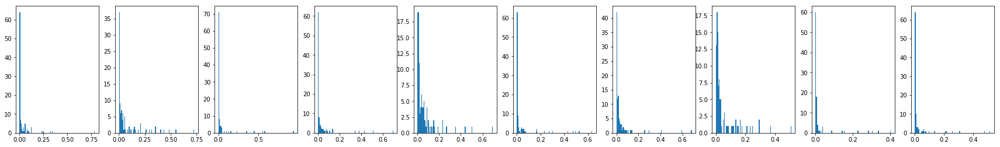

Atom images of the decoder


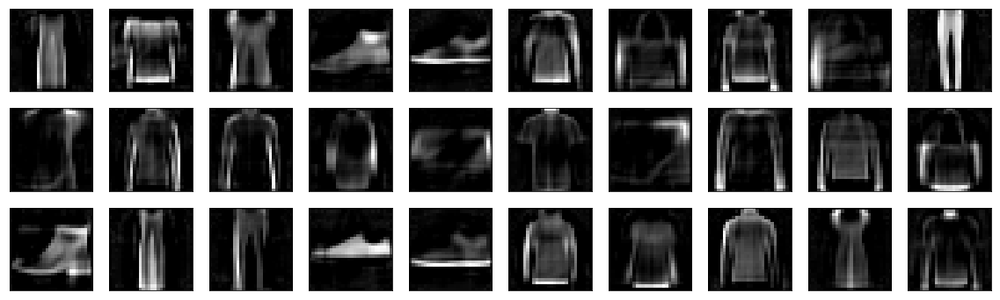

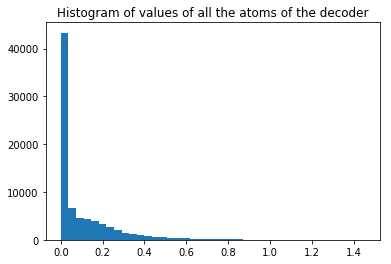

In [36]:
sp_o = 0.05
sp_w = 0.01
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


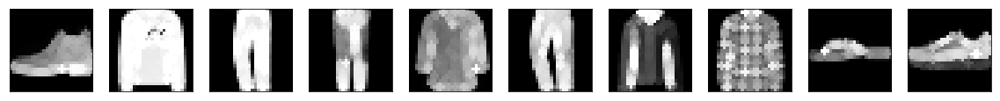

Dilatation of the reconstructions


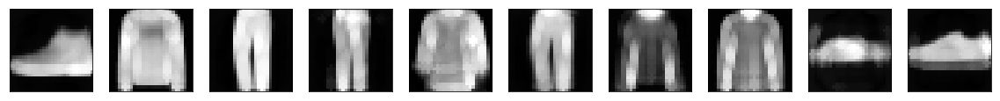

Original images and max-approximation to dilatation
Max-approx error to original:  0.1211897932767868  - Max-approx error to reconstruction:  0.126240953207016


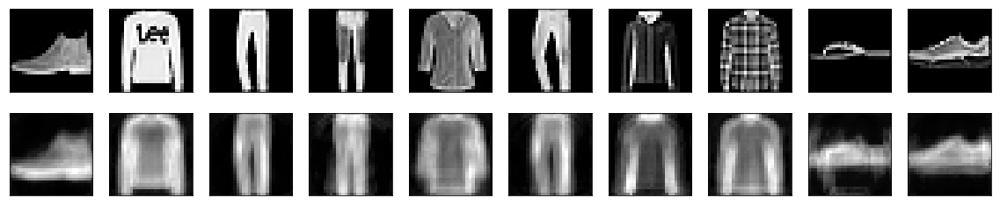

Dilated of the atom images of the decoder


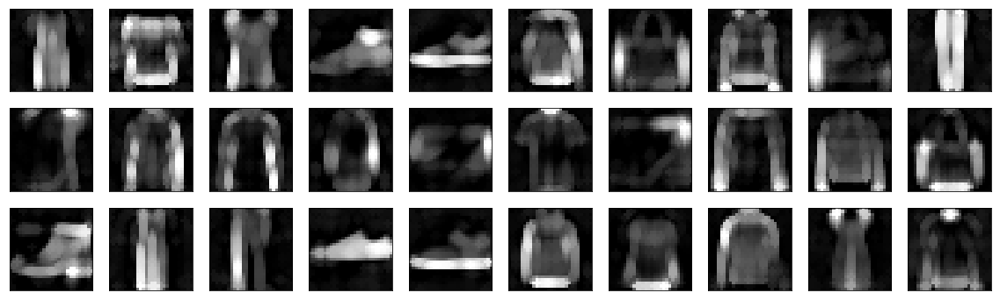

In [37]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 2.6 Sparsity_weight = 0.05 (sp_o = 0.05)

Original images and reconstructions - Reconstruction error:  0.016828341114521028


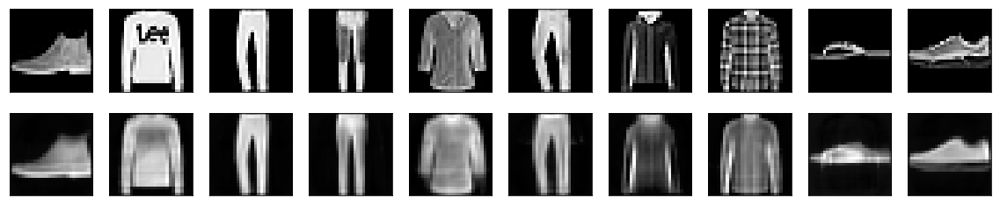

Histograms of the encodings - Sparsity (Hoyer):  0.6030547022819519


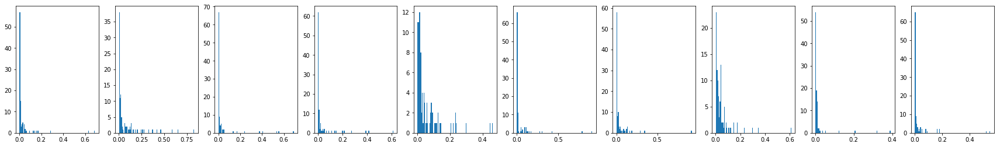

Atom images of the decoder


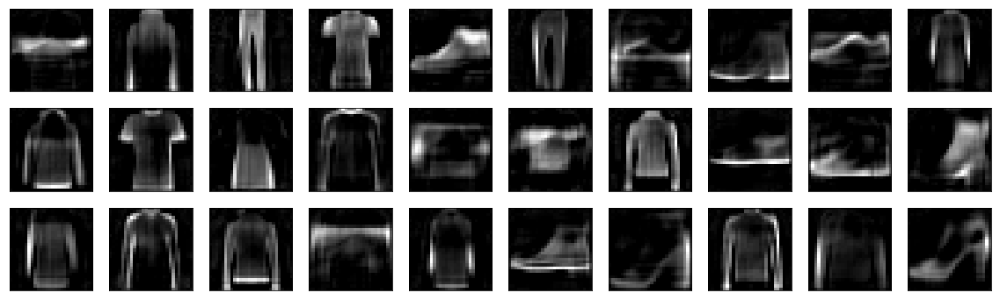

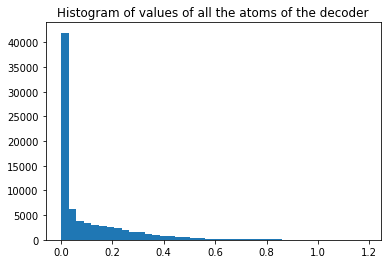

In [7]:
sp_o = 0.05
sp_w = 0.05
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


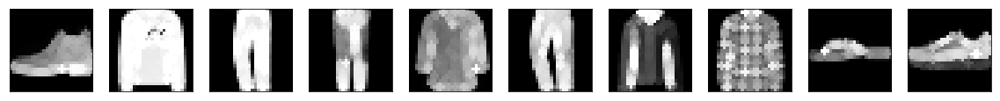

Dilatation of the reconstructions


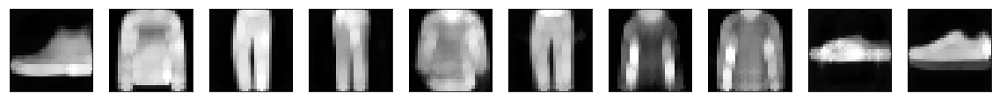

Original images and max-approximation to dilatation
Max-approx error to original:  0.12227487740516663  - Max-approx error to reconstruction:  0.12336783335208892


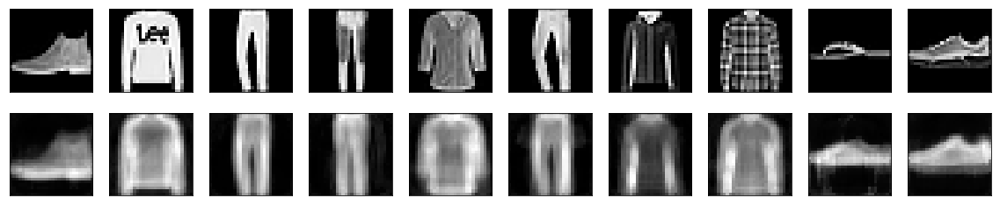

Dilated of the atom images of the decoder


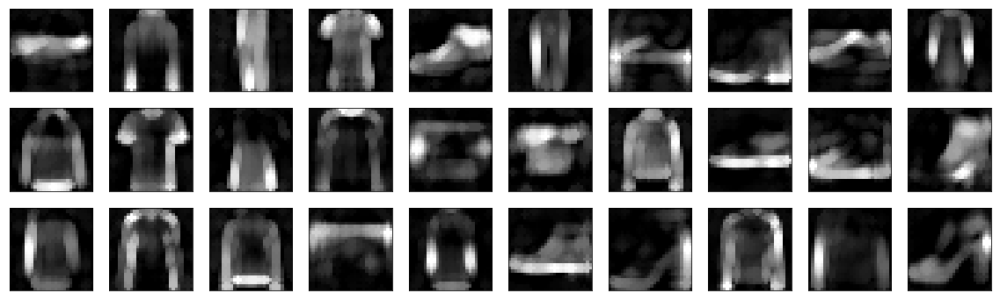

In [8]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 2.7 Sparsity_weight = 0.1 (sp_o = 0.05)

Original images and reconstructions - Reconstruction error:  0.0209527494430542


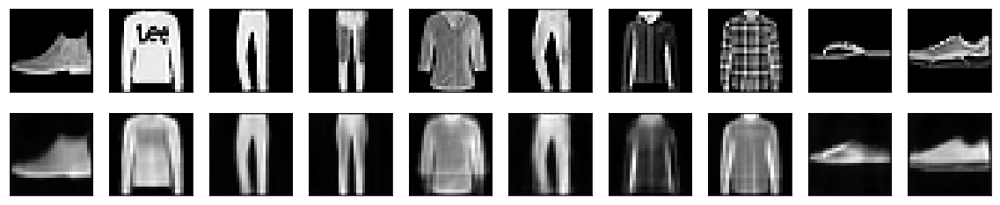

Histograms of the encodings - Sparsity (Hoyer):  0.5906931757926941


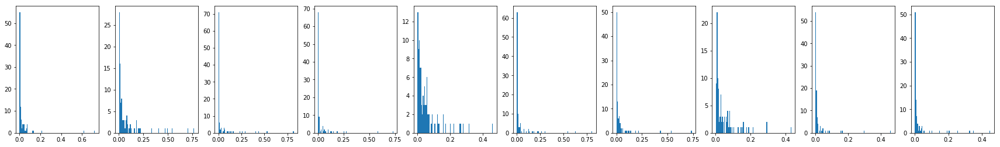

Atom images of the decoder


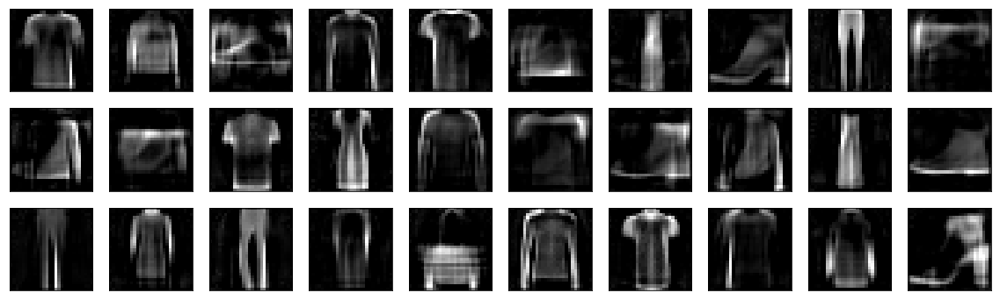

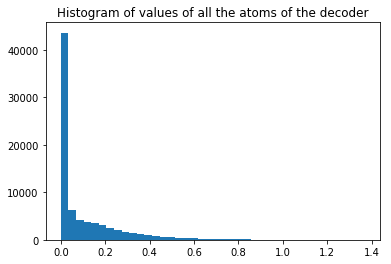

In [9]:
sp_o = 0.05
sp_w = 0.1
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


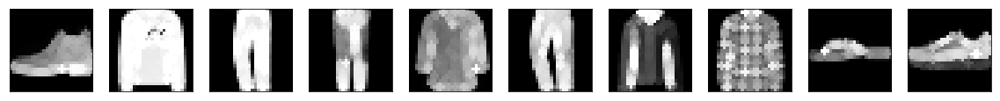

Dilatation of the reconstructions


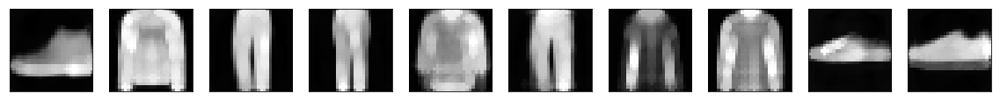

Original images and max-approximation to dilatation
Max-approx error to original:  0.12665405583381653  - Max-approx error to reconstruction:  0.12647754259109498


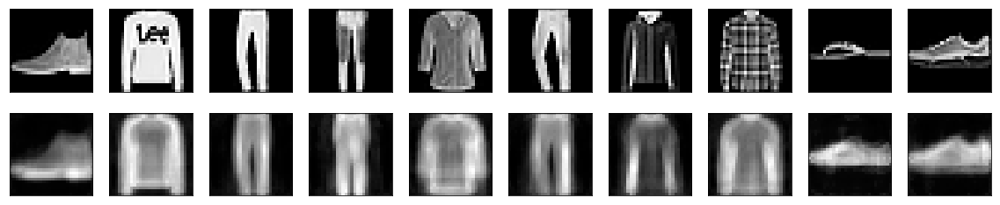

Dilated of the atom images of the decoder


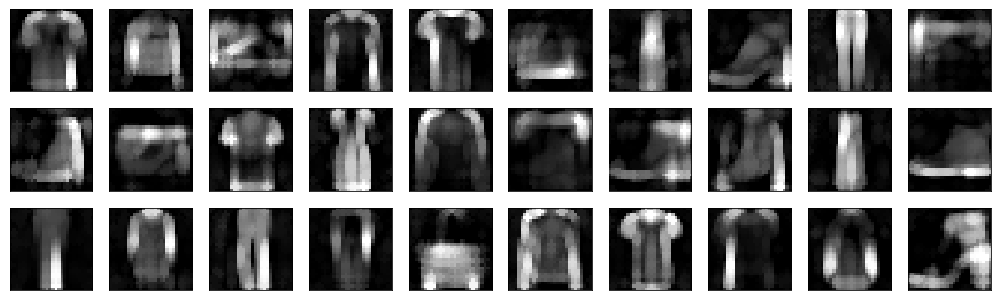

In [10]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 2.8 Sparsity_weight = 0.5 (sp_o = 0.05)

Original images and reconstructions - Reconstruction error:  0.04045304696559906


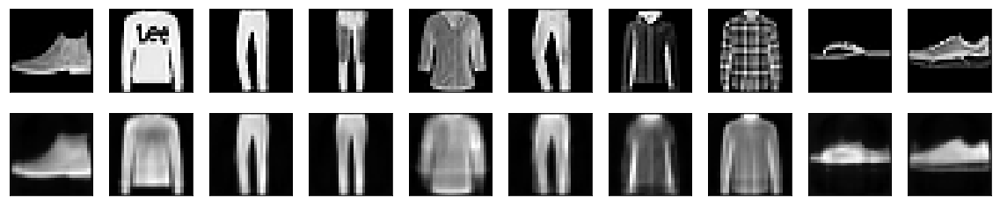

Histograms of the encodings - Sparsity (Hoyer):  0.4911476671695709


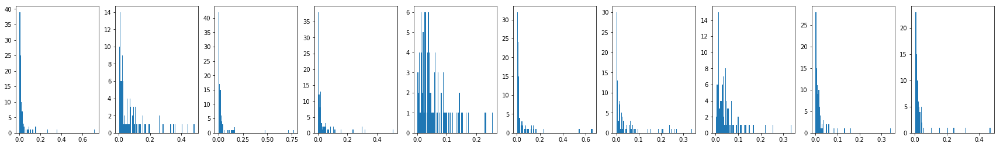

Atom images of the decoder


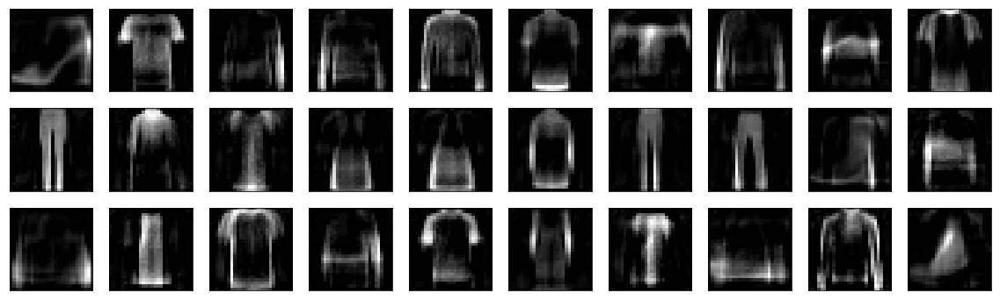

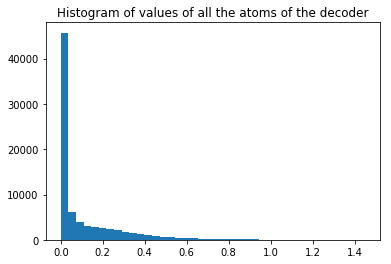

In [11]:
sp_o = 0.05
sp_w = 0.5
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_06_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


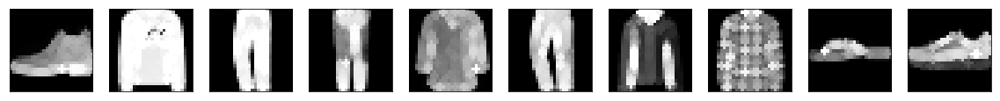

Dilatation of the reconstructions


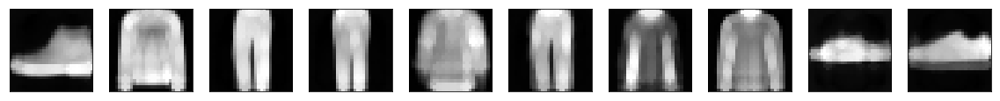

Original images and max-approximation to dilatation
Max-approx error to original:  0.14525073647499084  - Max-approx error to reconstruction:  0.14830053129196166


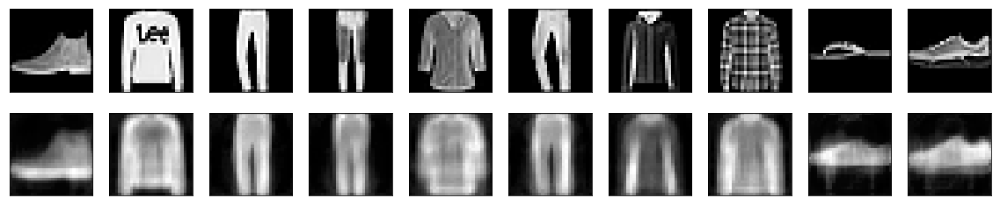

Dilated of the atom images of the decoder


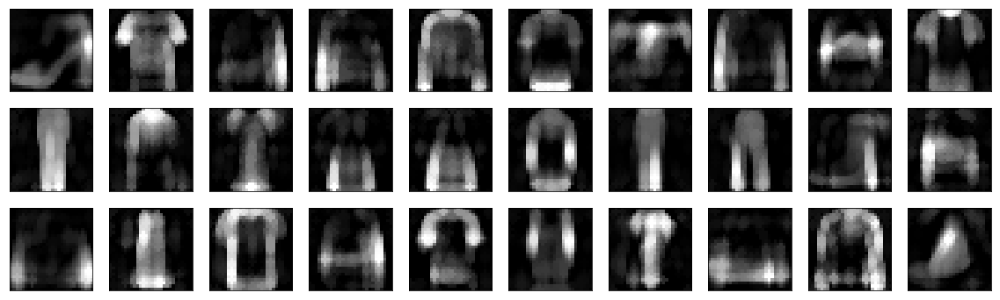

In [12]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

# 3. Sparsity_Objective = 0.1

## 3.1 Sparsity_weight = 0.0001 (sp_o = 0.1)

Original images and reconstructions - Reconstruction error:  0.008923792845010757


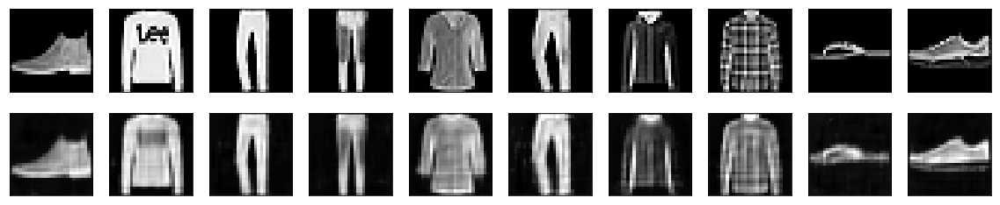

Histograms of the encodings - Sparsity (Hoyer):  0.3431272506713867


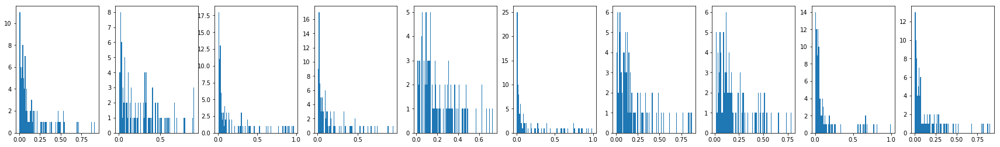

Atom images of the decoder


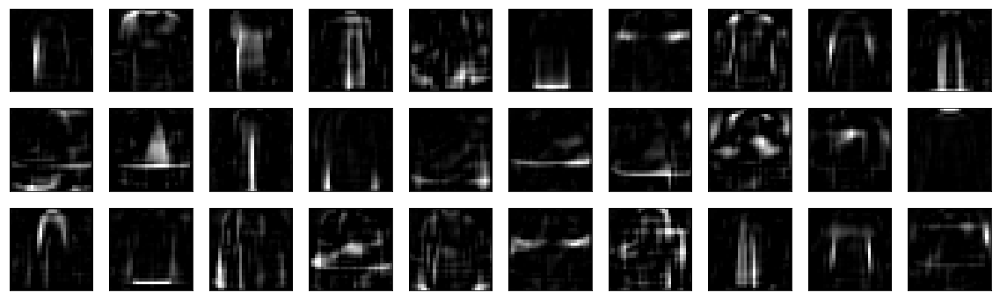

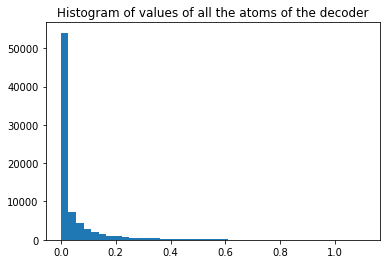

In [13]:
sp_o = 0.1
sp_w = 0.0001
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_04_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


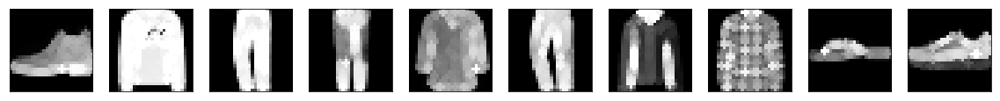

Dilatation of the reconstructions


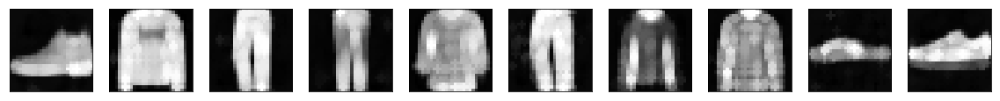

Original images and max-approximation to dilatation
Max-approx error to original:  0.9792310168266296  - Max-approx error to reconstruction:  1.0012580724716187


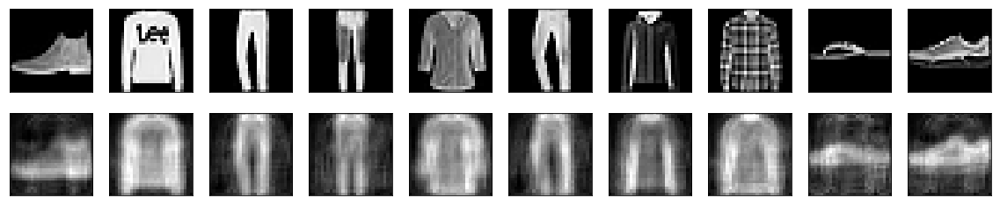

Dilated of the atom images of the decoder


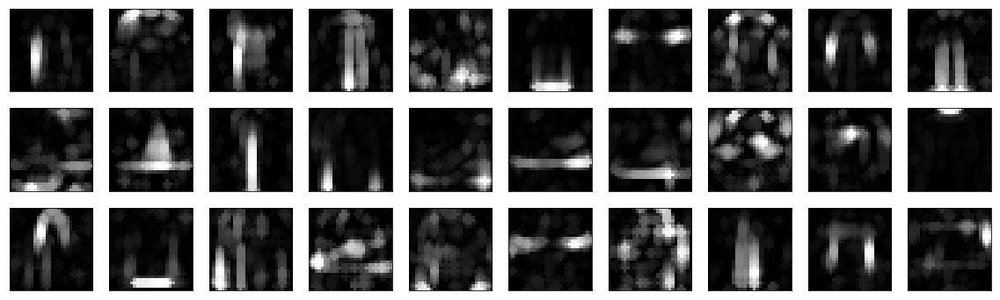

In [14]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 3.2 Sparsity_weight = 0.0005 (sp_o = 0.1)

Original images and reconstructions - Reconstruction error:  0.00971876113563776


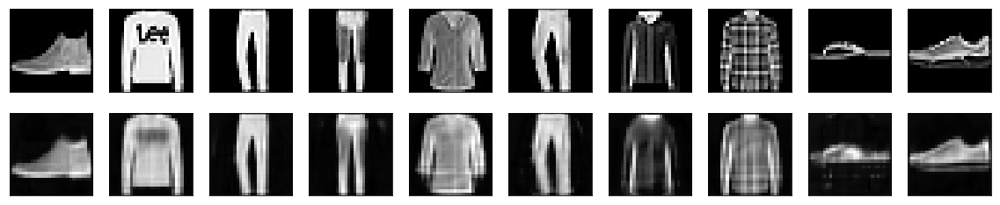

Histograms of the encodings - Sparsity (Hoyer):  0.4314430058002472


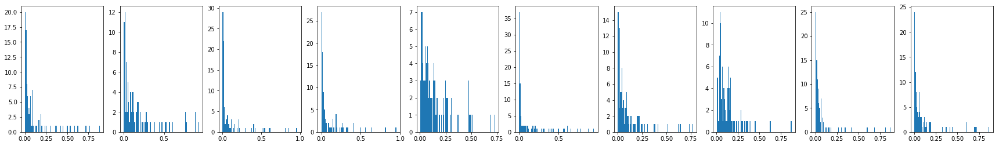

Atom images of the decoder


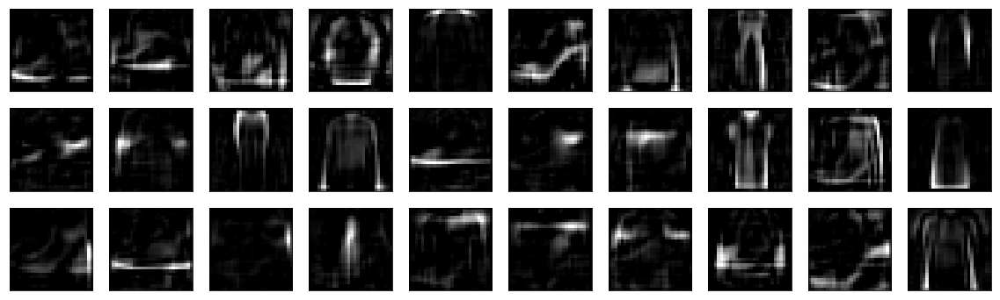

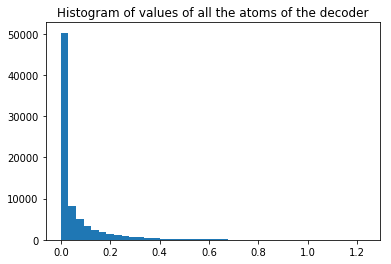

In [15]:
sp_o = 0.1
sp_w = 0.0005
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


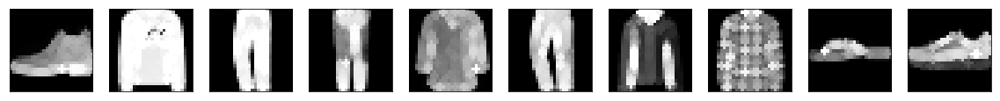

Dilatation of the reconstructions


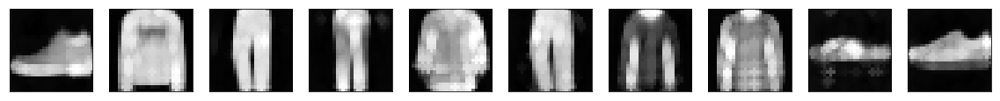

Original images and max-approximation to dilatation
Max-approx error to original:  0.5590680198192597  - Max-approx error to reconstruction:  0.5669575924873352


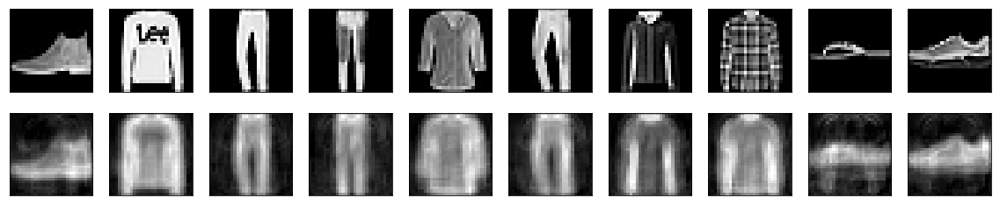

Dilated of the atom images of the decoder


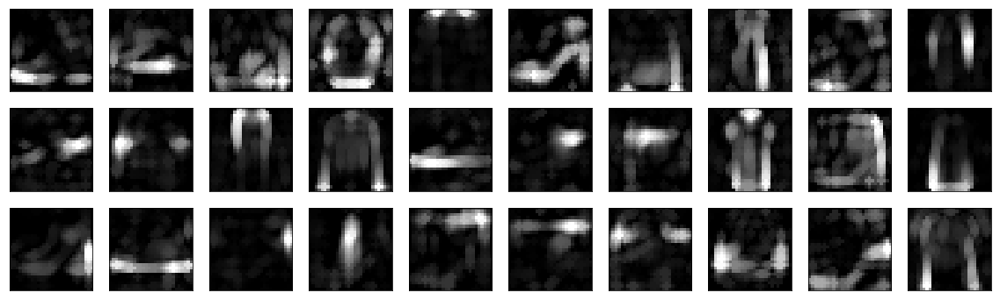

In [16]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 3.3 Sparsity_weight = 0.001 (sp_o = 0.1)

Original images and reconstructions - Reconstruction error:  0.009850346785783767


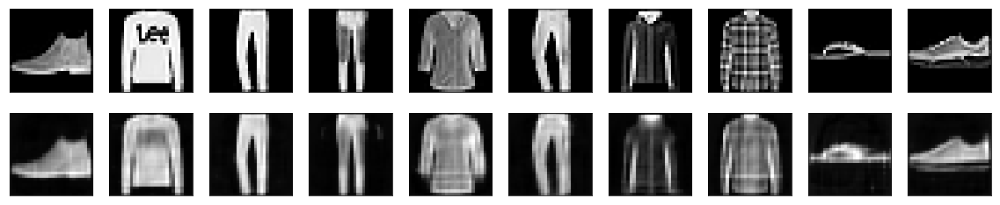

Histograms of the encodings - Sparsity (Hoyer):  0.4604876935482025


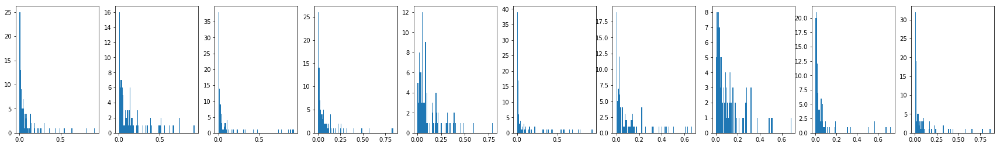

Atom images of the decoder


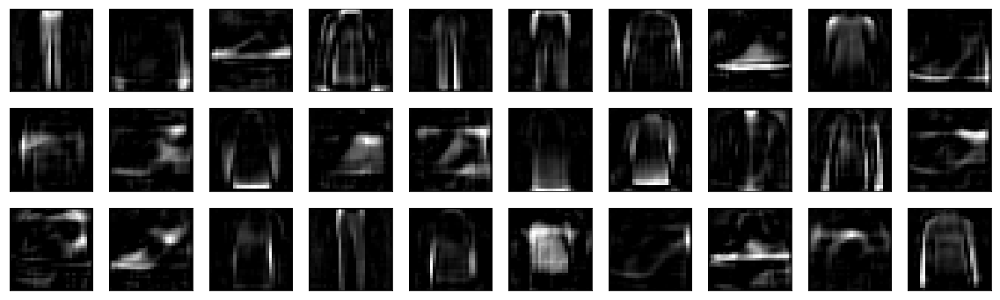

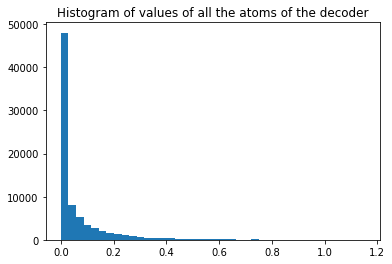

In [17]:
sp_o = 0.1
sp_w = 0.001
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


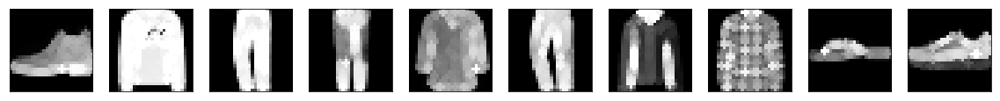

Dilatation of the reconstructions


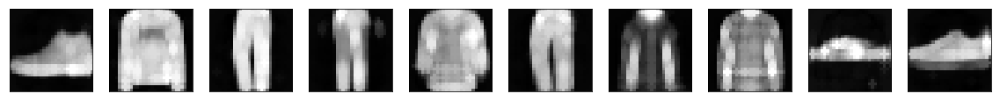

Original images and max-approximation to dilatation
Max-approx error to original:  0.4283603971004486  - Max-approx error to reconstruction:  0.44928949904441834


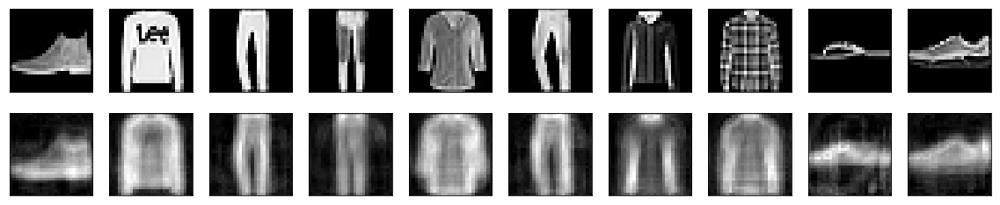

Dilated of the atom images of the decoder


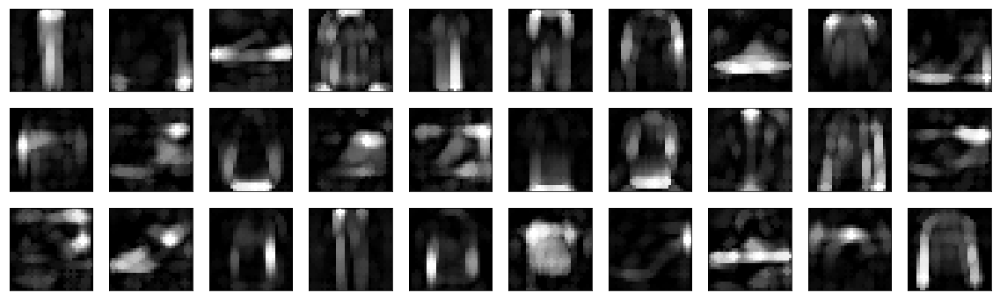

In [18]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 3.4 Sparsity_weight = 0.005 (sp_o = 0.1)

Original images and reconstructions - Reconstruction error:  0.010398251116275787


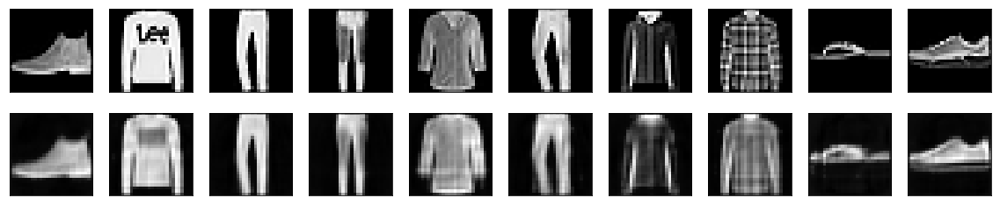

Histograms of the encodings - Sparsity (Hoyer):  0.46978867053985596


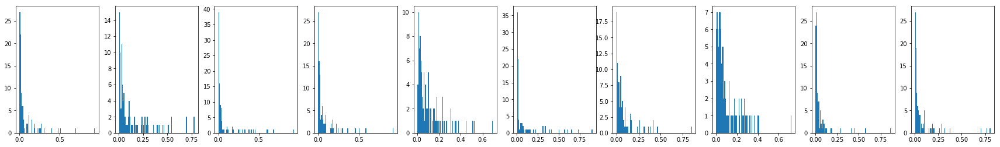

Atom images of the decoder


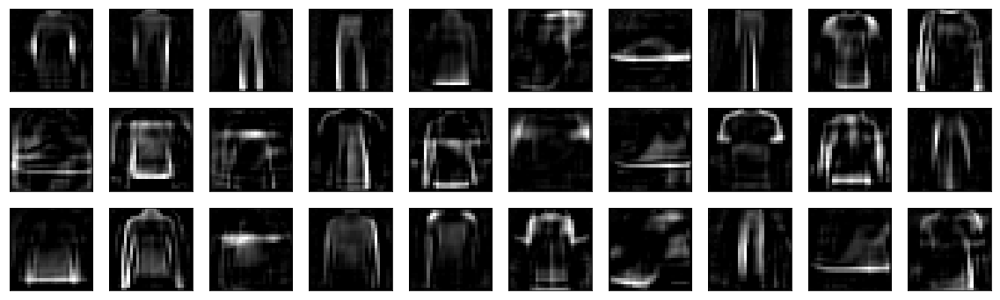

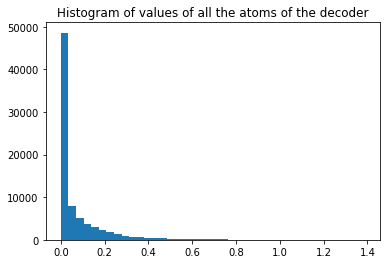

In [19]:
sp_o = 0.1
sp_w = 0.005
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


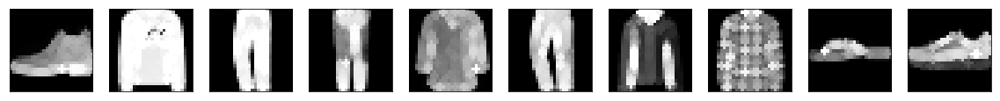

Dilatation of the reconstructions


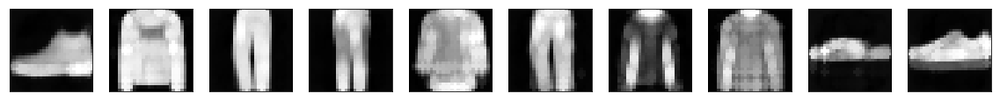

Original images and max-approximation to dilatation
Max-approx error to original:  0.3749164571285248  - Max-approx error to reconstruction:  0.39146892285346985


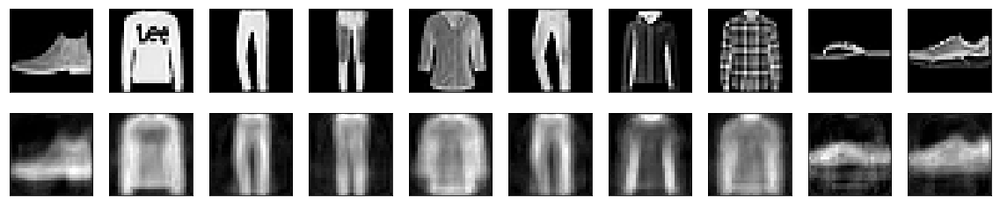

Dilated of the atom images of the decoder


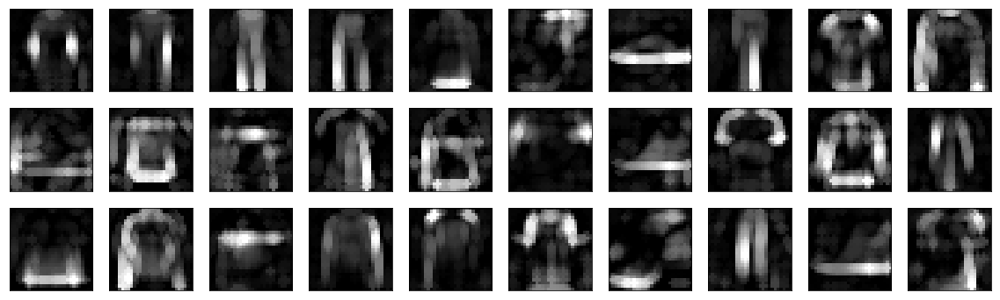

In [20]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 3.5 Sparsity_weight = 0.01 (sp_o = 0.1)

Original images and reconstructions - Reconstruction error:  0.010850740152597427


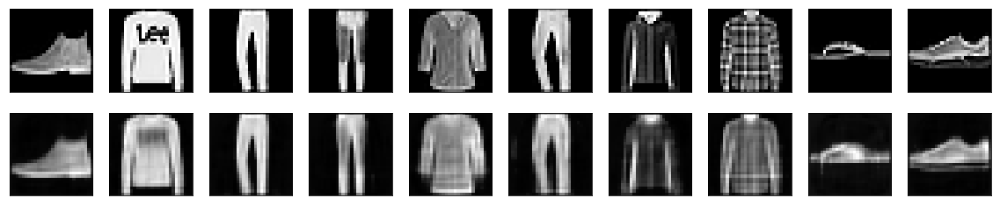

Histograms of the encodings - Sparsity (Hoyer):  0.45837274193763733


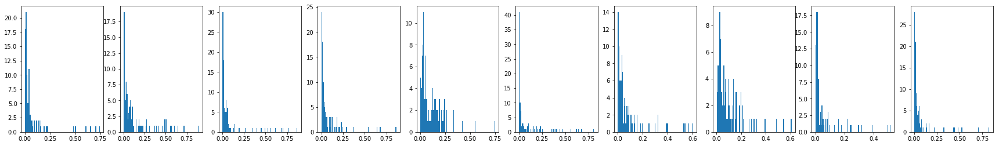

Atom images of the decoder


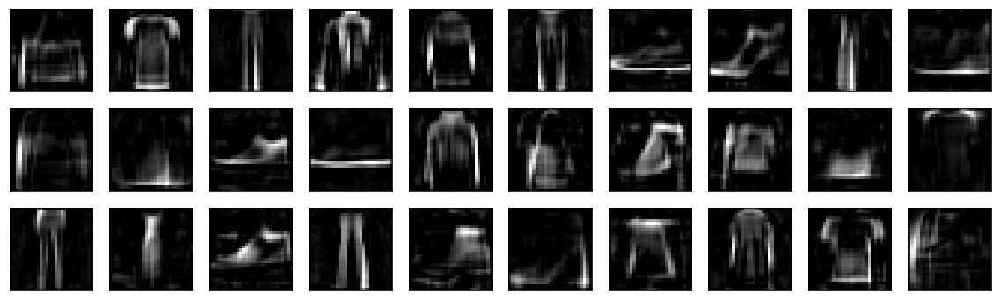

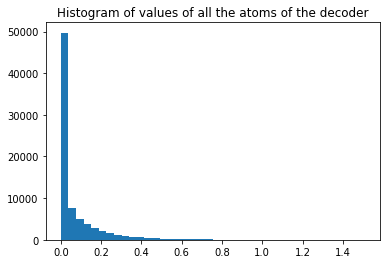

In [21]:
sp_o = 0.1
sp_w = 0.01
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


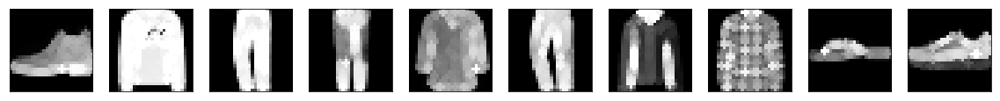

Dilatation of the reconstructions


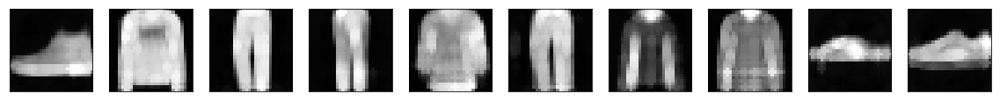

Original images and max-approximation to dilatation
Max-approx error to original:  0.40365636825561524  - Max-approx error to reconstruction:  0.4095816025257111


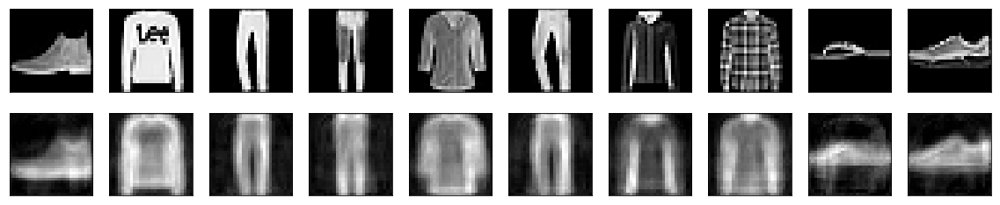

Dilated of the atom images of the decoder


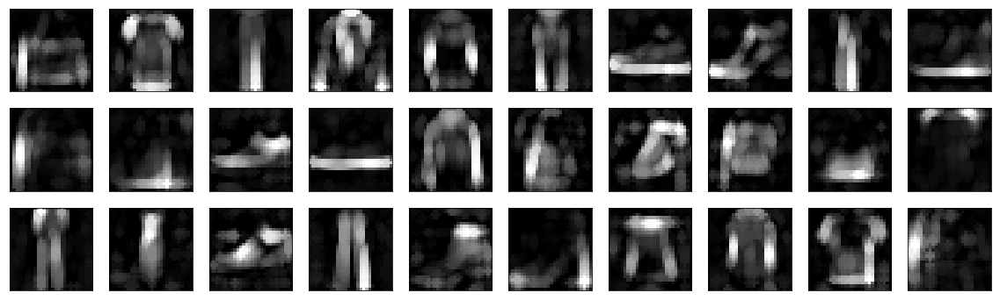

In [22]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 3.6 Sparsity_weight = 0.05 (sp_o = 0.1)

Original images and reconstructions - Reconstruction error:  0.014107609152793884


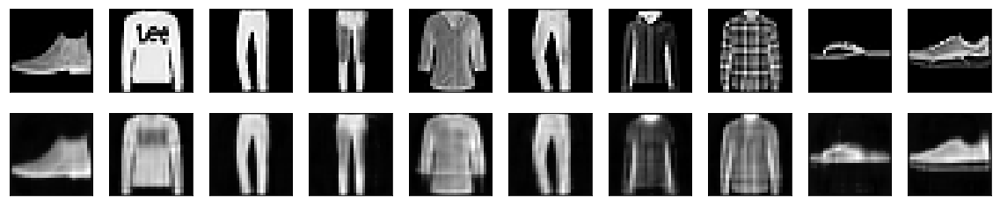

Histograms of the encodings - Sparsity (Hoyer):  0.43292436003685


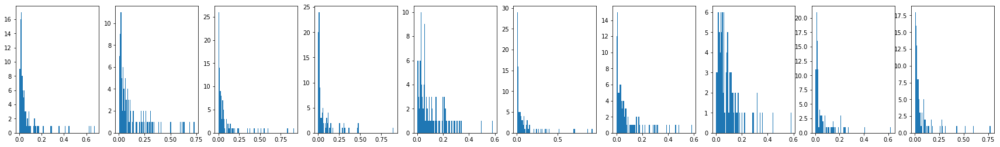

Atom images of the decoder


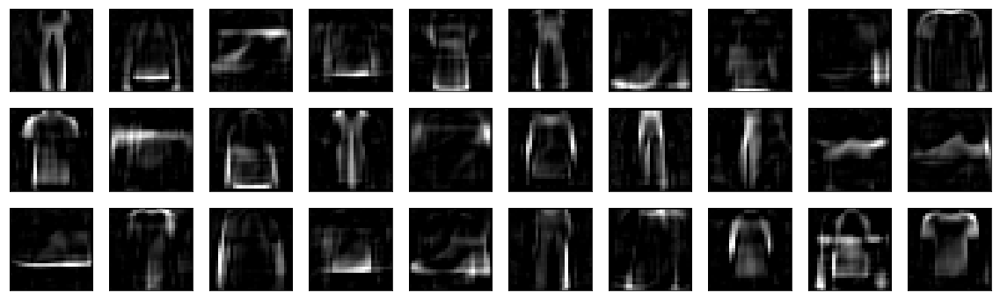

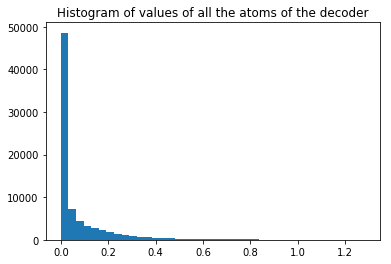

In [23]:
sp_o = 0.1
sp_w = 0.05
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


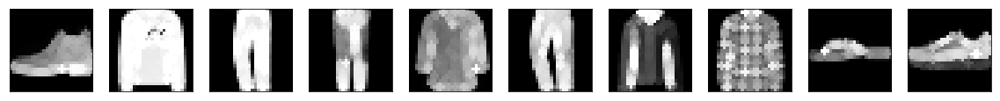

Dilatation of the reconstructions


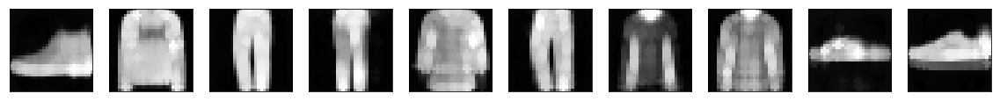

Original images and max-approximation to dilatation
Max-approx error to original:  0.4197761694908142  - Max-approx error to reconstruction:  0.42974141902923585


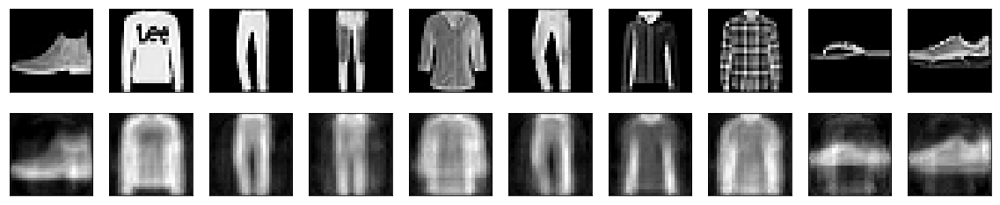

Dilated of the atom images of the decoder


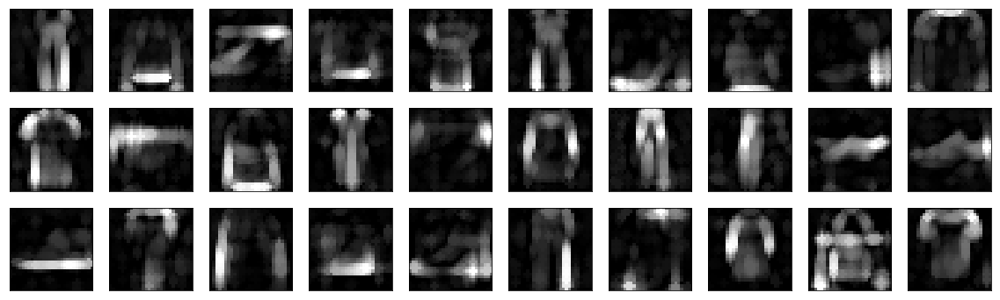

In [24]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 3.7 Sparsity_weight = 0.1 (sp_o = 0.1)

Original images and reconstructions - Reconstruction error:  0.01809892452955246


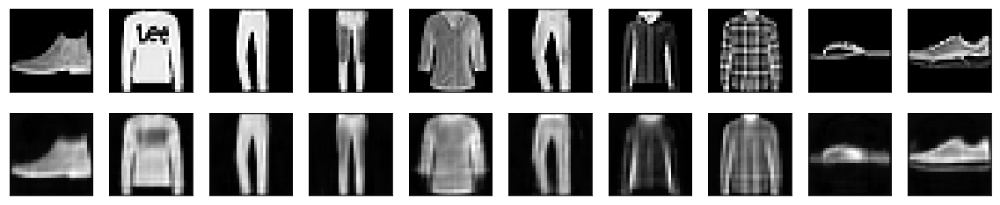

Histograms of the encodings - Sparsity (Hoyer):  0.4267514646053314


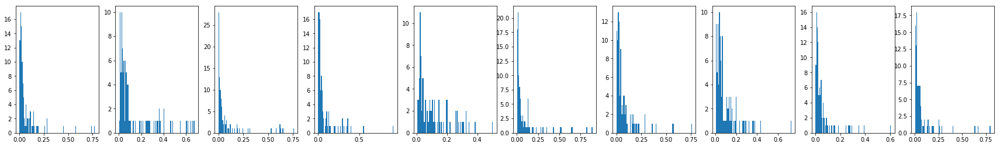

Atom images of the decoder


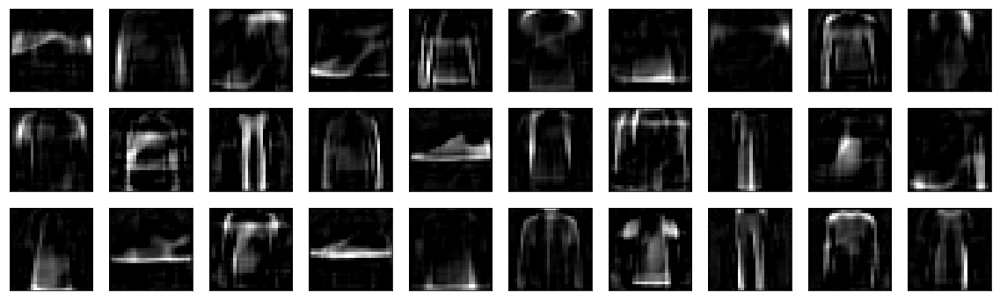

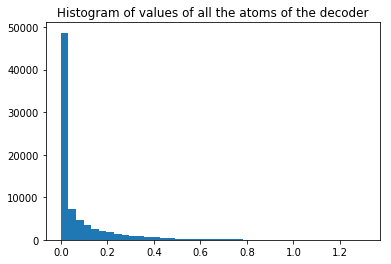

In [25]:
sp_o = 0.1
sp_w = 0.1
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


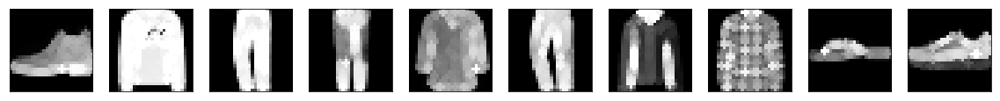

Dilatation of the reconstructions


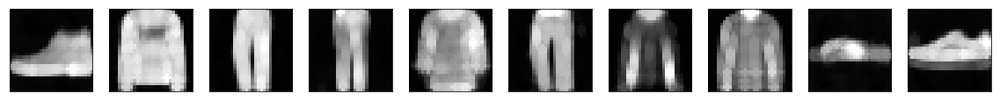

Original images and max-approximation to dilatation
Max-approx error to original:  0.44749594774246215  - Max-approx error to reconstruction:  0.4528492218017578


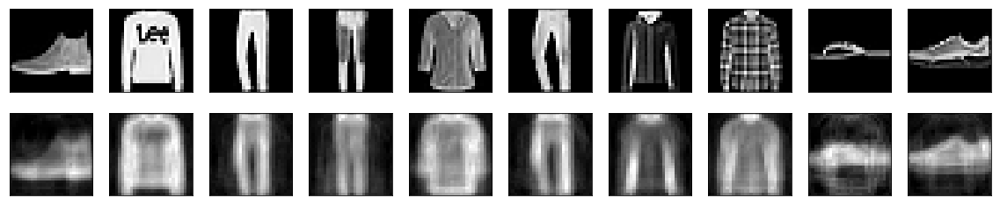

Dilated of the atom images of the decoder


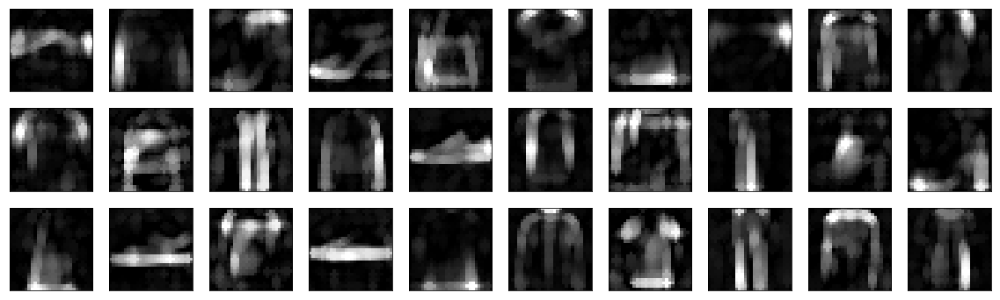

In [26]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 3.8 Sparsity_weight = 0.5 (sp_o = 0.1)

Original images and reconstructions - Reconstruction error:  0.03522810060977936


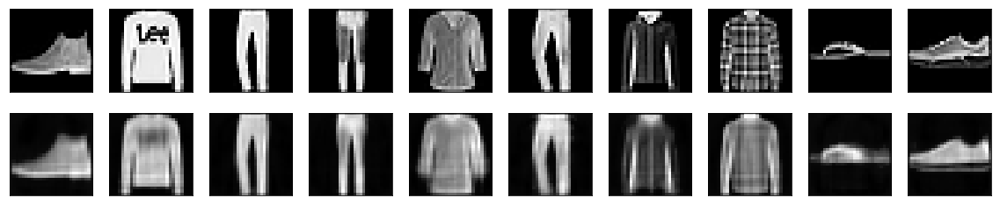

Histograms of the encodings - Sparsity (Hoyer):  0.32986849546432495


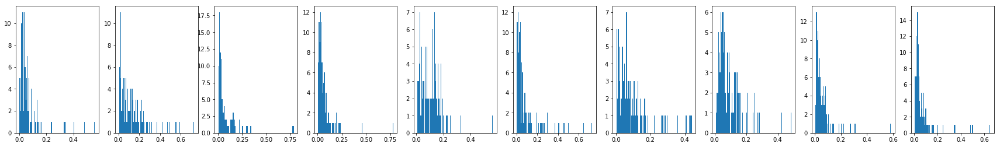

Atom images of the decoder


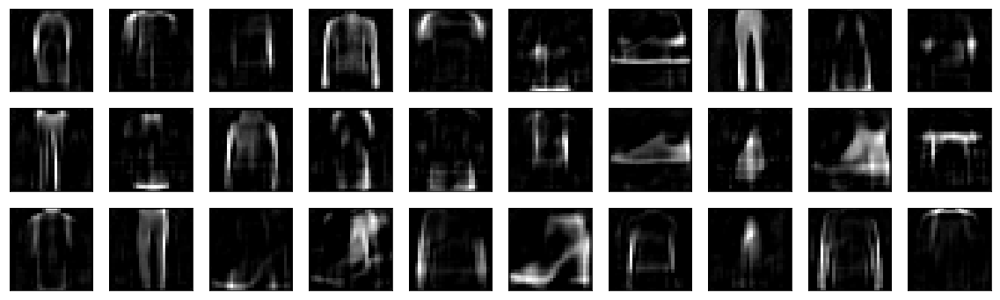

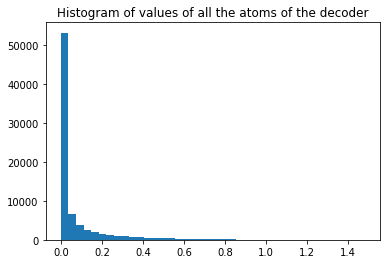

In [27]:
sp_o = 0.1
sp_w = 0.5
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_06_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


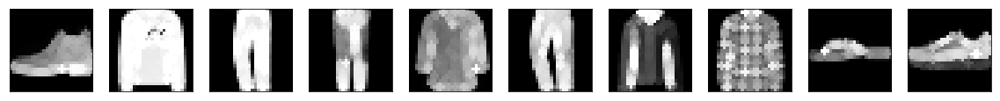

Dilatation of the reconstructions


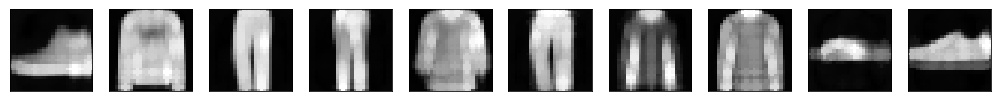

Original images and max-approximation to dilatation
Max-approx error to original:  0.46258854570388797  - Max-approx error to reconstruction:  0.49343492946624756


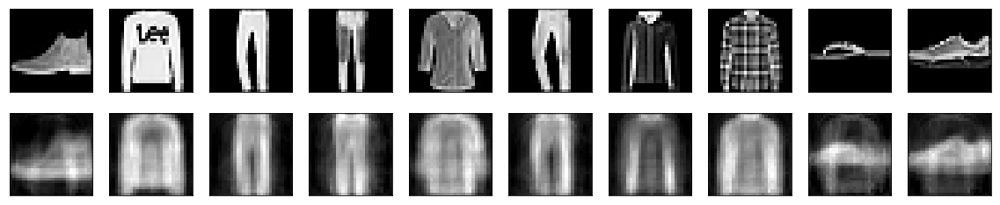

Dilated of the atom images of the decoder


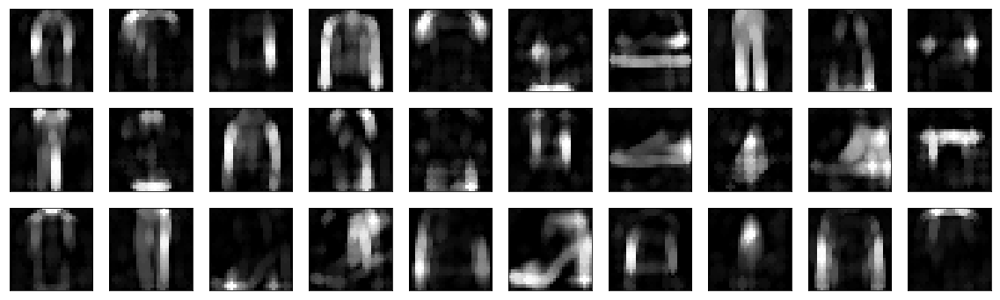

In [28]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

# 4. Sparsity_Objective = 0.2

## 4.1 Sparsity_weight = 0.0001 (sp_o = 0.2)

Original images and reconstructions - Reconstruction error:  0.008333789107203483


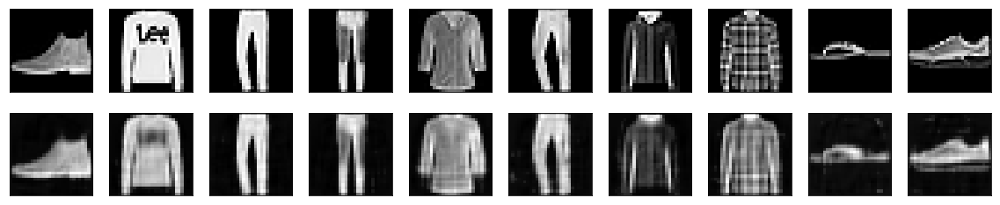

Histograms of the encodings - Sparsity (Hoyer):  0.2883390188217163


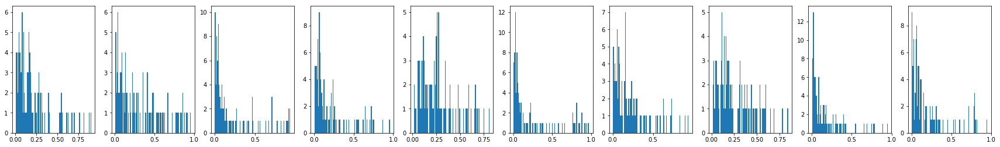

Atom images of the decoder


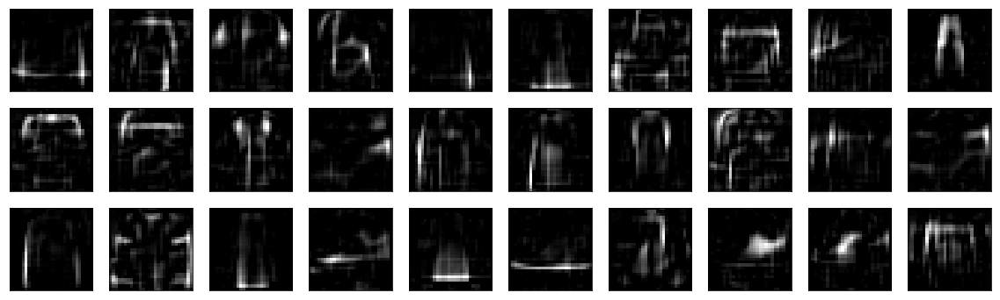

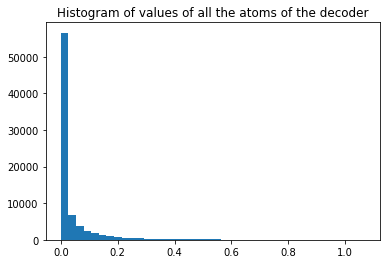

In [29]:
sp_o = 0.2
sp_w = 0.0001
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_04_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


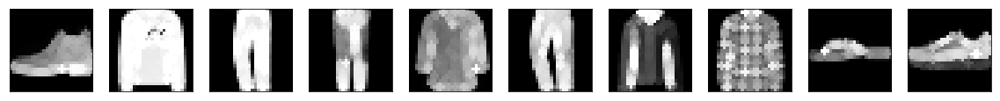

Dilatation of the reconstructions


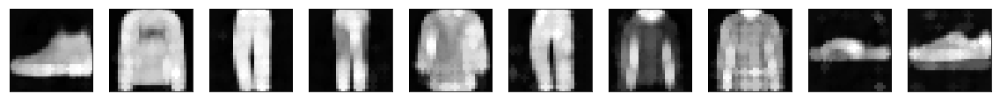

Original images and max-approximation to dilatation
Max-approx error to original:  1.325980347251892  - Max-approx error to reconstruction:  1.3589099292755127


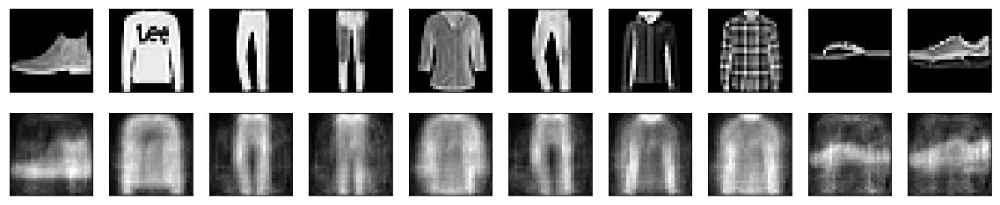

Dilated of the atom images of the decoder


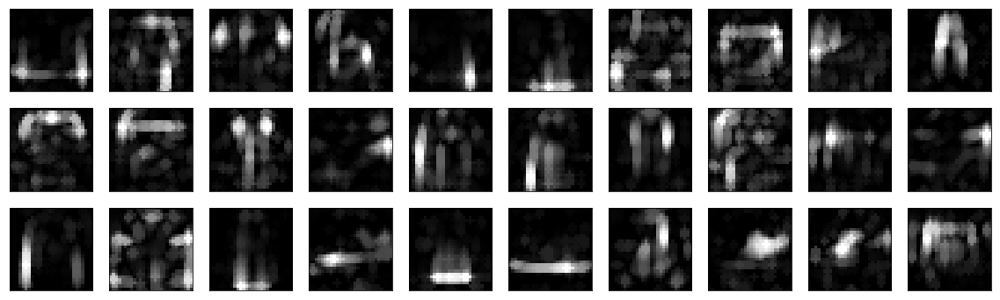

In [30]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 4.2 Sparsity_weight = 0.0005 (sp_o = 0.2)

Original images and reconstructions - Reconstruction error:  0.008571325917541981


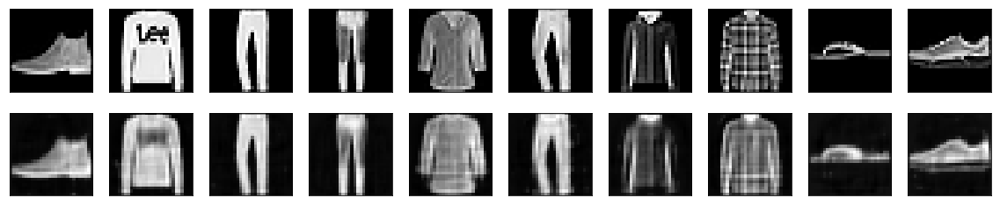

Histograms of the encodings - Sparsity (Hoyer):  0.31435346603393555


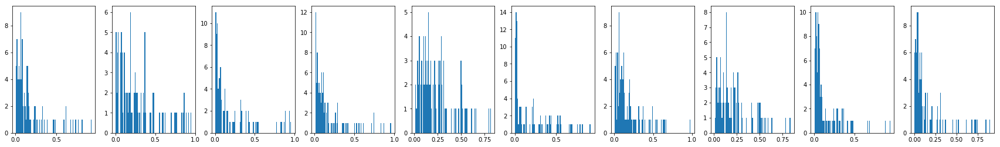

Atom images of the decoder


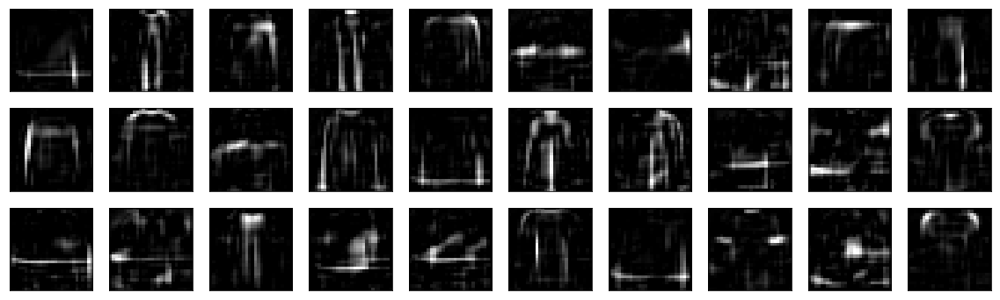

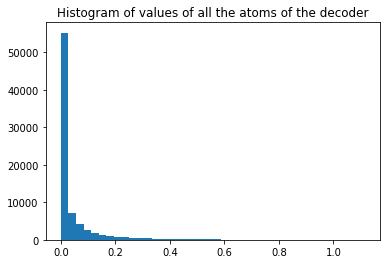

In [31]:
sp_o = 0.2
sp_w = 0.0005
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


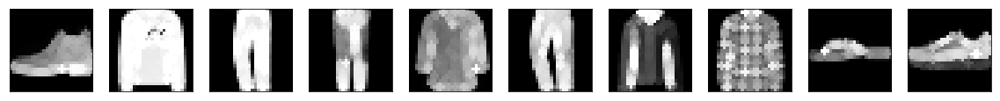

Dilatation of the reconstructions


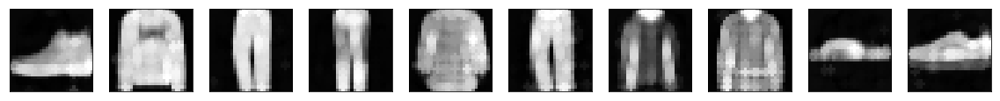

Original images and max-approximation to dilatation
Max-approx error to original:  1.122914188671112  - Max-approx error to reconstruction:  1.1401252851486205


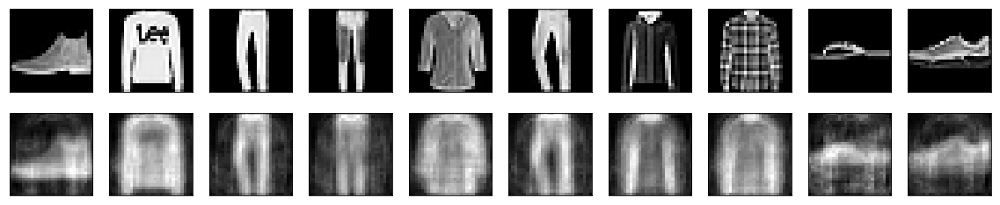

Dilated of the atom images of the decoder


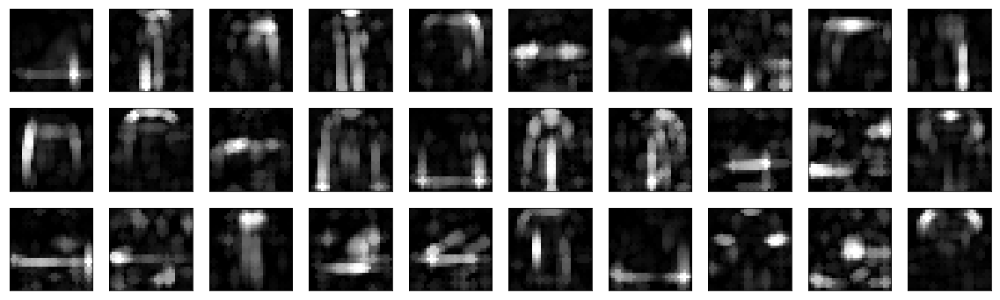

In [32]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 4.3 Sparsity_weight = 0.001 (sp_o = 0.2)

Original images and reconstructions - Reconstruction error:  0.00868652572929859


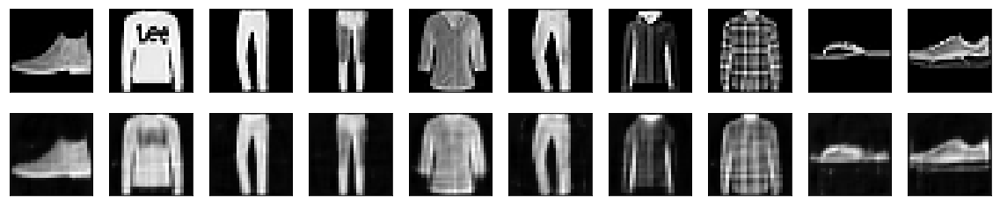

Histograms of the encodings - Sparsity (Hoyer):  0.3227752447128296


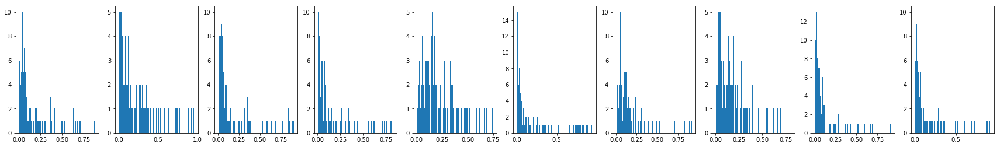

Atom images of the decoder


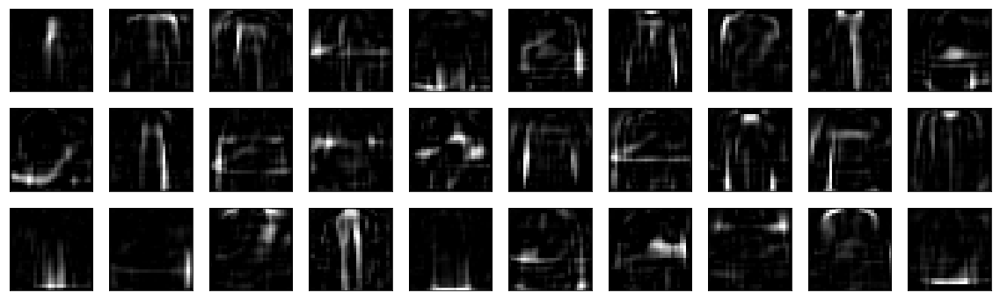

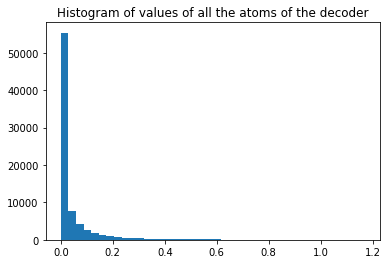

In [33]:
sp_o = 0.2
sp_w = 0.001
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


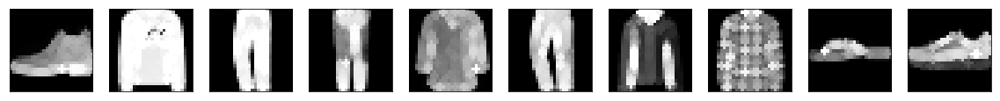

Dilatation of the reconstructions


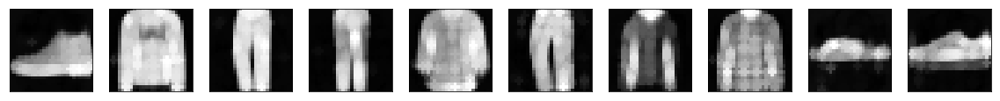

Original images and max-approximation to dilatation
Max-approx error to original:  0.9818450094223022  - Max-approx error to reconstruction:  1.0312829214096069


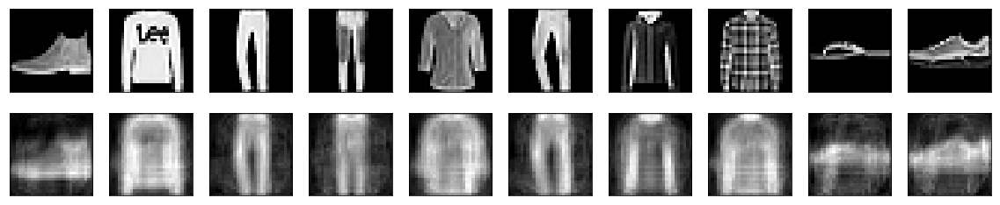

Dilated of the atom images of the decoder


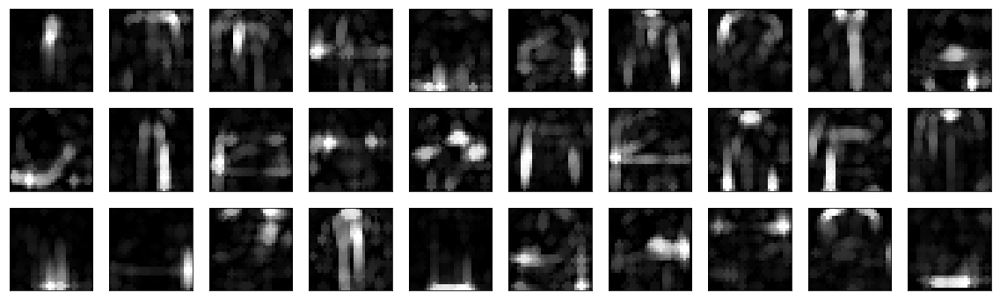

In [34]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 4.4 Sparsity_weight = 0.005 (sp_o = 0.2)

Original images and reconstructions - Reconstruction error:  0.008951536244153976


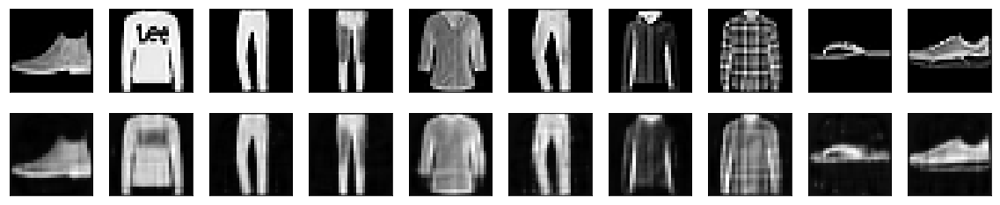

Histograms of the encodings - Sparsity (Hoyer):  0.31709498167037964


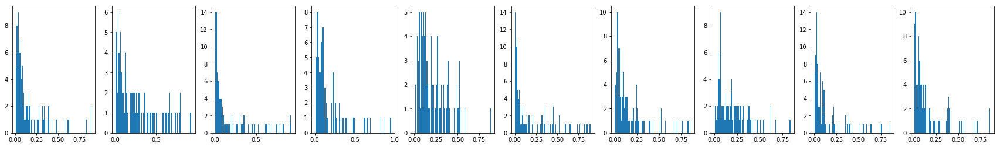

Atom images of the decoder


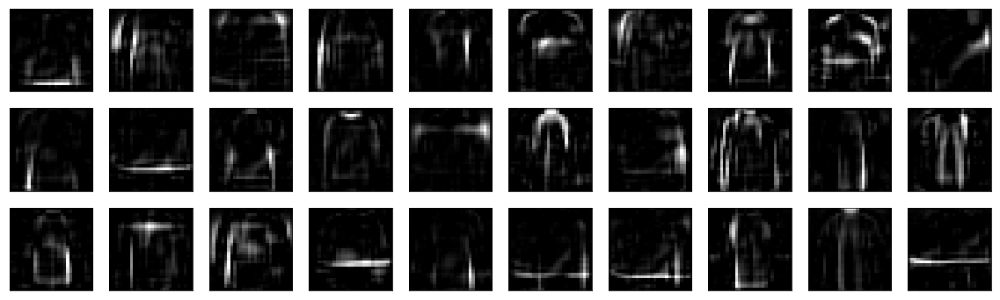

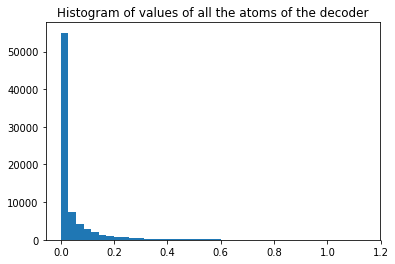

In [35]:
sp_o = 0.2
sp_w = 0.005
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


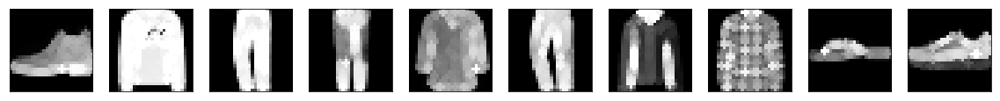

Dilatation of the reconstructions


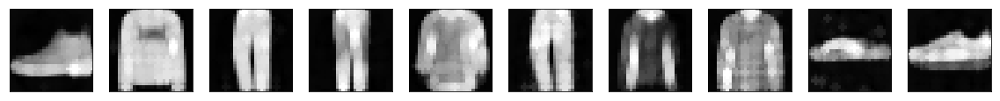

Original images and max-approximation to dilatation
Max-approx error to original:  0.9808656272888183  - Max-approx error to reconstruction:  1.0149258404731751


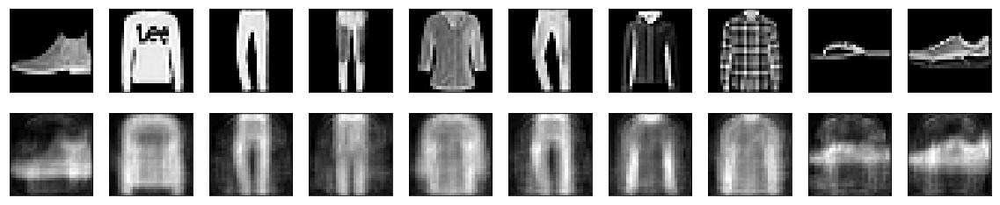

Dilated of the atom images of the decoder


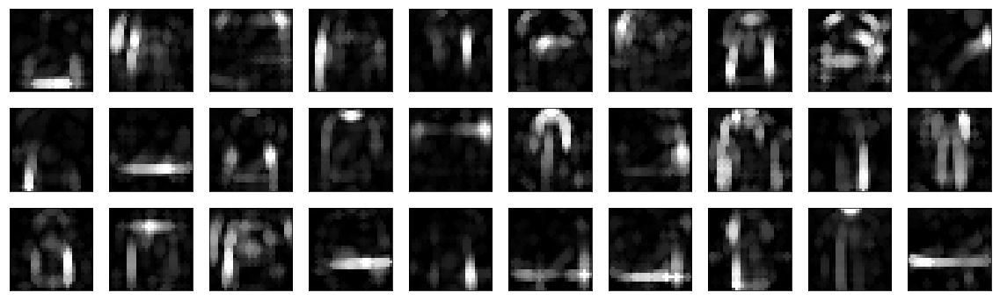

In [36]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 4.5 Sparsity_weight = 0.01 (sp_o = 0.2)

Original images and reconstructions - Reconstruction error:  0.009437026563286781


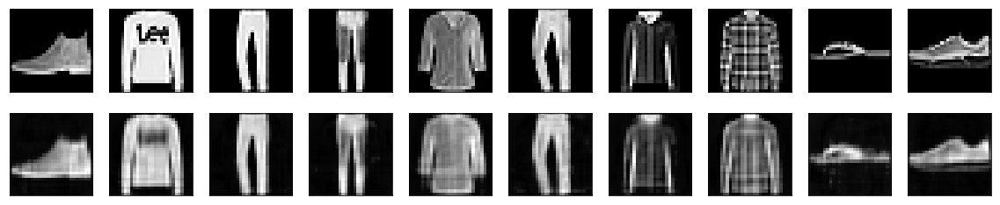

Histograms of the encodings - Sparsity (Hoyer):  0.3065062463283539


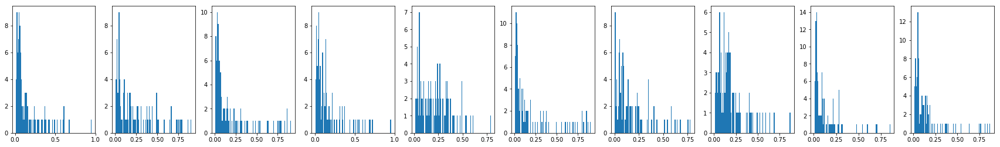

Atom images of the decoder


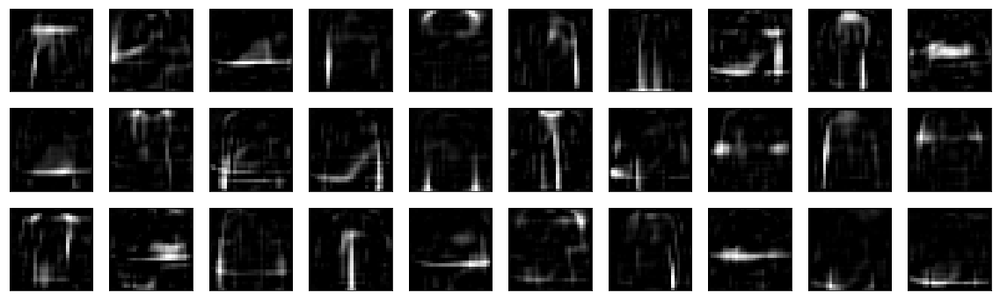

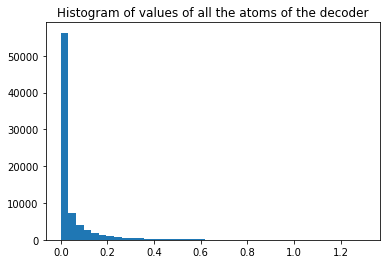

In [37]:
sp_o = 0.2
sp_w = 0.01
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


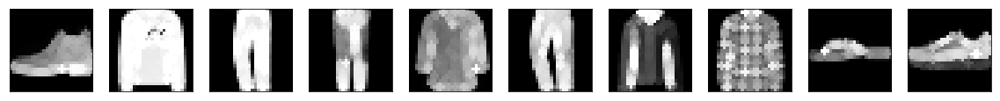

Dilatation of the reconstructions


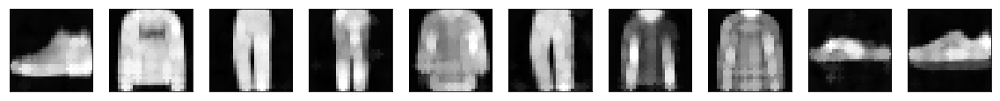

Original images and max-approximation to dilatation
Max-approx error to original:  1.0262563446998596  - Max-approx error to reconstruction:  1.0552798008918762


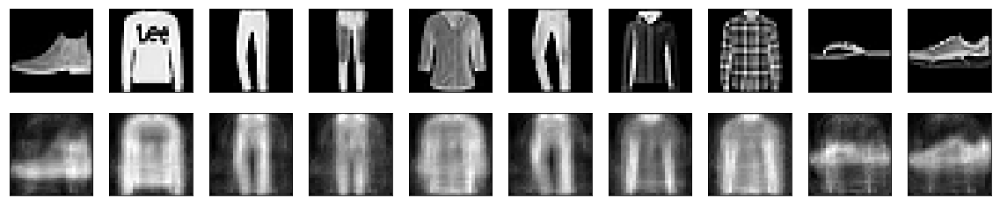

Dilated of the atom images of the decoder


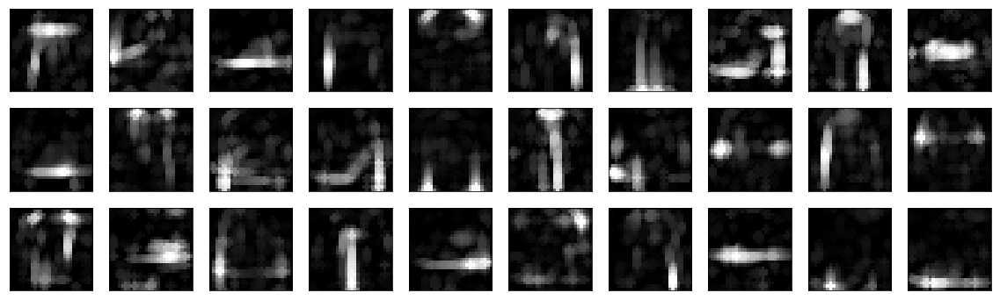

In [38]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 4.6 Sparsity_weight = 0.05 (sp_o = 0.2)

Original images and reconstructions - Reconstruction error:  0.013302670109272004


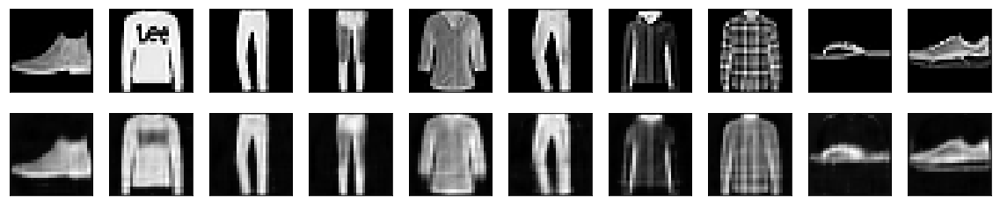

Histograms of the encodings - Sparsity (Hoyer):  0.2790448069572449


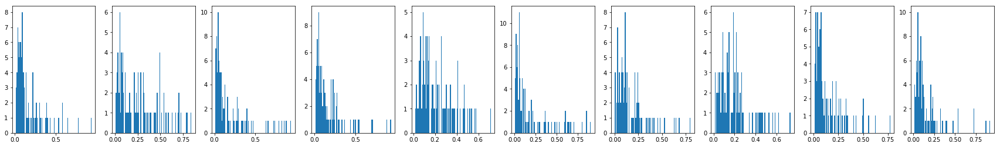

Atom images of the decoder


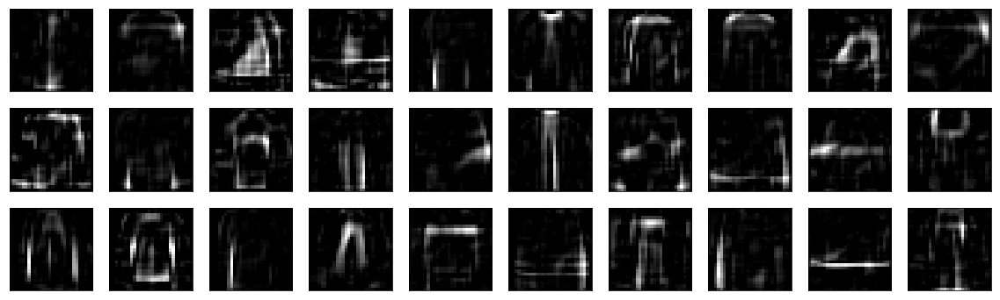

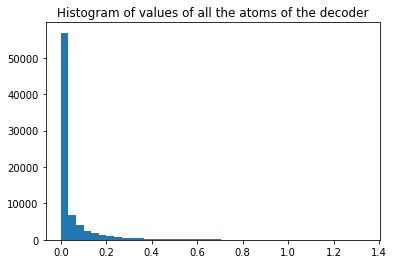

In [39]:
sp_o = 0.2
sp_w = 0.05
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


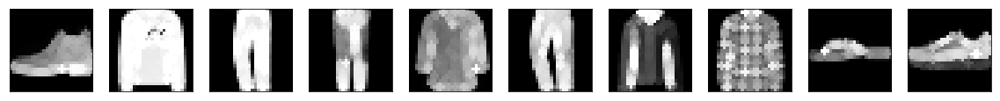

Dilatation of the reconstructions


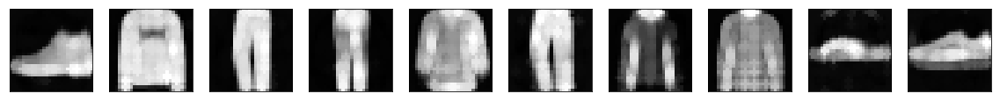

Original images and max-approximation to dilatation
Max-approx error to original:  1.214131480026245  - Max-approx error to reconstruction:  1.2052686038970948


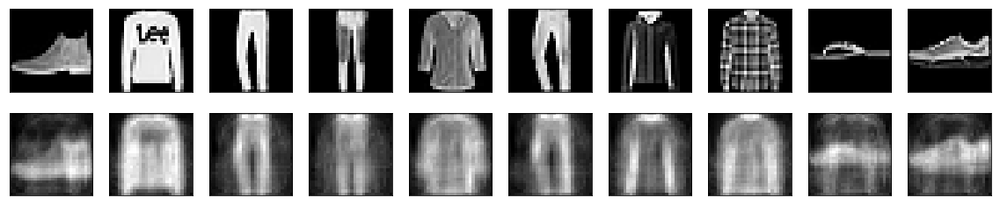

Dilated of the atom images of the decoder


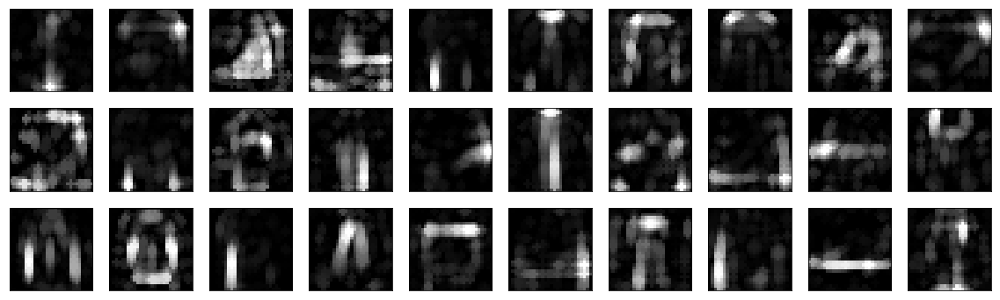

In [40]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 4.7 Sparsity_weight = 0.1 (sp_o = 0.2)

Original images and reconstructions - Reconstruction error:  0.01623390517234802


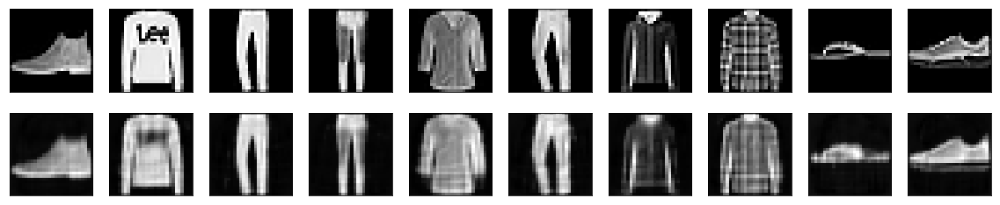

Histograms of the encodings - Sparsity (Hoyer):  0.2649666368961334


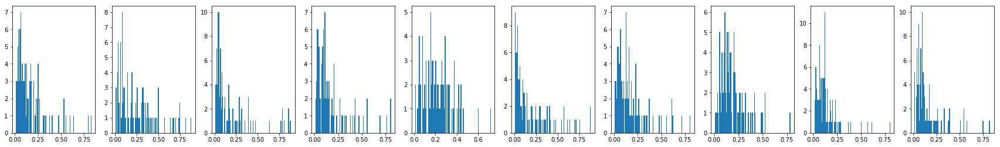

Atom images of the decoder


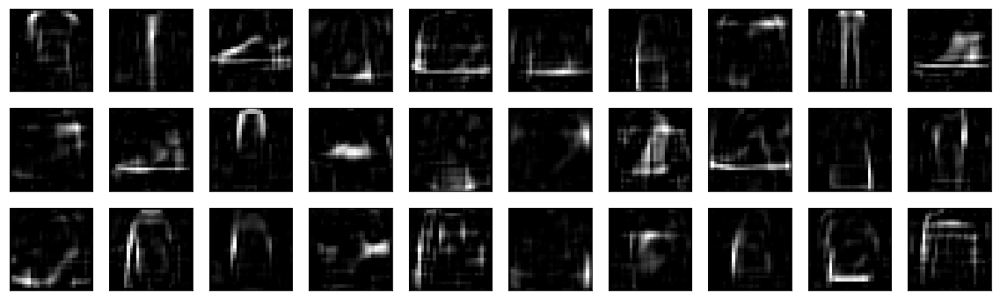

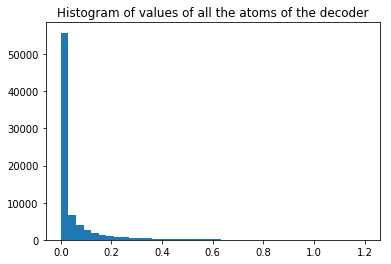

In [41]:
sp_o = 0.2
sp_w = 0.1
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_05_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


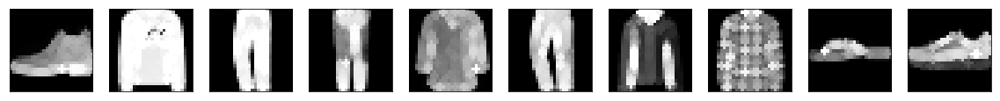

Dilatation of the reconstructions


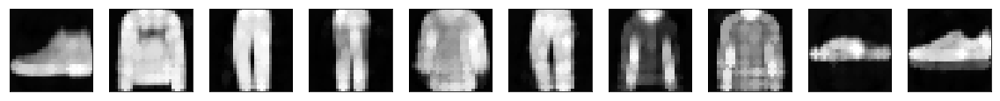

Original images and max-approximation to dilatation
Max-approx error to original:  1.213826580429077  - Max-approx error to reconstruction:  1.2598981346130371


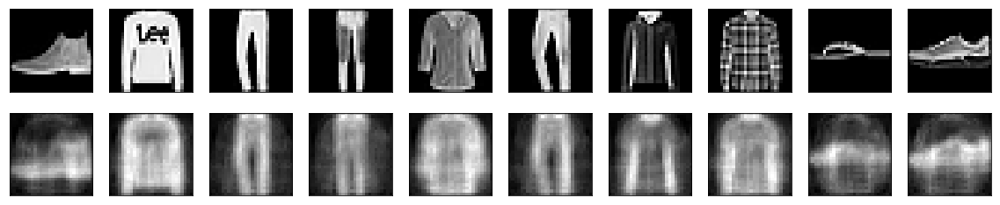

Dilated of the atom images of the decoder


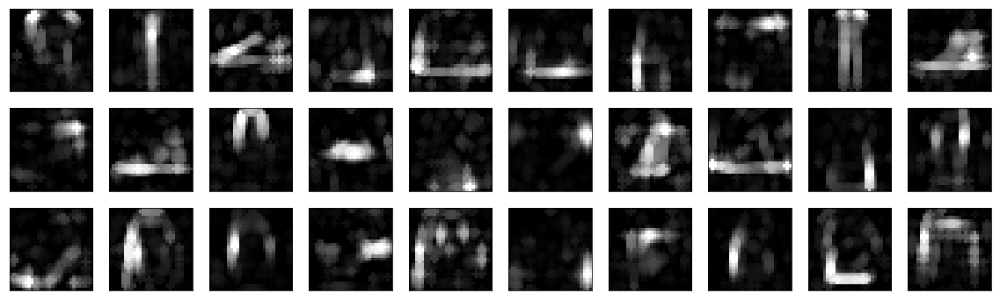

In [42]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)

## 4.8 Sparsity_weight = 0.5 (sp_o = 0.2)

Original images and reconstructions - Reconstruction error:  0.03950589697360993


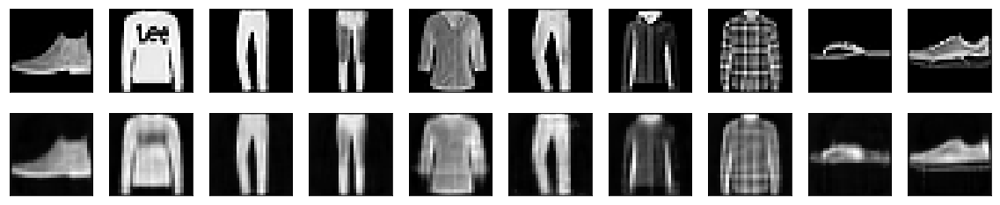

Histograms of the encodings - Sparsity (Hoyer):  0.22288991510868073


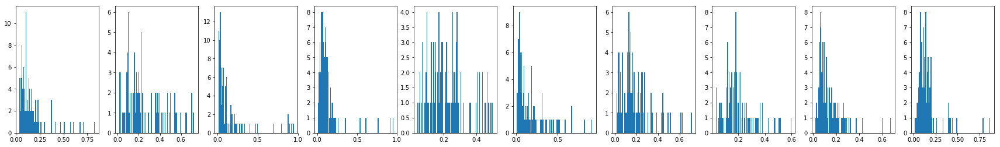

Atom images of the decoder


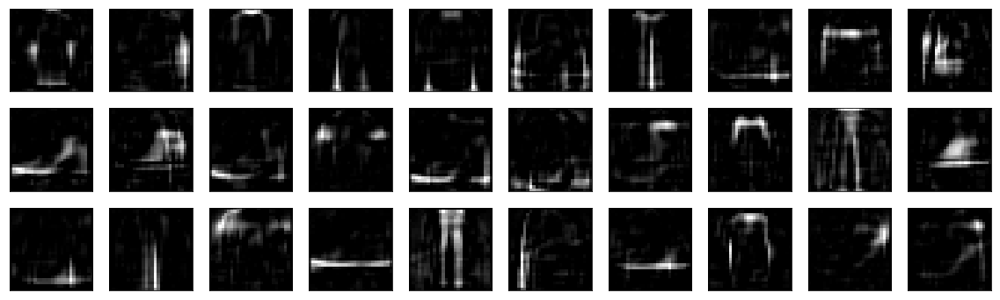

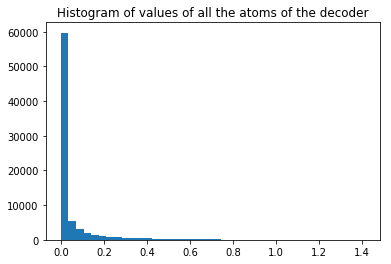

In [43]:
sp_o = 0.2
sp_w = 0.5
i = np.arange(8)[sparsity_weights==sp_w][0]
j = np.arange(4)[sparsity_objectives==sp_o][0]
AE = Sparse_NonNeg_AsymAEinfoGAN_KLsum_NonNegConstraint.load('18_09_06_dim100_KLdivSum_'+str(sp_w)+'_'+str(sp_o)+'_NonNegConstraint.h5')
print('Original images and reconstructions - Reconstruction error: ', test_mse[i,j])
AE.plot_reconstructions(x_small)
print('Histograms of the encodings - Sparsity (Hoyer): ', test_sparsity[i,j])
AE.plot_histograms_of_the_encoding(x_small)
print('Atom images of the decoder')
AE.plot_atoms_decoder(nb_to_plot=30)
AE.plot_histograms_of_the_decoder_atoms()

Dilatation of the original images


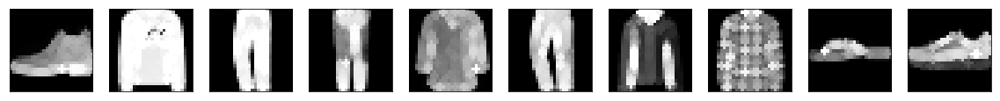

Dilatation of the reconstructions


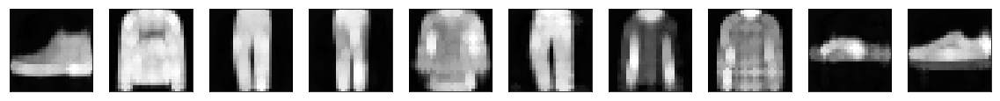

Original images and max-approximation to dilatation
Max-approx error to original:  1.321402024078369  - Max-approx error to reconstruction:  1.3532401523590087


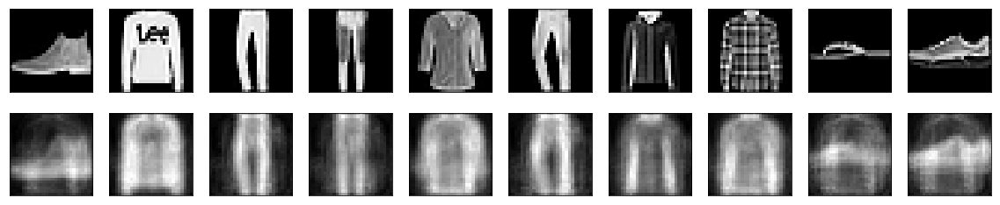

Dilated of the atom images of the decoder


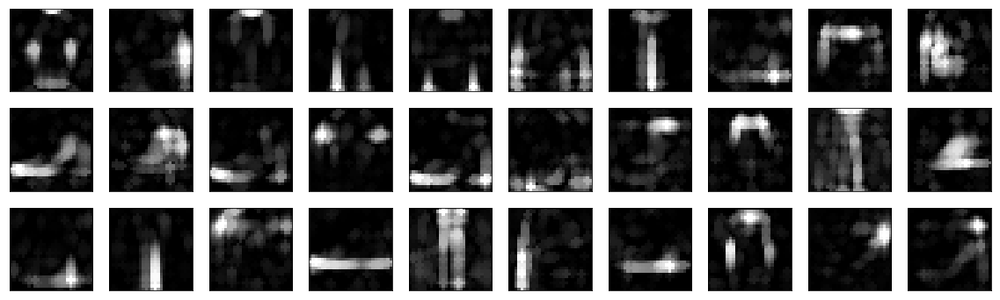

In [44]:
print('Dilatation of the original images')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, x_small, SE_scale=1))
print('Dilatation of the reconstructions')
bastien_utils.plot_all_images(bastien_utils.apply_operator_to_all_images(morphoMaths.dilatation, AE.reconstruction(x_small), SE_scale=1))
AE_dil = AE.apply_operator_to_decoder_atoms(morphoMaths.dilatation, apply_to_bias=False, SE_scale=1)
print('Original images and max-approximation to dilatation')
print('Max-approx error to original: ', test_max_approx_to_Original[i,j], ' - Max-approx error to reconstruction: ', test_max_approx_to_Rec[i,j])
AE_dil.plot_reconstructions(x_small)
print('Dilated of the atom images of the decoder')
AE_dil.plot_atoms_decoder(nb_to_plot=30)